# Inferring personal attributes from purchases data

This is a binary classification task.

The goal of this analysis is not to develop optimized models. It is instead to evaluate whether risks are present by using simple models and our dataset, which is small in comparison to the wealth of data the larger platforms have access to.

In [1]:
import datetime
import random

from IPython.display import display
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Models etc
from sklearn.model_selection import cross_val_score, RepeatedStratifiedKFold, train_test_split
from sklearn.metrics import confusion_matrix,  ConfusionMatrixDisplay
from sklearn.pipeline import Pipeline
from sklearn.decomposition import TruncatedSVD
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn import svm


# For Amazon data, make easier to access col names by defining here
RESPONSE_ID = 'Survey ResponseID'
DATE = 'Order Date'
UNIT_PRICE = 'Purchase Price Per Unit'
QUANTITY = 'Quantity'
STATE = 'Shipping Address State'
TITLE = 'Title'
PRODUCT_CODE = 'ASIN/ISBN (Product Code)'
CATEGORY = 'Category'

# Additional information we add to the products table
GENDERED_CATEGORY = 'GENDERED CATEGORY'
RENAMED_CATEGORY = 'RENAMED CATEGORY'
FIXED_PRODUCT_CODE = 'FIXED ASIN/ISBN'

# column names specific to this notebook are lowercase
TOTAL_SPEND = 'spend' # unit price x quantity
PURCHASES = 'purchases'
PURCHASERS = 'purchasers'

YYYY_MM = 'yyyy-mm'
YEAR = 'year'

# use a consistent random state to reproduce outputs in the models
RANDOM = 0

## Amazon data

Read in Amazon data.

In [2]:
amzn_data_fpath = '../data/amazon-data/amazon-data-cleaned.csv'
amzn_data = pd.read_csv(amzn_data_fpath, parse_dates=['Order Date'])
# convert NaNs in string columns to strings to avoid losing data in groupby/merge operations
amzn_data[PRODUCT_CODE] = amzn_data[PRODUCT_CODE].astype(str)
amzn_data[CATEGORY] = amzn_data[CATEGORY].astype(str)
amzn_data[TITLE] = amzn_data[TITLE].astype(str)
# add date columns for analysis convenience
amzn_data[YEAR] = amzn_data[DATE].apply(lambda d: d.year)
amzn_data[YYYY_MM] = amzn_data[DATE].apply(lambda d: datetime.date.strftime(d, '%Y-%m'))
# add total spend
amzn_data[TOTAL_SPEND] = amzn_data.apply(lambda row: row[UNIT_PRICE]*row[QUANTITY], axis=1)
amzn_data.head(3)

,Order Date,Purchase Price Per Unit,Quantity,Shipping Address State,Title,ASIN/ISBN (Product Code),Category,Survey ResponseID,year,yyyy-mm,spend
0,2018-12-04,7.98,1.0,NJ,SanDisk Ultra 16GB Class 10 SDHC UHS-I Memory ...,B0143RTB1E,FLASH_MEMORY,R_01vNIayewjIIKMF,2018,2018-12,7.98
1,2018-12-22,13.99,1.0,NJ,Betron BS10 Earphones Wired Headphones in Ear ...,B01MA1MJ6H,HEADPHONES,R_01vNIayewjIIKMF,2018,2018-12,13.99
2,2018-12-24,8.99,1.0,NJ,nan,B078JZTFN3,nan,R_01vNIayewjIIKMF,2018,2018-12,8.99


In [3]:
def print_amazon_data_metrics(df):
    print('%s purchases' % len(df))
    print('%s products' % df[PRODUCT_CODE].nunique())
    print('%s categories' % df[CATEGORY].nunique())
    print('%s response Ids' % df[RESPONSE_ID].nunique())
    
print_amazon_data_metrics(amzn_data)

1850717 purchases
939083 products
1872 categories
5027 response Ids


## Preprocess purchases data


Since this analysis is about relationships between response ids, products, product categories, total purchases and spend, we do preprocessing to more efficiently support this analysis.

We make a table mapping Product code (ASIN/ISBN) to product title, category

products_table:
```
ASIN/ISBN (Product Code), Category, Title, Purchasers
```

Some product IDs have multiple (different) titles and categories. We make this the canonical table. Choose the title/category as the most commonly occuring in the dataset.

Purchasers is the number of distinct Response IDs that purchased the product.

We also fixed some badly labeled items:
- fixed product codes that lost leading 0's in the data transfer
- fix miscategorized books found by inspecting ISBNs with strange categories

#### Read in the preprocessed products table

In [4]:
products_table_fpath = './preprocessed/products_table.csv'
products_table = pd.read_csv(products_table_fpath, index_col=0)
products_table.head()

,purchasers,Category,Title,FIXED ASIN/ISBN,MEN,WOMEN,GENDERED CATEGORY,RENAMED CATEGORY
ASIN/ISBN (Product Code),,,,,,,,
B00IX1I3G6,1157,GIFT_CARD,Amazon.com Gift Card Balance Reload,B00IX1I3G6,False,False,GIFT_CARD,GIFT_CARD
B086KKT3RX,875,ABIS_GIFT_CARD,Amazon Reload,B086KKT3RX,False,False,ABIS_GIFT_CARD,ABIS_GIFT_CARD
B07PCMWTSG,543,GIFT_CARD,Amazon.com eGift Card,B07PCMWTSG,False,False,GIFT_CARD,GIFT_CARD
B004LLIKVU,467,GIFT_CARD,Amazon.com eGift Card,B004LLIKVU,False,False,GIFT_CARD,GIFT_CARD
B07FZ8S74R,377,DIGITAL_DEVICE_3,"Echo Dot (3rd Gen, 2018 release) - Smart speak...",B07FZ8S74R,False,False,DIGITAL_DEVICE_3,DIGITAL_DEVICE_3


In [5]:
products_table[CATEGORY].nunique()

1856

In [6]:
print_amazon_data_metrics(amzn_data)

1850717 purchases
939083 products
1872 categories
5027 response Ids


#### Apply the data fixups

In [7]:
print('Updating product codes')
amzn_data[PRODUCT_CODE] = amzn_data[PRODUCT_CODE].map(products_table[FIXED_PRODUCT_CODE])

Updating product codes


In [8]:
print_amazon_data_metrics(amzn_data)

1850717 purchases
937923 products
1872 categories
5027 response Ids


In [9]:
print('Updating categories with updated product codes')
amzn_data[CATEGORY] = amzn_data[PRODUCT_CODE].map(products_table[RENAMED_CATEGORY])
print_amazon_data_metrics(amzn_data)

Updating categories with updated product codes
1850717 purchases
937923 products
5580 categories
5027 response Ids


## Pull out product categories related to Amazon acquisitions


### Books

criteria:

have ISBNs: https://en.wikipedia.org/wiki/ISBN

[Sometimes ISBNs end in X](https://www.isbn.org/faqs_general_questions#:~:text=Back%20to%20top-,Why%20do%20some%20ISBNs%20end%20in%20an%20%22X%22%3F,upper%20case%20X%20can%20appear)

There are some very badly categorized items.

In [10]:
def is_isbn(pcode):
    pcode = str(pcode)
    if (len(pcode) < 9) or (len(pcode) > 13):
        return False
    # Sometimes ISBNs end in X
    if pcode.upper().endswith('X'):
        pcode = pcode[:-1]
    try:
        int(pcode)
        return True
    except Exception as e:
        return False

In [11]:
books_table = products_table[products_table.index.map(is_isbn)==True][[PURCHASERS, CATEGORY, TITLE, RENAMED_CATEGORY]]
print('%s products in the books table' % len(books_table))

59113 products in the books table


In [12]:
print('%s books categories' % books_table[CATEGORY].nunique())

176 books categories


In [13]:
books_table[RENAMED_CATEGORY].value_counts().head(10).to_frame()

,count
RENAMED CATEGORY,
BOOK,14167
BOOK:FICTION,5687
BOOK:JUVENILE FICTION,5595
BOOK:JUVENILE NONFICTION,2576
BOOK:COMICS & GRAPHIC NOVELS,2281
BOOK:BIOGRAPHY & AUTOBIOGRAPHY,1609
BOOK:COOKING,1303
BOOK:RELIGION,1288
BOOK:HISTORY,1271


More than 2500 distinct categories in the books table and most are unique.

In [14]:
books_table[RENAMED_CATEGORY].value_counts().describe().round(1).to_frame()

,count
count,2832.0
mean,20.9
std,320.8
min,1.0
25%,1.0
50%,1.0
75%,2.0
max,14167.0


### Footwear related categories

Amazon acquired Zappos in 2009. At the time this was their largest acquisition, worth about $900 million.

In our previous work: We collected footwear purchases as all purchases with Category matching any of: 

'SHOES', 'TECHNICAL_SPORT_SHOE', 'BOOT', 'SANDAL', 'SLIPPER'

In [15]:
footwear_categories = [
    # these were in our scidata paper
    'SHOES', 'TECHNICAL_SPORT_SHOE', 'BOOT', 'SANDAL', 'SLIPPER',
    # adding socks -- Zappos does sell socks
    'SOCKS', # Zappos.com does sell socks
    #'SHOELACE', Zappos.com does not sell shoelaces
]

In [16]:
footwear_table = products_table[
    products_table[CATEGORY].isin(footwear_categories) &\
    (~products_table.index.isin(list(books_table.index)))
].copy()
print('%s products in the footwear table' % len(footwear_table))
print('%s categories without gender' % footwear_table[CATEGORY].nunique())
print('%s categories with gender' % footwear_table[GENDERED_CATEGORY].nunique())
print(footwear_table[RENAMED_CATEGORY].value_counts())
assert(footwear_table[GENDERED_CATEGORY].nunique() == footwear_table[RENAMED_CATEGORY].nunique())
footwear_table.head()

27358 products in the footwear table
6 categories without gender
18 categories with gender
RENAMED CATEGORY
WOMEN:SHOES                   4591
SHOES                         3617
MEN:SHOES                     3464
SOCKS                         3194
WOMEN:SOCKS                   2102
WOMEN:SANDAL                  2015
MEN:SOCKS                     1603
WOMEN:BOOT                    1436
WOMEN:SLIPPER                 1162
BOOT                           898
SANDAL                         777
SLIPPER                        686
MEN:BOOT                       685
MEN:SANDAL                     532
MEN:SLIPPER                    477
MEN:TECHNICAL_SPORT_SHOE        48
WOMEN:TECHNICAL_SPORT_SHOE      39
TECHNICAL_SPORT_SHOE            32
Name: count, dtype: int64


,purchasers,Category,Title,FIXED ASIN/ISBN,MEN,WOMEN,GENDERED CATEGORY,RENAMED CATEGORY
ASIN/ISBN (Product Code),,,,,,,,
B004QF0TFQ,42,SOCKS,Dickies Men's Dri-tech Moisture Control Crew S...,B004QF0TFQ,True,False,MEN:SOCKS,MEN:SOCKS
B008M5S09S,24,SOCKS,Dickies Men's Dri-tech Moisture Control Crew S...,B008M5S09S,True,False,MEN:SOCKS,MEN:SOCKS
B075P7R3VN,21,SOCKS,Jeasona Women's Cat Socks Cute Animal Socks Su...,B075P7R3VN,False,True,WOMEN:SOCKS,WOMEN:SOCKS
B01MXIE9RT,21,SOCKS,Fruit of the Loom Mens Essential 6 Pack Casual...,B01MXIE9RT,True,False,MEN:SOCKS,MEN:SOCKS
B00MDZWPEO,20,SOCKS,"Hanes Men's Double Tough Crew Socks, 12-pair Pack",B00MDZWPEO,True,False,MEN:SOCKS,MEN:SOCKS


### Whole foods related categories

In 2017 Amazon purchased Whole Foods Market Inc. for $13.7 billion.

We pull Whole Foods categories as those that have 'whole foods' in the title.

There are gendered products, such as mens/womens vitamins.

In [17]:
wholefoods_kws = ['whole foods']
def has_wholefoods_title(title):
    t = str(title).lower()
    return any([w in t for w in wholefoods_kws])

In [18]:
wholefoods_table = products_table[products_table[TITLE].apply(has_wholefoods_title)==True].copy()
print('%s Whole foods products' % len(wholefoods_table))
print('%s categories without gender' % wholefoods_table[CATEGORY].nunique())
print('%s categories with gender' % wholefoods_table[GENDERED_CATEGORY].nunique())
wholefoods_table.head(3)

2353 Whole foods products
121 categories without gender
124 categories with gender


,purchasers,Category,Title,FIXED ASIN/ISBN,MEN,WOMEN,GENDERED CATEGORY,RENAMED CATEGORY
ASIN/ISBN (Product Code),,,,,,,,
B074H4WRNG,80,VEGETABLE,"365 by Whole Foods Market, Organic Baby Spinac...",B074H4WRNG,False,False,VEGETABLE,VEGETABLE
B077L5RXJY,61,VEGETABLE,"365 by Whole Foods Market, Broccoli Florets, 1...",B077L5RXJY,False,False,VEGETABLE,VEGETABLE
B074H5B5H7,48,VEGETABLE,"365 by Whole Foods Market, Broccoli Florets, 1...",B074H5B5H7,False,False,VEGETABLE,VEGETABLE


In [19]:
print('How many gendered categories/products and what are they?')
display(wholefoods_table[wholefoods_table[CATEGORY]!=wholefoods_table[GENDERED_CATEGORY]][GENDERED_CATEGORY].value_counts().to_frame())

How many gendered categories/products and what are they?


,count
GENDERED CATEGORY,
MEN:VITAMIN,7
WOMEN:VITAMIN,2
WOMEN:NUTRITIONAL_SUPPLEMENT,2


---

# Survey data setup

Load survey data and connect with purchases.


In [20]:
# only inspect the fields related to demographics of interest for this notebook
demo_fields = [
    'Survey ResponseID', 
    'Q-demos-gender',
    'Q-demos-age', 'Q-demos-hispanic', 'Q-demos-race',
    'Q-demos-education', 'Q-demos-income', 
    'Q-sexual-orientation', 
    'Q-demos-state', 
    'Q-amazon-use-howmany', 'Q-amazon-use-hh-size', 
    'Q-amazon-use-how-oft',
    'Q-substance-use-cigarettes', 'Q-substance-use-marijuana', 'Q-substance-use-alcohol', 
    'Q-personal-diabetes', 'Q-personal-wheelchair', 
    'Q-life-changes'
]
# Here are the fields
fields_df = pd.read_csv('../data/survey-data/fields.pub.csv', index_col=0).loc[demo_fields]
fields_df

,fields
Survey ResponseID,Response ID
Q-demos-gender,How do you describe yourself?
Q-demos-age,What is your age group?
Q-demos-hispanic,"Are you of Spanish, Hispanic, or Latino origin?"
Q-demos-race,Choose one or more races that you consider you...
Q-demos-education,What is the highest level of education you hav...
Q-demos-income,What was your total household income before ta...
Q-sexual-orientation,Which best describes your sexual orientation?
Q-demos-state,"50 States, D.C. and Puerto Rico"
Q-amazon-use-howmany,How many people do you share your Amazon accou...


In [21]:
# Read in survey data and keep only the columns to be used below
# Want ResponseId, state, and demographic data used to compare purchase behaviors and stratify
survey_data_fpath = '../data/survey-data/survey.pub.csv'
survey_df = pd.read_csv(survey_data_fpath,  usecols=demo_fields).rename(
        columns={RESPONSE_ID: RESPONSE_ID}
).set_index(RESPONSE_ID)
display(survey_df.head(3))

,Q-demos-age,Q-demos-hispanic,Q-demos-race,Q-demos-education,Q-demos-income,Q-demos-gender,Q-sexual-orientation,Q-demos-state,Q-amazon-use-howmany,Q-amazon-use-hh-size,Q-amazon-use-how-oft,Q-substance-use-cigarettes,Q-substance-use-marijuana,Q-substance-use-alcohol,Q-personal-diabetes,Q-personal-wheelchair,Q-life-changes
Survey ResponseID,,,,,,,,,,,,,,,,,
R_1ou69fj4DQGsVcp,35 - 44 years,No,Black or African American,High school diploma or GED,"$25,000 - $49,999",Female,heterosexual (straight),Iowa,2,2,Less than 5 times per month,Yes,No,Yes,No,No,Lost a job
R_2UbJL30HRjK1sdD,45 - 54 years,No,White or Caucasian,High school diploma or GED,"$100,000 - $149,999",Male,heterosexual (straight),Ohio,2,4+,Less than 5 times per month,No,No,No,No,No,NaN
R_UPXamGKtmf4RVIZ,25 - 34 years,No,White or Caucasian,High school diploma or GED,"$25,000 - $49,999",Male,heterosexual (straight),Arkansas,1 (just me!),2,Less than 5 times per month,No,No,No,Yes,No,NaN


Set up use of collapsed income and age groups defined as below.

In [22]:
collapse_age_map = {
    '18 - 24 years': '18 - 34 yrs',
    '25 - 34 years': '18 - 34 yrs',
    '35 - 44 years': '35 - 54 yrs',
    '45 - 54 years': '35 - 54 yrs',
    '55 - 64 years': '55+ yrs',
    '65 and older': '55+ yrs',
}
collapse_income_map = {
    'Less than $25,000': 'Less than $50,000', 
    '$25,000 - $49,999': 'Less than $50,000', 
    '$50,000 - $74,999': '\$50,000 - \$99,999',
    '$75,000 - $99,999': '\$50,000 - \$99,999',
    '$100,000 - $149,999': '$100,000 or more',
    '$150,000 or more': '$100,000 or more',
}
survey_df['age-collapsed'] = survey_df['Q-demos-age'].map(collapse_age_map)
survey_df['income-collapsed'] = survey_df['Q-demos-income'].map(collapse_income_map)
survey_df.head(3)

,Q-demos-age,Q-demos-hispanic,Q-demos-race,Q-demos-education,Q-demos-income,Q-demos-gender,Q-sexual-orientation,Q-demos-state,Q-amazon-use-howmany,Q-amazon-use-hh-size,Q-amazon-use-how-oft,Q-substance-use-cigarettes,Q-substance-use-marijuana,Q-substance-use-alcohol,Q-personal-diabetes,Q-personal-wheelchair,Q-life-changes,age-collapsed,income-collapsed
Survey ResponseID,,,,,,,,,,,,,,,,,,,
R_1ou69fj4DQGsVcp,35 - 44 years,No,Black or African American,High school diploma or GED,"$25,000 - $49,999",Female,heterosexual (straight),Iowa,2,2,Less than 5 times per month,Yes,No,Yes,No,No,Lost a job,35 - 54 yrs,"Less than $50,000"
R_2UbJL30HRjK1sdD,45 - 54 years,No,White or Caucasian,High school diploma or GED,"$100,000 - $149,999",Male,heterosexual (straight),Ohio,2,4+,Less than 5 times per month,No,No,No,No,No,NaN,35 - 54 yrs,"$100,000 or more"
R_UPXamGKtmf4RVIZ,25 - 34 years,No,White or Caucasian,High school diploma or GED,"$25,000 - $49,999",Male,heterosexual (straight),Arkansas,1 (just me!),2,Less than 5 times per month,No,No,No,Yes,No,NaN,18 - 34 yrs,"Less than $50,000"


## Model data set up


## Data thresholds

1. purchases per user: How many users made sufficient number of purchases?


2. products per user: How many users purchased a sufficient number of distinct products

In [23]:
purchases_per_user = amzn_data.groupby([RESPONSE_ID])[DATE].count()

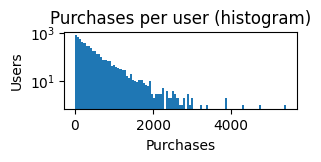

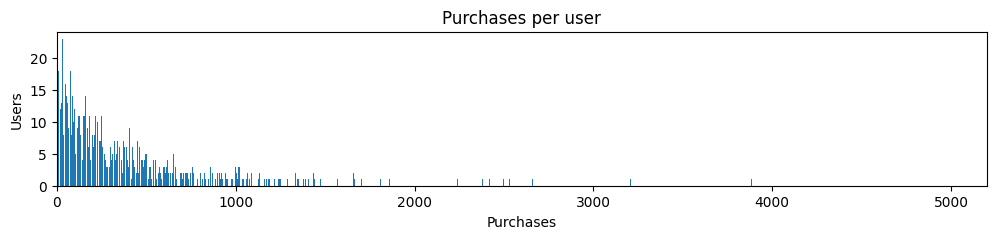

count    5027.000000
mean      368.155361
std       426.407538
min         1.000000
25%        92.000000
50%       232.000000
75%       489.000000
max      5415.000000
Name: Order Date, dtype: float64

In [24]:
fig, ax = plt.subplots(1,1, figsize=(3, 1))
_ = ax.hist(purchases_per_user, bins=100, log=True)
ax.set_xlabel('Purchases')
ax.set_ylabel('Users')
_ = ax.set_title('Purchases per user (histogram)')

fig, ax = plt.subplots(1,1,figsize=(12,2))
ax.set_xlim(0, 5200)
purchases_per_user_valcounts = purchases_per_user.value_counts().sort_index()
ax.bar(purchases_per_user_valcounts.index, purchases_per_user_valcounts)
ax.set_ylabel('Users')
ax.set_xlabel('Purchases')
_ = ax.set_title('Purchases per user')
plt.show()
display(purchases_per_user.describe())

#### Products per user

In [25]:
products_per_user = amzn_data.groupby([RESPONSE_ID])[PRODUCT_CODE].nunique()

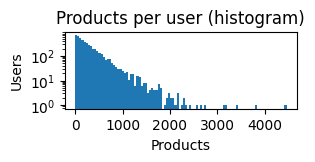

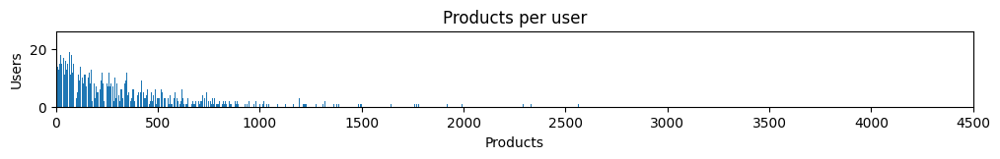

count    5027.000000
mean      308.604536
std       341.298615
min         0.000000
25%        83.000000
50%       205.000000
75%       415.000000
max      4461.000000
Name: ASIN/ISBN (Product Code), dtype: float64

In [26]:
fig, ax = plt.subplots(1,1, figsize=(3, 1))
_ = ax.hist(products_per_user, bins=100, log=True)
ax.set_xlabel('Products')
ax.set_ylabel('Users')
_ = ax.set_title('Products per user (histogram)')

fig, ax = plt.subplots(1,1,figsize=(12,1))
ax.set_xlim(0, 4500)
products_per_user_valcounts = products_per_user.value_counts().sort_index()
ax.bar(products_per_user_valcounts.index, products_per_user_valcounts)
ax.set_ylabel('Users')
ax.set_xlabel('Products')
_ = ax.set_title('Products per user')
plt.show()
display(products_per_user.describe())

How many users and products if we required at least x distinct products purchased?

Make a table:
```
x, users, products
```
where x is the threshold number of distinct products per users

,users,products
x,,
10,4910,1550718
20,4738,1548225
30,4560,1543912
40,4411,1538774
50,4248,1531488
60,4110,1523938
70,3951,1513664
80,3817,1503707
90,3682,1492314


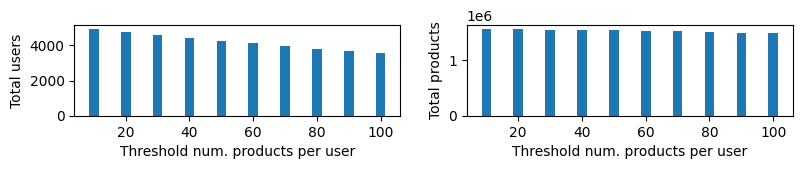

In [27]:
xs = list(range(10, 110, 10))
threshold_products_users_df = pd.DataFrame({
    'x': xs,
    'users': [len(products_per_user[products_per_user >= x]) for x in xs],
    'products': [products_per_user[products_per_user >= x].sum() for x in xs]
}).set_index('x')

fig, (ax1, ax2) = plt.subplots(1,2,figsize=(8,1.5))
plt.tight_layout()
ax1.bar(threshold_products_users_df.index, threshold_products_users_df['users'], 3)
ax2.bar(threshold_products_users_df.index, threshold_products_users_df['products'], 3)
ax1.set_xlabel('Threshold num. products per user')
ax2.set_xlabel('Threshold num. products per user')
ax1.set_ylabel('Total users')
ax1.set_ylabel('Total users')
ax2.set_ylabel('Total products')
threshold_products_users_df

Decision: Initially limit to users with x=50 distinct products purchased.

Get the response ids for these users.

In [28]:
p50_users = products_per_user[products_per_user >= 50].index.tolist()
print('N=%s : restricting data to users who purchased 50 distinct products' % len(p50_users))

N=4248 : restricting data to users who purchased 50 distinct products


In [29]:
p50u_amzn_data = amzn_data[amzn_data[RESPONSE_ID].isin(p50_users)]

In [30]:
cats_valcounts = p50u_amzn_data[CATEGORY].value_counts()
display(cats_valcounts.head(10))
cats_all = cats_valcounts.index.tolist() # default: use all the categories.
cats_valcounts.describe()

Category
NAN                       87297
PET_FOOD                  38208
GIFT_CARD                 26735
NUTRITIONAL_SUPPLEMENT    24878
BOOK                      20250
ELECTRONIC_CABLE          17917
HEALTH_PERSONAL_CARE      16049
MEDICATION                15855
CELLULAR_PHONE_CASE       14127
SKIN_MOISTURIZER          13015
Name: count, dtype: int64

count     5526.000000
mean       330.730547
std       1755.101800
min          1.000000
25%          1.000000
50%          4.000000
75%        112.750000
max      87297.000000
Name: count, dtype: float64

Use categories filtered to those purchased by threshold n=50 distinct users

In [31]:
cats_users = p50u_amzn_data.groupby(CATEGORY)[RESPONSE_ID].nunique().sort_values(ascending=False)
display(cats_users.head(20))
display(cats_users.describe())

Category
NAN                                 4203
ELECTRONIC_CABLE                    3296
CELLULAR_PHONE_CASE                 3211
BOOK                                3160
HEALTH_PERSONAL_CARE                3132
HEADPHONES                          3100
CHARGING_ADAPTER                    2732
NUTRITIONAL_SUPPLEMENT              2606
SKIN_MOISTURIZER                    2576
BATTERY                             2532
HOME                                2486
BEAUTY                              2476
GIFT_CARD                           2455
SCREEN_PROTECTOR                    2412
CLEANING_AGENT                      2378
TOYS_AND_GAMES                      2374
MEDICATION                          2364
PORTABLE_ELECTRONIC_DEVICE_COVER    2354
DRINKING_CUP                        2337
WRITING_INSTRUMENT                  2287
Name: Survey ResponseID, dtype: int64

count    5526.000000
mean      129.031668
std       320.289267
min         1.000000
25%         1.000000
50%         3.500000
75%        89.000000
max      4203.000000
Name: Survey ResponseID, dtype: float64

In [32]:
# use categories that have been purchased by at least 50 users in dataset
cats_u50 = cats_users[cats_users>= 50].index.tolist()
print('%s categories purchased by at least 50 users' % len(cats_u50))
# cats_u50

1619 categories purchased by at least 50 users


### Sort the categories by number of users making purchases and create a table


```
Category, Users, Products, Purchases, avg (median) cost per item
```

In [33]:
top_cats_u50_df = (p50u_amzn_data.groupby([CATEGORY]).agg({
    RESPONSE_ID: 'nunique',
    PRODUCT_CODE: 'nunique',
    QUANTITY: 'count', # Could sum this if want total products purchased
    UNIT_PRICE: 'median',
}).rename(columns={
    RESPONSE_ID: 'Users',
    PRODUCT_CODE: 'Products',
    QUANTITY: 'Purchases',
    UNIT_PRICE: 'Avg (median) item cost'
}).loc[cats_u50]).sort_values('Users', ascending=False)
top_cats_u50_df.round(2)

,Users,Products,Purchases,Avg (median) item cost
Category,,,,
NAN,4203,62029,87297,15.98
ELECTRONIC_CABLE,3296,7406,17917,9.99
CELLULAR_PHONE_CASE,3211,10614,14127,12.99
BOOK,3160,15689,20250,11.71
HEALTH_PERSONAL_CARE,3132,5347,16049,11.99
...,...,...,...,...
VEHICLE_EMBLEM,50,59,64,14.62
WOMEN:GUILD_JEWELRY,50,48,54,24.99
DIGITAL_DEVICE_12_ACCESSORY,50,28,68,19.77


In [34]:
top_cats_u50_df.round(2).head(10)

,Users,Products,Purchases,Avg (median) item cost
Category,,,,
NAN,4203,62029,87297,15.98
ELECTRONIC_CABLE,3296,7406,17917,9.99
CELLULAR_PHONE_CASE,3211,10614,14127,12.99
BOOK,3160,15689,20250,11.71
HEALTH_PERSONAL_CARE,3132,5347,16049,11.99
HEADPHONES,3100,4056,10958,24.99
CHARGING_ADAPTER,2732,3997,8017,14.99
NUTRITIONAL_SUPPLEMENT,2606,6422,24878,19.01
SKIN_MOISTURIZER,2576,3915,13015,12.95


In [35]:
print('How many total products and purchases?')
print('%s total products' % top_cats_u50_df['Products'].sum())
print('%s total purchases' % top_cats_u50_df['Purchases'].sum())

How many total products and purchases?
910474 total products
1802908 total purchases


## Data and labels set up


Want to run models for many labels to test predictive power for each label.


Race
- Black
- White
- Asian

Gender (binary)
- Male
- Female

Age group (collapsed)
- 18 - 34 years
- 35 - 54 years
- 55 and older

Income group (collapsed)


Health / lifestyle (data further restricted to yes/no response)
- diabetes
- smoke
- alcohol
- marijuana

### Set up the data

In [36]:
# Helper for analysis below
# Income group: Sorted and exclude 'Prefer not to say'
income_groups = ['Less than $50,000', '\$50,000 - \$99,999', '$100,000 or more']
age_groups = ['18 - 34 yrs', '35 - 54 yrs', '55+ yrs'] # sorted(survey_df['age-collapsed'].unique())
health_lifestyle_labels = ['Diabetes', 'Cigarettes', 'Marijuana', 'Alcohol']

In [37]:
socio_groups = {
    'Gender': ['Male', 'Female'],
    'Age': age_groups,
    'Race': ['White','Asian','Black'], #,'Hispanic'],
    #'Race and ethnicity': ['White','Asian','Black','Hispanic'],
    #'Income': income_groups,
    'Health / lifestyle': health_lifestyle_labels,
}

### Labels set up


Set up a dictionary:

```
label: {
    'y': pd.Series([boolean representing y value for label], index=ResponseId),
    'train_test_split': (X_train, X_test, y_train, y_test)
    }
```

In [38]:
# set up labels

# For the labels we're interested in, simply create a mapping
# labeled_y = {label_name: Series([boolean representing y for label], index=ResponseId)}
labeled_y = dict()
# Add gender (binary)
for l in ['Male','Female']:
    labeled_y[l] = survey_df['Q-demos-gender'].apply(lambda r: l in str(r)).astype(int).rename(l)
# Add age group
for l in age_groups:
    labeled_y[l] = survey_df['age-collapsed'].apply(lambda r: l in str(r)).astype(int).rename(l)
# Add race and ethnicity
for l in ['White', 'Black', 'Asian']:
    labeled_y[l] = survey_df['Q-demos-race'].apply(lambda r: l in str(r)).astype(int).rename(l)
labeled_y['Hispanic'] = survey_df['Q-demos-hispanic'].apply(lambda h: h=='Yes').astype(int).rename('Hispanic')
# Add income group
for l in income_groups:
    labeled_y[l] = survey_df['income-collapsed'].apply(lambda r: l in str(r)).astype(int).rename(l)

Add personal health/lifestyle

These are treated differently:
- Only include responses of Yes/No. Exclude 
    - 'Prefer not to say'
    - 'I stopped in the recent past'
- This means n is smaller

In [39]:
for l, Q in [('Diabetes', 'Q-personal-diabetes'),('Cigarettes', 'Q-substance-use-cigarettes'),('Marijuana', 'Q-substance-use-marijuana'),('Alcohol', 'Q-substance-use-alcohol')]:
    sdf = survey_df[survey_df[Q].isin(['Yes', 'No'])]
    labeled_y[l] = sdf[Q].apply(lambda r: r=='Yes').astype(int).rename(l)

## Descriptive statistics for users and purchases


Set of boxplots -- one plot for each socio-demographic category 

Plot: Boxplots show # of purchases per user -- separated by demographic

Plot: Boxplots show # distinct categories per user -- separated by demographic

Scatter plot with computed correlation: compare # purchases to # distinct categories 

Histogram for categories in analysis: number of purchases per category


To do this, make a table:
```
ResponseID, purchases, products, categories, Male, Female, ...each demo label
```
Where
- purchases: purchases per user
- products: products per user
- categories: categories per user

Limited to the users in the analysis. i.e. those with at least 50 distinct products purchased

In [40]:
p50u_per_user_stats = pd.DataFrame({
    PURCHASES: p50u_amzn_data.groupby([RESPONSE_ID])[DATE].count(),
    'products': p50u_amzn_data.groupby([RESPONSE_ID])[PRODUCT_CODE].nunique(),
    'categories': p50u_amzn_data.groupby(RESPONSE_ID)[CATEGORY].nunique()
})
# add demographic data
for socio, labels in socio_groups.items():
    for l in labels:
        p50u_per_user_stats[l] = p50u_per_user_stats.index.map(labeled_y[l])
p50u_per_user_stats.head()

,purchases,products,categories,Male,Female,18 - 34 yrs,35 - 54 yrs,55+ yrs,White,Asian,Black,Diabetes,Cigarettes,Marijuana,Alcohol
Survey ResponseID,,,,,,,,,,,,,,,
R_01vNIayewjIIKMF,140,102,51,1,0,0,1,0,0,0,1,0.0,0.0,0.0,0.0
R_037XK72IZBJyF69,1213,1000,403,0,1,0,0,1,1,0,0,0.0,0.0,0.0,1.0
R_038ZU6kfQ5f89fH,69,62,38,1,0,1,0,0,1,0,0,0.0,0.0,0.0,0.0
R_03aEbghUILs9NxD,173,135,86,1,0,0,1,0,1,0,0,0.0,0.0,0.0,0.0
R_06RZP9pS7kONINr,430,385,197,0,1,0,0,1,1,0,0,1.0,0.0,0.0,0.0


In [41]:
# get the discriptive statistics
p50u_per_user_stats[[PURCHASES, 'products', 'categories']].describe().round(1)

,purchases,products,categories
count,4248.0,4248.0,4248.0
mean,430.2,360.5,167.9
std,436.1,347.0,110.8
min,50.0,50.0,10.0
25%,148.0,132.0,82.0
50%,291.0,255.5,142.0
75%,551.2,461.2,225.0
max,5415.0,4461.0,810.0


Purchases, products, categories per user (limited to users with at least 50 products purchased)


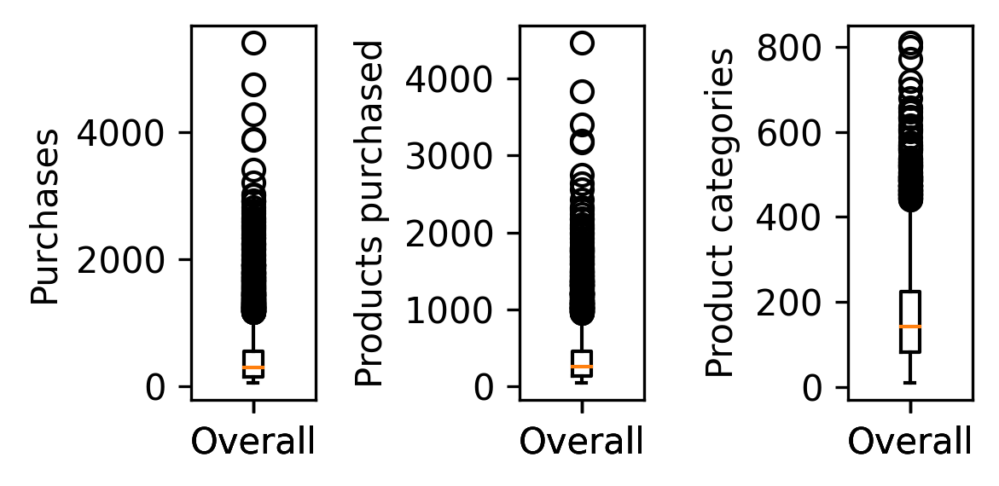

In [42]:
fig, axes = plt.subplots(1,3,figsize=(4,2), sharex=True, dpi=300)
_ = axes[0].boxplot(p50u_per_user_stats[PURCHASES], labels=['Overall'])
axes[0].set_ylabel('Purchases')
_ = axes[1].boxplot(p50u_per_user_stats['products'], labels=['Overall'])
axes[1].set_ylabel('Products purchased')
_ = axes[2].boxplot(p50u_per_user_stats['categories'], labels=['Overall'])
axes[2].set_ylabel('Product categories')
plt.tight_layout()
print('Purchases, products, categories per user (limited to users with at least 50 products purchased)')

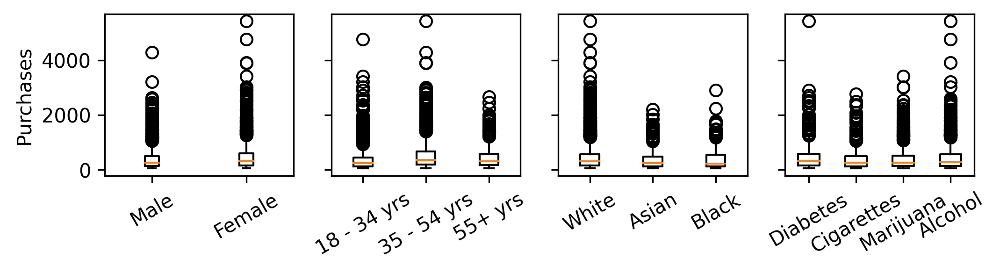

In [43]:
fig, axes = plt.subplots(1, len(socio_groups), figsize=(8, 1.5), sharey=True, dpi=300)
for a, (socio, labels) in enumerate(socio_groups.items()):
    ax = axes[a]
    labels_purchases = [p50u_per_user_stats[p50u_per_user_stats[l]==1][PURCHASES] for l in labels]
    ax.boxplot(labels_purchases, labels=labels)
    if a == 0: ax.set_ylabel('Purchases')
    ax.tick_params(axis='x', labelrotation=30)
    #plt.tight_layout()

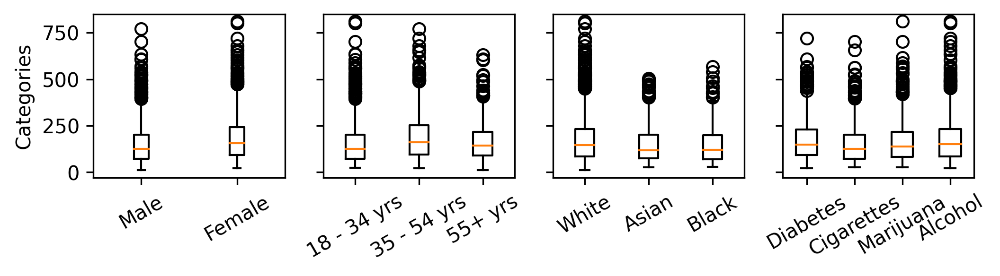

In [44]:
fig, axes = plt.subplots(1, len(socio_groups), figsize=(8, 1.5), sharey=True, dpi=300)
for a, (socio, labels) in enumerate(socio_groups.items()):
    ax = axes[a]
    labels_categories = [p50u_per_user_stats[p50u_per_user_stats[l]==1]['categories'] for l in labels]
    ax.boxplot(labels_categories, labels=labels)
    if a == 0: ax.set_ylabel('Categories')
    ax.tick_params(axis='x', labelrotation=30)
    #plt.tight_layout()

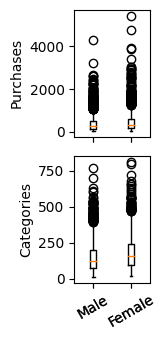

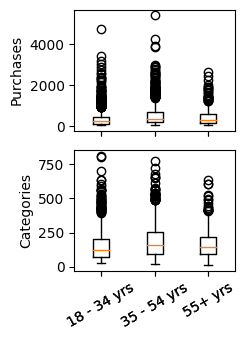

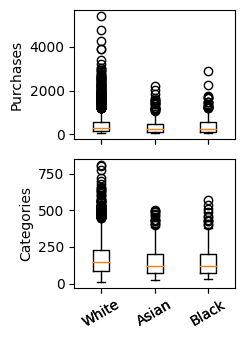

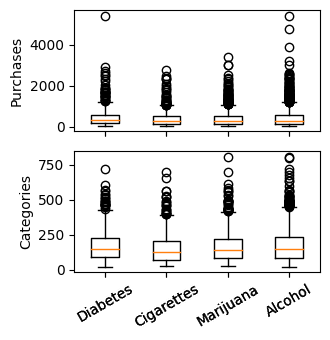

In [45]:
for socio, labels in socio_groups.items():
    fig, axes = plt.subplots(2,1,figsize=(0.85*len(labels),3.5), sharex=True)
    labels_purchases = [p50u_per_user_stats[p50u_per_user_stats[l]==1][PURCHASES] for l in labels]
    labels_categories = [p50u_per_user_stats[p50u_per_user_stats[l]==1]['categories'] for l in labels]
    ax = axes[0]
    ax.boxplot(labels_purchases, labels=labels)
    ax.set_ylabel('Purchases')
    ax = axes[1]
    ax.boxplot(labels_categories, labels=labels)
    ax.set_ylabel('Categories')
    ax.tick_params(axis='x', labelrotation=30)
    plt.tight_layout()

In [46]:
from scipy.stats import pearsonr

# compare purchases to products
# plot, get correlation
print('r=%0.3f (p=%0.3f): Pearson correlation between number of purchases and categories per user' % (
pearsonr(p50u_per_user_stats[PURCHASES], p50u_per_user_stats['categories'])))

print('r=%0.3f (p=%0.3f): Pearson correlation between number of products and categories per user' % (
pearsonr(p50u_per_user_stats['products'], p50u_per_user_stats['categories'])))


r=0.895 (p=0.000): Pearson correlation between number of purchases and categories per user
r=0.936 (p=0.000): Pearson correlation between number of products and categories per user


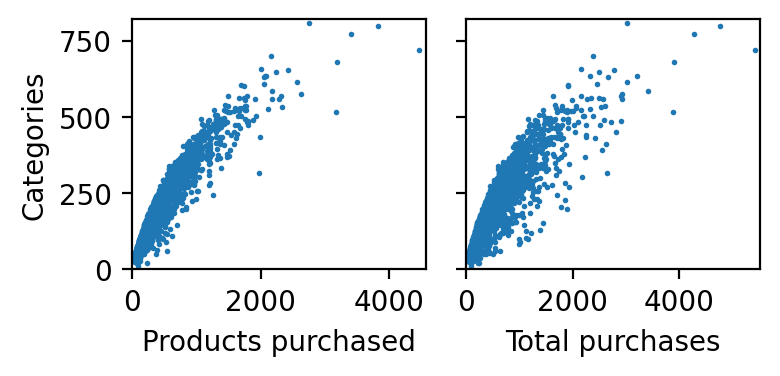

In [47]:
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(4,2), dpi=200, sharey=True)
ax = ax1
ax.scatter(p50u_per_user_stats['products'], p50u_per_user_stats['categories'], 
           s=1)
ax.set_xlim(0, p50u_per_user_stats['products'].max() + 100)
ax.set_ylim(0, p50u_per_user_stats['categories'].max() + 10)
ax.set_xlabel('Products purchased')
ax.set_ylabel('Categories')
# similarly for total purchases
ax=ax2
ax.scatter(p50u_per_user_stats['purchases'], p50u_per_user_stats['categories'], 
           s=1)
ax.set_xlim(0, p50u_per_user_stats['purchases'].max() + 100)
ax.set_ylim(0, p50u_per_user_stats['categories'].max() + 10)
ax.set_xlabel('Total purchases')
#_ = ax.set_ylabel('Categories')
_ = plt.tight_layout()

### Descriptive statistics for participant attributes / labels


In [48]:
labels = ['Male', 'Female'] + age_groups + socio_groups['Race']
pd.DataFrame({
    'Attribute': labels,
    'n': [p50u_per_user_stats[l].sum() for l in labels],
}).set_index('Attribute')

,n
Attribute,
Male,1847
Female,2301
18 - 34 yrs,2084
35 - 54 yrs,1694
55+ yrs,470
White,3555
Asian,376
Black,354


In [49]:
# health_lifestyle_labels = ['Diabetes', 'Cigarettes', 'Marijuana', 'Alcohol']

# Some of the values in the p50u_per_user_stats are nan 
# if they were excluded from labels because they weren't yes/no
pd.DataFrame({
    'Question': health_lifestyle_labels,
    'Yes': [sum(p50u_per_user_stats[l].dropna().astype(int)) for l in health_lifestyle_labels],
    'No': [sum(p50u_per_user_stats[l]==0) for l in health_lifestyle_labels]
}).set_index('Question')

,Yes,No
Question,,
Diabetes,516,3720
Cigarettes,600,3506
Marijuana,892,3215
Alcohol,1874,2229


### Make feature vectors with categories

Assume n categories for creating features

x_i = [x1, x2, ...,xn] for the n categories

To define feature vectors we one-hot-encode by category (was an item with the category ever purchased)

In [50]:
def get_category_one_hot_encoding(amzn_df, category, rids):
    """
    Returns vector representing all response IDs in preprocessed df. 
    1/0 indicates whether ResponseId ever purchased category.
    """
    return ((amzn_df[amzn_df[CATEGORY]==category]
             .groupby(RESPONSE_ID)[QUANTITY].sum() > 0)
            .reindex(rids).fillna(0).astype(int))

def get_X_one_hot_encoding_for_categories(amzn_df, cats, rids=None):
    rids = amzn_df[RESPONSE_ID].unique() if rids is None else rids
    X_dict = {c: get_category_one_hot_encoding(amzn_df, c, rids) for c in cats}
    X_dict[RESPONSE_ID] = rids
    return pd.DataFrame(X_dict).set_index(RESPONSE_ID)

In [51]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

def get_auc_plot_roc(clf, X_test, y_test, ylabel, ax=None):
    if ax is None:
        fig, ax = plt.subplots(1,1,figsize=(3,3))
    # generate a no skill prediction (majority class)
    ns_probs = [0 for _ in range(len(y_test))]
    probs = clf.predict_proba(X_test)
    # keep probabilities for positive outcomes only
    probs = probs[:, 1]
    # calculate auc
    auc = roc_auc_score(y_test, probs)
    # calculate roc curves
    ns_fpr, ns_tpr, _ = roc_curve(y_test, ns_probs)
    fpr, tpr, _ = roc_curve(y_test, probs)
    # plot the roc curve for the model
    ax.plot(ns_fpr, ns_tpr, linestyle='--')
    ax.plot(fpr, tpr, marker='.', label='%s; AUC=%.3f'%(ylabel, auc))
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.legend()
    print('ROC AUC=%.3f' % (auc))
    return auc

In [52]:
def setup_labeled_X_y_data(X, labeled_y):
    """
    Args:
        X is encoded data, indexed by ResponseId
        labeled_y is a dictionary: {label: Series([boolean y for label], index=ResponseId)}
    Assumes use of survey data
    
    Returns dictionary for each label in Ds:
    label: {
        'y': Series([boolean representing y value for label], index=ResponseId),
        'train_test_split': (X_train, X_test, y_train, y_test)
    }
    """
    X_y_data = {label: {} for label in labeled_y.keys()} 
    for label, ys in labeled_y.items():
        Xl = X[X.index.isin(ys.index)] # some ys (health/lifestyle) restricted to subset
        rids = Xl.index # use consistent order for ResponseIds
        y = ys.loc[rids]
        X_y_data[label]['y'] = y
        X_y_data[label]['train_test_split'] = train_test_split(Xl, y, test_size=0.2, stratify=y, random_state=RANDOM)
    return X_y_data

In [53]:
def get_auc(clf, X_test, y_test):
    probs = clf.predict_proba(X_test)
    # keep probabilities for positive outcomes only
    probs = probs[:, 1]
    return roc_auc_score(y_test, probs)

def get_auc_and_plot(clf, X_test, y_test, plot=True, axes=None):
    if not plot:
        return get_auc(clf, X_test, y_test)
    # plotting
    print('Mean accuracy: %0.4f' % clf.score(X_test, y_test))
    if axes is None:
        fig, axes = plt.subplots(1,2,figsize=(6,3))
    plt.tight_layout(pad=3)
    ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, ax=axes[0], display_labels=['non-%s'%label, label])
    axes[0].set_title('Confusion matrix')
    auc = get_auc_plot_roc(clf, X_test, y_test.values, label, ax=axes[1])
    assert (auc == get_auc(clf, X_test, y_test))
    return auc

### Run the models

X: one-hot-encoded

Limit data to:
- users who purchased at least p=50 distinct products
- categories purchased by at least n=50 distinct users

In [54]:
print(datetime.datetime.now())
X = get_X_one_hot_encoding_for_categories(p50u_amzn_data, cats_u50)
print(datetime.datetime.now())

2024-11-16 23:27:25.136790
2024-11-16 23:28:39.084130


In [55]:
X_y_data = setup_labeled_X_y_data(X, labeled_y)


2024-11-16 23:28:39.550240
1/16: SVM for Male
Mean accuracy: 0.8235
ROC AUC=0.893

2024-11-16 23:29:21.052044
2/16: SVM for Female
Mean accuracy: 0.8365
ROC AUC=0.912

2024-11-16 23:30:05.926700
3/16: SVM for 18 - 34 yrs
Mean accuracy: 0.7376
ROC AUC=0.808

2024-11-16 23:31:00.351498
4/16: SVM for 35 - 54 yrs
Mean accuracy: 0.6565
ROC AUC=0.712

2024-11-16 23:31:57.251602
5/16: SVM for 55+ yrs
Mean accuracy: 0.8918
ROC AUC=0.868

2024-11-16 23:32:39.152027
6/16: SVM for White
Mean accuracy: 0.8188
ROC AUC=0.791

2024-11-16 23:33:32.403462
7/16: SVM for Black
Mean accuracy: 0.9071
ROC AUC=0.806

2024-11-16 23:34:11.074460
8/16: SVM for Asian
Mean accuracy: 0.8953
ROC AUC=0.764

2024-11-16 23:34:50.818899
9/16: SVM for Hispanic
Mean accuracy: 0.8400
ROC AUC=0.594

2024-11-16 23:35:41.873722
10/16: SVM for Less than $50,000
Mean accuracy: 0.6847
ROC AUC=0.736

2024-11-16 23:36:41.757594
11/16: SVM for \$50,000 - \$99,999
Mean accuracy: 0.5494
ROC AUC=0.500

2024-11-16 23:37:46.021562
12/

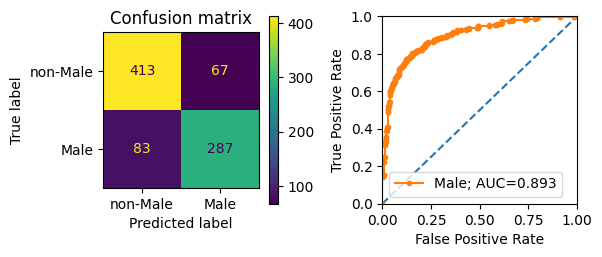

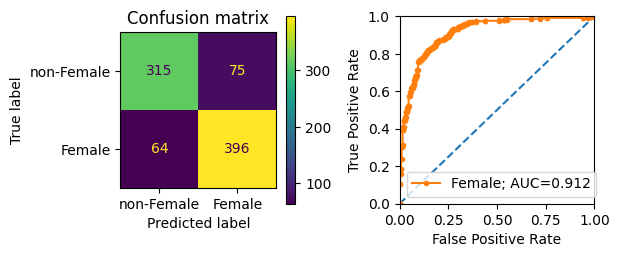

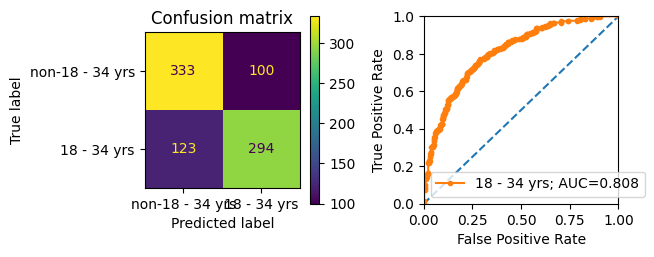

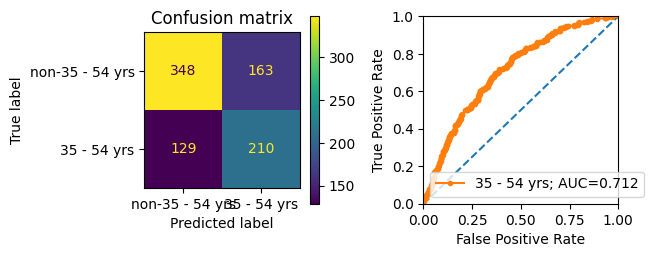

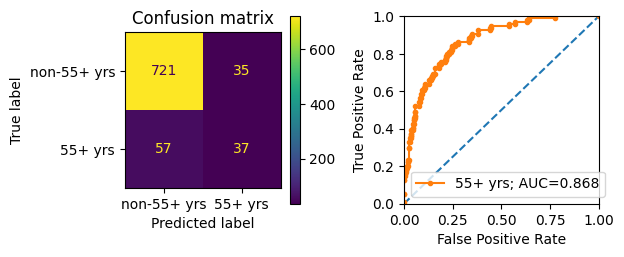

...

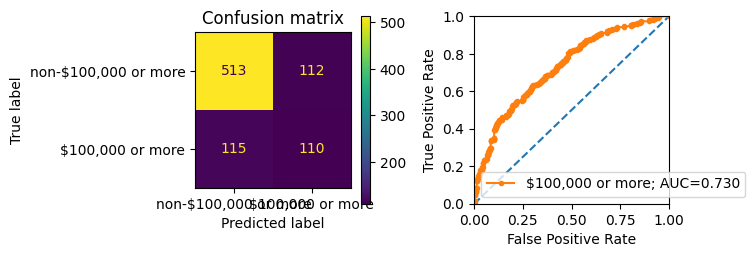

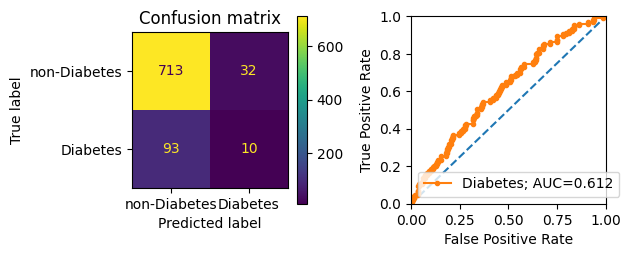

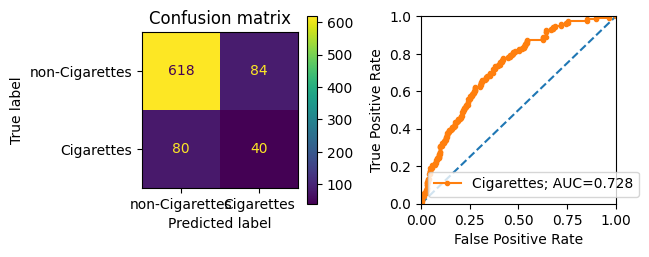

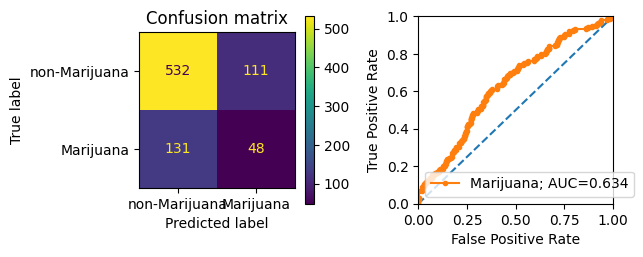

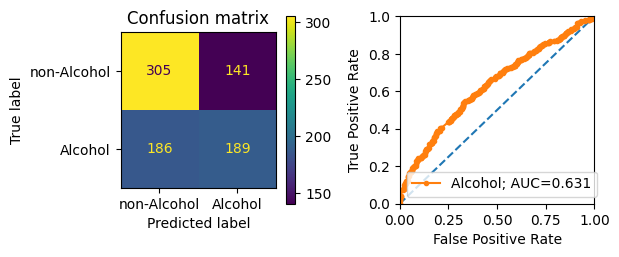

In [56]:
# results dict: map label to svm results
onehot_svm_results = dict()
onehot_svm_models = dict() # keep around the trained models
use_labels = X_y_data.keys()
for i, label in enumerate(use_labels):
    print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), i+1, len(use_labels), label))
    X_train, X_test, y_train, y_test = X_y_data[label]['train_test_split']
    clf = svm.SVC(probability=True, class_weight='balanced', random_state=RANDOM)
    clf.fit(X_train, y_train)
    onehot_svm_models[label] = clf
    auc = get_auc_and_plot(clf, X_test, y_test)
    onehot_svm_results[label] = auc

In [57]:
# show a table with the AUROC scores
onehot_svm_results_df = pd.DataFrame({
    'AUROC': onehot_svm_results.values(),
}, index=list(onehot_svm_results.keys())).round(3)
onehot_svm_results_df

,AUROC
Male,0.893
Female,0.912
18 - 34 yrs,0.808
35 - 54 yrs,0.712
55+ yrs,0.868
White,0.791
Black,0.806
Asian,0.764
Hispanic,0.594
"Less than $50,000",0.736


### Comparison check with Logistic regression

We do this again with Logistic regression

Using same feature vectors, same train/test split.


2024-11-16 23:42:21.320881
1/16: Logistic regression for Male
Mean accuracy: 0.7635
ROC AUC=0.822

2024-11-16 23:42:21.679809
2/16: Logistic regression for Female
Mean accuracy: 0.8000
ROC AUC=0.852

2024-11-16 23:42:22.045086
3/16: Logistic regression for 18 - 34 yrs
Mean accuracy: 0.6694
ROC AUC=0.737

2024-11-16 23:42:22.521386
4/16: Logistic regression for 35 - 54 yrs


/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Mean accuracy: 0.6047
ROC AUC=0.632

2024-11-16 23:42:23.018887
5/16: Logistic regression for 55+ yrs
Mean accuracy: 0.8647
ROC AUC=0.802

2024-11-16 23:42:23.373418
6/16: Logistic regression for White
Mean accuracy: 0.7788
ROC AUC=0.749

2024-11-16 23:42:23.710559
7/16: Logistic regression for Black
Mean accuracy: 0.8788
ROC AUC=0.769

2024-11-16 23:42:24.033282
8/16: Logistic regression for Asian
Mean accuracy: 0.8553
ROC AUC=0.740

2024-11-16 23:42:24.371207
9/16: Logistic regression for Hispanic
Mean accuracy: 0.8035
ROC AUC=0.584

2024-11-16 23:42:24.778998
10/16: Logistic regression for Less than $50,000


/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Mean accuracy: 0.6365
ROC AUC=0.669

2024-11-16 23:42:25.321697
11/16: Logistic regression for \$50,000 - \$99,999


/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Mean accuracy: 0.4835
ROC AUC=0.445

2024-11-16 23:42:25.866513
12/16: Logistic regression for $100,000 or more


/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Mean accuracy: 0.6541
ROC AUC=0.627

2024-11-16 23:42:26.386417
13/16: Logistic regression for Diabetes
Mean accuracy: 0.7524
ROC AUC=0.569

2024-11-16 23:42:26.842108
14/16: Logistic regression for Cigarettes
Mean accuracy: 0.7311
ROC AUC=0.681

2024-11-16 23:42:27.244786
15/16: Logistic regression for Marijuana
Mean accuracy: 0.6667
ROC AUC=0.618

2024-11-16 23:42:27.699040
16/16: Logistic regression for Alcohol
Mean accuracy: 0.5786
ROC AUC=0.618


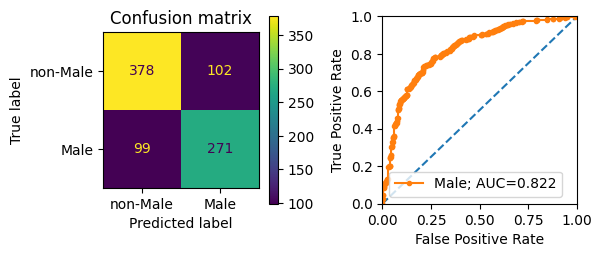

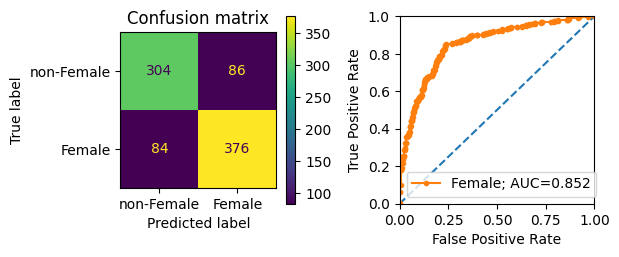

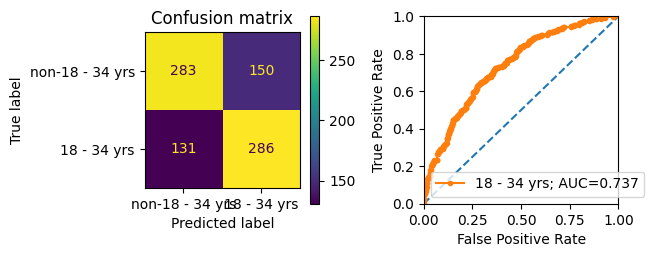

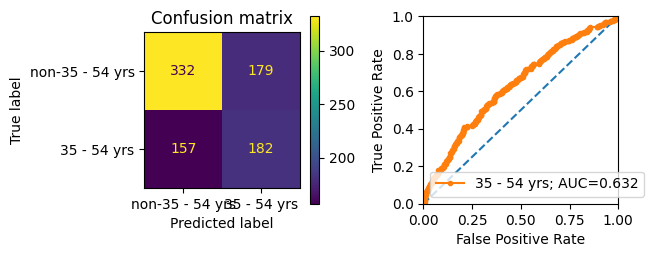

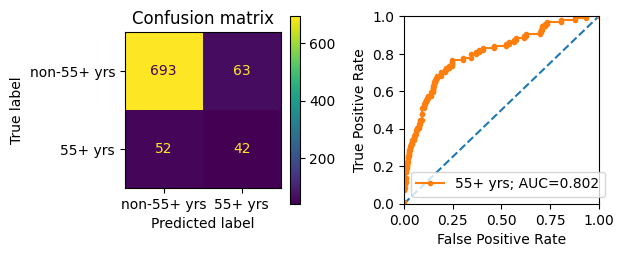

...

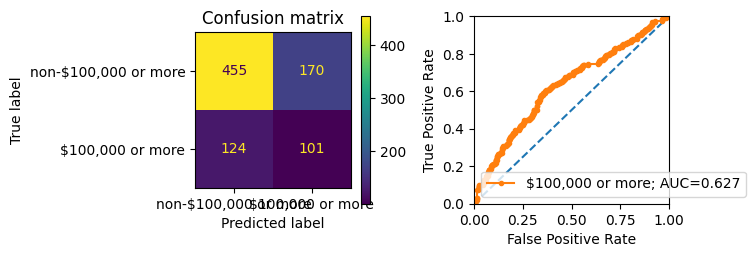

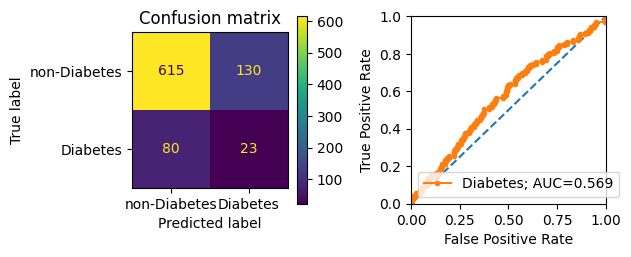

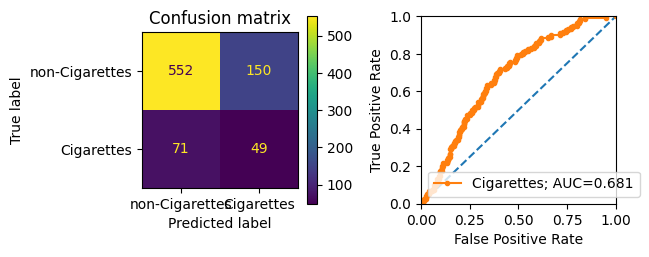

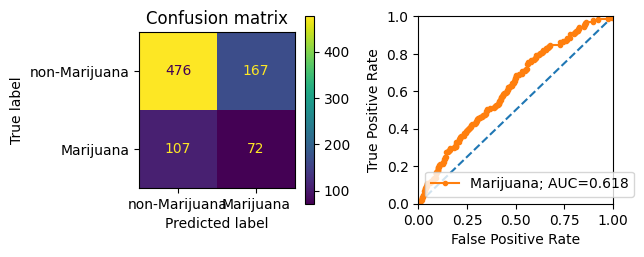

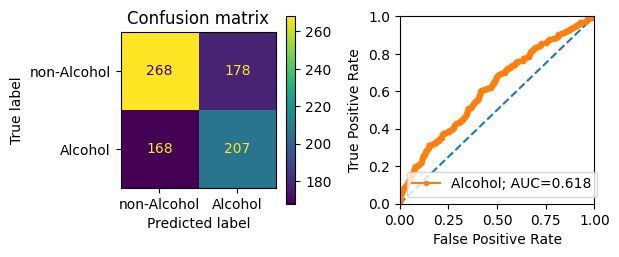

In [58]:
# results dict: map label to svm results
onehot_lr_results = dict()
onehot_lr_models = dict() # keep around the trained models
use_labels = X_y_data.keys()
for i, label in enumerate(use_labels):
    print('\n%s\n%s/%s: Logistic regression for %s' % (datetime.datetime.now(), i+1, len(use_labels), label))
    X_train, X_test, y_train, y_test = X_y_data[label]['train_test_split']
    clf = LogisticRegression(class_weight='balanced', random_state=RANDOM)
    clf.fit(X_train, y_train)
    onehot_lr_models[label] = clf
    auc = get_auc_and_plot(clf, X_test, y_test)
    onehot_lr_results[label] = auc

In [59]:
# show a table with the AUROC scores
onehot_lr_results_df = pd.DataFrame({
    'AUROC': onehot_lr_results.values(),
}, index=list(onehot_lr_results.keys())).round(3)
onehot_lr_results_df

,AUROC
Male,0.822
Female,0.852
18 - 34 yrs,0.737
35 - 54 yrs,0.632
55+ yrs,0.802
White,0.749
Black,0.769
Asian,0.740
Hispanic,0.584
"Less than $50,000",0.669


### Single purchasers

How does this change when the data are limited to users who are single households and do not share their amazon account with anyone?

single_pp50u_df: single person in household and using account (after other data restrictions)

i.e. 
- Q-amazon-use-howmany = 1
- Q-amazon-use-hh-size = 1

In [60]:
# add a flag to the survey df indicating if someone is a single purchaser
SINGLE_PURCHASER = 'Single purchaser'
def is_single_purchaser(row):
    return ((row['Q-amazon-use-howmany']=='1 (just me!)') and (row['Q-amazon-use-hh-size']=='1 (just me!)'))

survey_df[SINGLE_PURCHASER] = survey_df.apply(is_single_purchaser, axis=1)
single_purchaser_rids = survey_df[survey_df[SINGLE_PURCHASER]==True].index.tolist()
print('%0.3f = %s/%s of users are single purchasers' % (len(single_purchaser_rids)/len(survey_df), len(single_purchaser_rids), len(survey_df)))

0.216 = 1086/5027 of users are single purchasers


How many people do you share your Amazon account with? i.e. how many people log in and make orders using your account?
How many people are in your "household"?


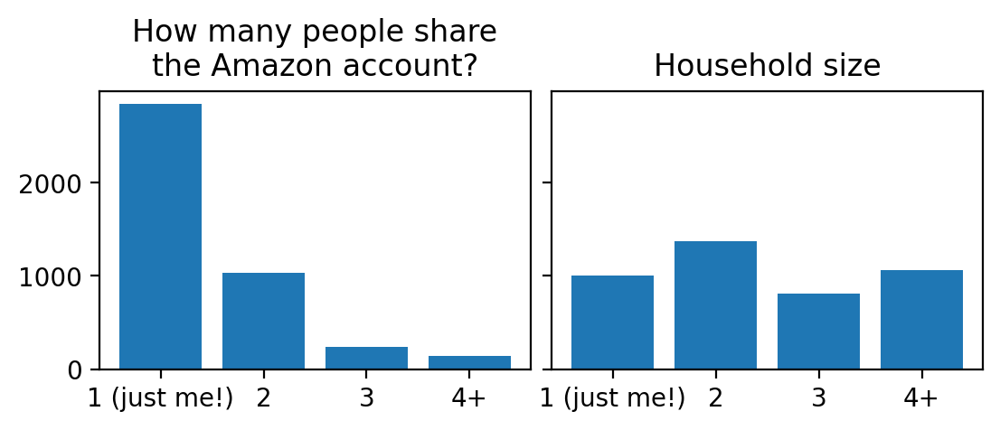

In [164]:
fig, axes = plt.subplots(1, 2, figsize=(6.3,2), sharey=True, dpi=200)
# plt.tight_layout()
plt.subplots_adjust(wspace=0.05)
Q1 = 'Q-amazon-use-howmany'
print(fields_df.loc[Q1][0])
Q1_valcounts = survey_df.loc[p50_users][Q1].value_counts().sort_index()
ax = axes[0]
ax.set_title('How many people share\nthe Amazon account?')
ax.bar(Q1_valcounts.index, Q1_valcounts)
Q2 = 'Q-amazon-use-hh-size'
print(fields_df.loc[Q2][0])
Q2_valcounts = survey_df.loc[p50_users][Q2].value_counts().sort_index()
ax = axes[1]
ax.set_title('Household size')
_ = ax.bar(Q2_valcounts.index, Q2_valcounts)

In [62]:
X_single_purchaser = X.loc[list(set.intersection(set(single_purchaser_rids), set(p50_users)))]
print('%s/%s of the users who purchased at least 50 products are single purchasers' % (
len(X_single_purchaser), len(X)))
# X_single_purchaser.head(3)

898/4248 of the users who purchased at least 50 products are single purchasers


In [63]:
nonsingle_purchaser_rids = survey_df[survey_df[SINGLE_PURCHASER]==False].index.tolist()
X_nonsingle_purchaser = X.loc[list(set.intersection(set(nonsingle_purchaser_rids), set(p50_users)))]
print('%s/%s of the users who purchased at least 50 products are NON-single purchasers' % (
len(X_nonsingle_purchaser), len(X)))
# X_single_purchaser.head(3)

3350/4248 of the users who purchased at least 50 products are NON-single purchasers


#### Single purchasers vs non-single purchasers

Compare the probability scores for single vs non-single purchasers

In [64]:
single_purchaser_rids = survey_df[survey_df[SINGLE_PURCHASER]==True].index.tolist()
nonsingle_purchaser_rids = survey_df[survey_df[SINGLE_PURCHASER]==False].index.tolist()

##### What are demographics for the single-purchasers?

In [65]:
print('Single purchaser demographics')
print('N=%s' % len(p50u_per_user_stats[p50u_per_user_stats.index.isin(single_purchaser_rids)]))
labels = ['Male', 'Female'] + age_groups + socio_groups['Race']
display(pd.DataFrame({
    'Attribute': labels,
    'n': [p50u_per_user_stats[p50u_per_user_stats.index.isin(single_purchaser_rids)][l].sum() for l in labels],
}).set_index('Attribute'))
display(pd.DataFrame({
    'Question': health_lifestyle_labels,
    'Yes': [sum(p50u_per_user_stats[p50u_per_user_stats.index.isin(single_purchaser_rids)][l].dropna().astype(int)) for l in health_lifestyle_labels],
    'No': [sum(p50u_per_user_stats[p50u_per_user_stats.index.isin(single_purchaser_rids)][l]==0) for l in health_lifestyle_labels]
}).set_index('Question'))

Single purchaser demographics
N=898


,n
Attribute,
Male,398
Female,471
18 - 34 yrs,463
35 - 54 yrs,288
55+ yrs,147
White,746
Asian,77
Black,74


,Yes,No
Question,,
Diabetes,61,835
Cigarettes,98,760
Marijuana,160,705
Alcohol,358,496


Make an AUC score results table:

```
label, Single purchaser, Non-single purchaser
```

In [66]:
"""
Make a dict:
accuracy_results_single_vs_non
{label: {'Single purchaser': AUC, 'Non-single purchaser': AUC}
where the test sample is limited to either single purchasers or non-single purchasers
"""
use_labels = X_y_data.keys()
score_single_vs_non = dict()
for i, label in enumerate(use_labels):
    if label == 'Became pregnant': continue
    print('%s: %s: %s' % (datetime.datetime.now(), i, label))
    score_single_vs_non[label] = dict()
    clf = onehot_svm_models[label]
    # get the test data
    _X_train, X_test, _y_train, y_test = X_y_data[label]['train_test_split']
    # single purchasers
    sp_X_test = X_test[X_test.index.isin(single_purchaser_rids)]
    sp_y_test = y_test[y_test.index.isin(single_purchaser_rids)]
    # non single purchasers
    nsp_X_test = X_test[X_test.index.isin(nonsingle_purchaser_rids)]
    nsp_y_test = y_test[y_test.index.isin(nonsingle_purchaser_rids)]
    score_single_vs_non[label]['Single purchaser'] = get_auc_and_plot(clf, sp_X_test, sp_y_test, plot=False)
    score_single_vs_non[label]['Non-single purchaser'] = get_auc_and_plot(clf, nsp_X_test, nsp_y_test, plot=False)

2024-11-16 23:42:29.790852: 0: Male
2024-11-16 23:42:31.723844: 1: Female
2024-11-16 23:42:33.647096: 2: 18 - 34 yrs
2024-11-16 23:42:36.125234: 3: 35 - 54 yrs
2024-11-16 23:42:38.750794: 4: 55+ yrs
2024-11-16 23:42:40.602876: 5: White
2024-11-16 23:42:42.833012: 6: Black
2024-11-16 23:42:44.580240: 7: Asian
2024-11-16 23:42:46.428950: 8: Hispanic
2024-11-16 23:42:48.714846: 9: Less than $50,000
2024-11-16 23:42:51.338915: 10: \$50,000 - \$99,999
2024-11-16 23:42:54.166585: 11: $100,000 or more
2024-11-16 23:42:56.814638: 12: Diabetes
2024-11-16 23:42:59.193716: 13: Cigarettes
2024-11-16 23:43:01.464024: 14: Marijuana
2024-11-16 23:43:03.937174: 15: Alcohol


In [67]:
# make the table
score_single_vs_non_df = pd.DataFrame({
    'label': score_single_vs_non.keys(),
    'Single purchaser': [score_single_vs_non[l]['Single purchaser'] for l in score_single_vs_non.keys()],
    'Non-single purchaser': [score_single_vs_non[l]['Non-single purchaser'] for l in score_single_vs_non.keys()],
}).set_index('label')
score_single_vs_non_df.round(3)

,Single purchaser,Non-single purchaser
label,,
Male,0.962,0.869
Female,0.968,0.894
18 - 34 yrs,0.813,0.808
35 - 54 yrs,0.661,0.723
55+ yrs,0.884,0.855
White,0.763,0.798
Black,0.785,0.810
Asian,0.727,0.774
Hispanic,0.592,0.598


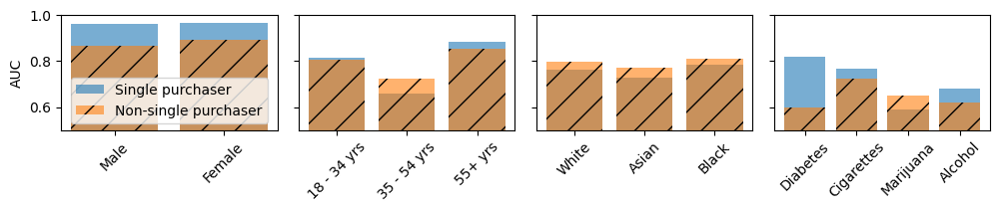

In [68]:
# Plot results
c_sp = 'tab:blue'
c_nsp = 'tab:orange'

cols = len(socio_groups)
fig, axes = plt.subplots(1,cols, figsize=(3*cols, 1.5), sharey=True)
plt.subplots_adjust(wspace=0.1)
for i, (socio, labels) in enumerate(socio_groups.items()):
    ax = axes[i]
    if i == 0:
        ax.set_ylabel('AUC')
    sp_data = score_single_vs_non_df.loc[labels]['Single purchaser']
    nsp_data = score_single_vs_non_df.loc[labels]['Non-single purchaser']
    ax.bar(sp_data.index, sp_data, color=c_sp, alpha=0.6, hatch=None, label='Single purchaser')
    ax.bar(nsp_data.index, nsp_data, color=c_nsp, alpha=0.6, hatch='/', label='Non-single purchaser')
    if i==0: 
        ax.set_ylabel('AUC')
        ax.legend(loc='lower center')
    ax.tick_params(axis='x', labelrotation=45)
    ax.set_ylim(0.5,1)

In [69]:
import scipy.stats as st

def get_CI_colname(label):
    return '%s 95 CI'%label

### How does more information about consumers' purchases contribute to risk?

We assess this in multiple ways.



#### Subsampling categories


Subsample categories from the list of total categories used in the main models and use this subsample to trian and test the models. 

##### Groups of categories related to acquisitions

Accumulating categories

- 0: Starting with books
- 1: Footwear products (Zappos)
- 2: Whole foods products (Whole foods market acquisition)
- 3: Everything else

0. Books only

Use only products in the books table (have ISBNs)

In [70]:
books_table.head(3)

,purchasers,Category,Title,RENAMED CATEGORY
ASIN/ISBN (Product Code),,,,
0143127748,65,BOOK,"The Body Keeps the Score: Brain, Mind, and Bod...",BOOK:MEDICAL
1524763136,63,BOOK,Becoming,BOOK:BIOGRAPHY & AUTOBIOGRAPHY
0735211299,59,BOOK,Atomic Habits: An Easy & Proven Way to Build G...,BOOK:BUSINESS & ECONOMICS


In [71]:
books_cats = set(books_table[RENAMED_CATEGORY].unique()).intersection(set(cats_u50))
print('%s books categories' % len(list(books_table[RENAMED_CATEGORY].unique())))
print('%s books categories purchased by at least 50 users' % len(books_cats))

2832 books categories
190 books categories purchased by at least 50 users


In [72]:
books_amzn_data = p50u_amzn_data[p50u_amzn_data[PRODUCT_CODE].isin(books_table.index)]
print('%s purchases in data limited to books' % len(books_amzn_data))
books_amzn_data[[DATE,TOTAL_SPEND,QUANTITY,TITLE,PRODUCT_CODE,CATEGORY,RESPONSE_ID]].head(3)

87157 purchases in data limited to books


,Order Date,spend,Quantity,Title,ASIN/ISBN (Product Code),Category,Survey ResponseID
163,2018-02-11,14.02,1.0,"TASC Strategies, Practice & Review 2017-2018 w...",1625233000,BOOK,R_037XK72IZBJyF69
164,2018-02-14,19.36,1.0,GED Test Prep Plus 2018: 2 Practice Tests + Pr...,1506223605,BOOK,R_037XK72IZBJyF69
185,2018-04-19,7.95,1.0,Awakening at Midlife: A Guide to Reviving Your...,1573226327,BOOK:SELF-HELP,R_037XK72IZBJyF69


In [73]:
print('Getting feature vectors from books data')
print(datetime.datetime.now())
X_books = get_X_one_hot_encoding_for_categories(books_amzn_data, books_cats)
print(datetime.datetime.now())

Getting feature vectors from books data
2024-11-16 23:43:06.902463
2024-11-16 23:43:07.510033


In [74]:
X_y_data_books = setup_labeled_X_y_data(X_books, labeled_y)


2024-11-16 23:43:07.572399
1/4: books SVM for socio Gender: ['Male', 'Female']

2024-11-16 23:43:07.572518
0/2: SVM for Male
Mean accuracy: 0.5898
ROC AUC=0.656

2024-11-16 23:43:12.723009
1/2: SVM for Female
Mean accuracy: 0.6081
ROC AUC=0.634

2024-11-16 23:43:17.855361
2/4: books SVM for socio Age: ['18 - 34 yrs', '35 - 54 yrs', '55+ yrs']

2024-11-16 23:43:17.855419
0/3: SVM for 18 - 34 yrs
Mean accuracy: 0.6237
ROC AUC=0.660

2024-11-16 23:43:22.915397
1/3: SVM for 35 - 54 yrs
Mean accuracy: 0.6029
ROC AUC=0.627

2024-11-16 23:43:27.960761
2/3: SVM for 55+ yrs
Mean accuracy: 0.6953
ROC AUC=0.619

2024-11-16 23:43:32.440288
3/4: books SVM for socio Race: ['White', 'Asian', 'Black']

2024-11-16 23:43:32.440321
0/3: SVM for White
Mean accuracy: 0.6445
ROC AUC=0.663

2024-11-16 23:43:36.940354
1/3: SVM for Asian
Mean accuracy: 0.7122
ROC AUC=0.624

2024-11-16 23:43:40.966783
2/3: SVM for Black
Mean accuracy: 0.6771
ROC AUC=0.579

2024-11-16 23:43:45.150329
4/4: books SVM for socio He

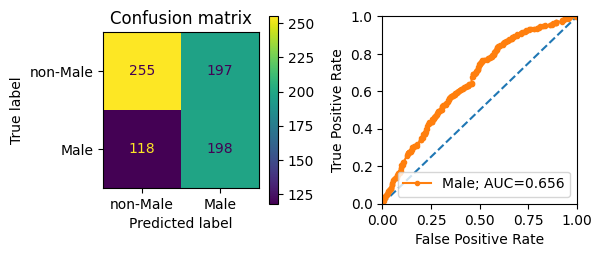

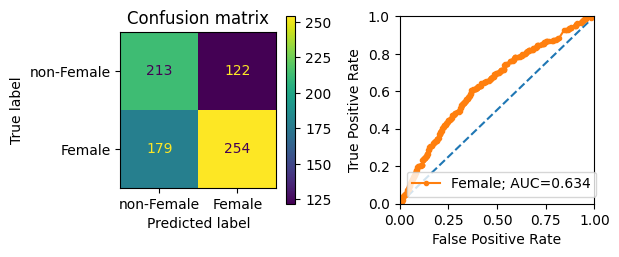

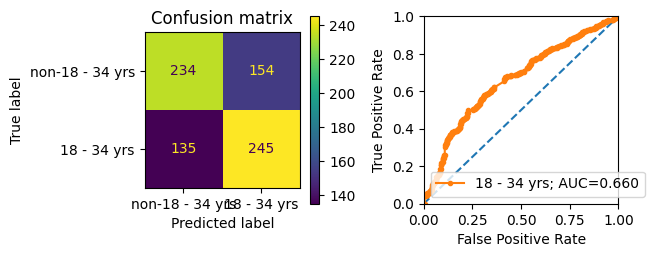

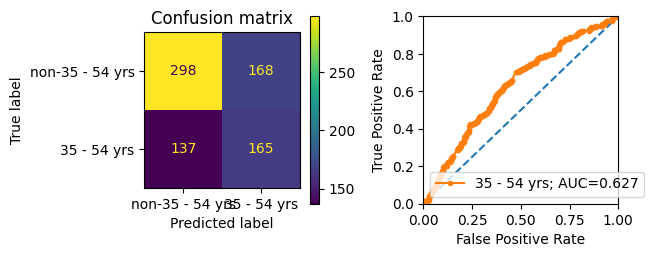

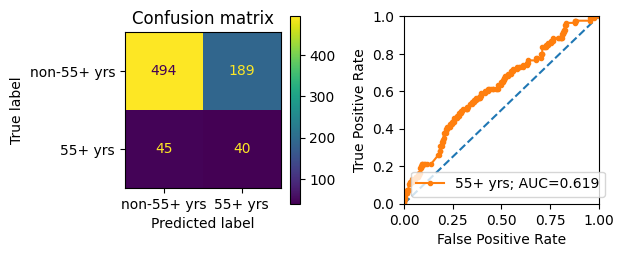

...

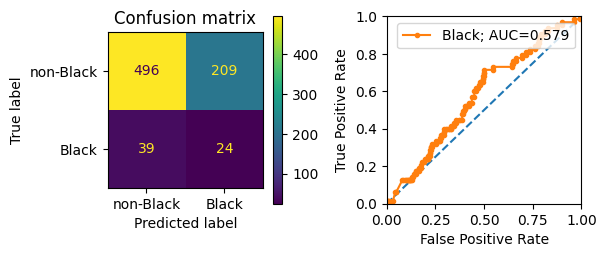

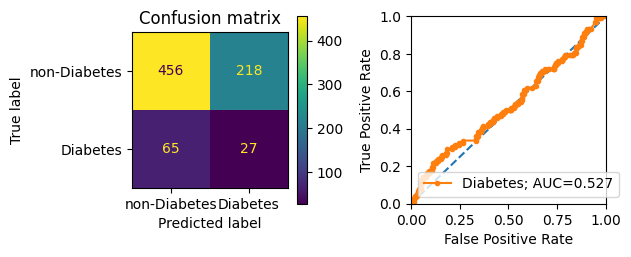

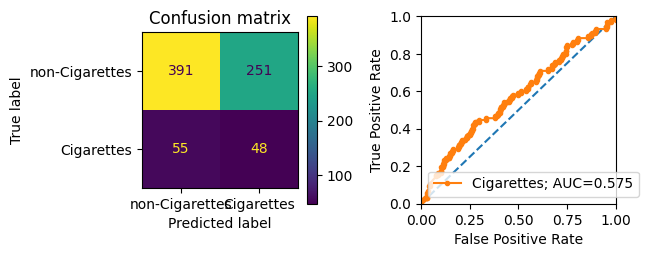

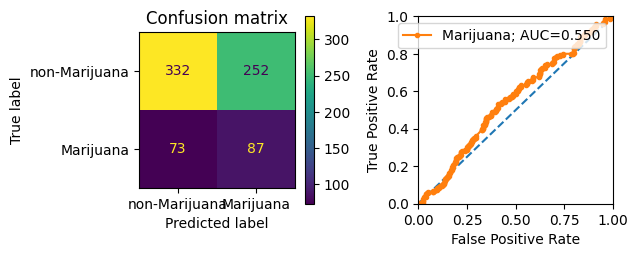

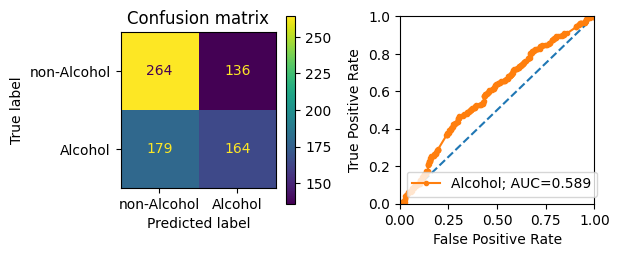

In [75]:
# results dict: map label to svm results
books_svm_results = dict()
for i, (socio, labels) in enumerate(socio_groups.items()):
    print('\n%s\n%s/%s: books SVM for socio %s: %s' % (
        datetime.datetime.now(), i+1, len(socio_groups), socio, labels))
    for l, label in enumerate(labels):    
        print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), l, len(labels), label))
        X_train, X_test, y_train, y_test = X_y_data_books[label]['train_test_split']
        clf = svm.SVC(probability=True, class_weight='balanced', random_state=RANDOM)
        clf.fit(X_train, y_train)
        auc = get_auc_and_plot(clf, X_test, y_test)
        books_svm_results[label] = auc

In [76]:
# show a table with the AUROC scores
pd.DataFrame({
    'AUROC': books_svm_results.values(),
}, index=list(books_svm_results.keys())).round(3)

,AUROC
Male,0.656
Female,0.634
18 - 34 yrs,0.660
35 - 54 yrs,0.627
55+ yrs,0.619
White,0.663
Asian,0.624
Black,0.579
Diabetes,0.527
Cigarettes,0.575


1. Footwear 

With books

In [77]:
footwear_cats = list(footwear_table[RENAMED_CATEGORY].unique())
print('%s footwear categories' % len(footwear_cats))
footwear_table.head()

18 footwear categories


,purchasers,Category,Title,FIXED ASIN/ISBN,MEN,WOMEN,GENDERED CATEGORY,RENAMED CATEGORY
ASIN/ISBN (Product Code),,,,,,,,
B004QF0TFQ,42,SOCKS,Dickies Men's Dri-tech Moisture Control Crew S...,B004QF0TFQ,True,False,MEN:SOCKS,MEN:SOCKS
B008M5S09S,24,SOCKS,Dickies Men's Dri-tech Moisture Control Crew S...,B008M5S09S,True,False,MEN:SOCKS,MEN:SOCKS
B075P7R3VN,21,SOCKS,Jeasona Women's Cat Socks Cute Animal Socks Su...,B075P7R3VN,False,True,WOMEN:SOCKS,WOMEN:SOCKS
B01MXIE9RT,21,SOCKS,Fruit of the Loom Mens Essential 6 Pack Casual...,B01MXIE9RT,True,False,MEN:SOCKS,MEN:SOCKS
B00MDZWPEO,20,SOCKS,"Hanes Men's Double Tough Crew Socks, 12-pair Pack",B00MDZWPEO,True,False,MEN:SOCKS,MEN:SOCKS


In [78]:
books_footwear_cats = list(books_cats) + list(footwear_cats)
print('%s books + footwear categories' % len(books_footwear_cats))

208 books + footwear categories


In [79]:
print('Getting feature vectors from books + footwear data')
print(datetime.datetime.now())
X_books_footwear = get_X_one_hot_encoding_for_categories(
    p50u_amzn_data[
        (p50u_amzn_data[PRODUCT_CODE].isin(books_table.index)) |\
        (p50u_amzn_data[CATEGORY].isin(footwear_cats))
    ], books_footwear_cats)
print(datetime.datetime.now())
X_y_data_books_footwear = setup_labeled_X_y_data(X_books_footwear, labeled_y)

Getting feature vectors from books + footwear data
2024-11-16 23:44:05.371323
2024-11-16 23:44:06.350103



2024-11-16 23:44:06.409627
1/4: Books + Footwear SVM for socio Gender: ['Male', 'Female']

2024-11-16 23:44:06.409756
1/2: SVM for Male
Mean accuracy: 0.6865
ROC AUC=0.766

2024-11-16 23:44:11.767459
2/2: SVM for Female
Mean accuracy: 0.7096
ROC AUC=0.779

2024-11-16 23:44:17.116388
2/4: Books + Footwear SVM for socio Age: ['18 - 34 yrs', '35 - 54 yrs', '55+ yrs']

2024-11-16 23:44:17.116448
1/3: SVM for 18 - 34 yrs
Mean accuracy: 0.6403
ROC AUC=0.676

2024-11-16 23:44:23.788537
2/3: SVM for 35 - 54 yrs
Mean accuracy: 0.6403
ROC AUC=0.666

2024-11-16 23:44:30.422646
3/3: SVM for 55+ yrs
Mean accuracy: 0.7400
ROC AUC=0.587

2024-11-16 23:44:36.029550
3/4: Books + Footwear SVM for socio Race: ['White', 'Asian', 'Black']

2024-11-16 23:44:36.029583
1/3: SVM for White
Mean accuracy: 0.6416
ROC AUC=0.652

2024-11-16 23:44:41.901129
2/3: SVM for Asian
Mean accuracy: 0.7217
ROC AUC=0.720

2024-11-16 23:44:47.239003
3/3: SVM for Black
Mean accuracy: 0.6950
ROC AUC=0.612

2024-11-16 23:44:52.5

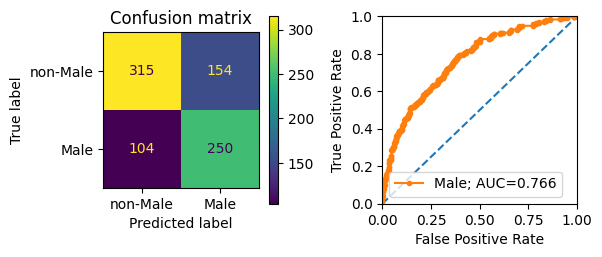

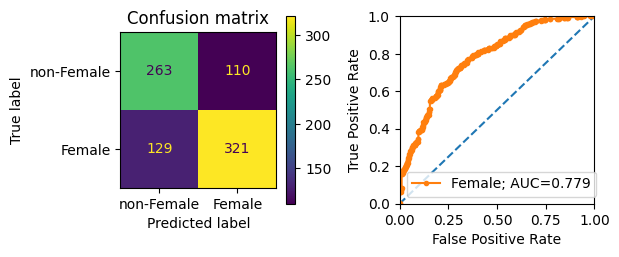

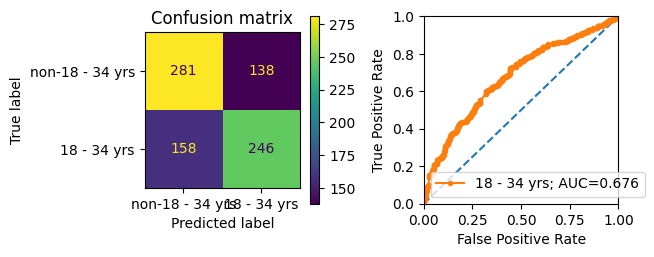

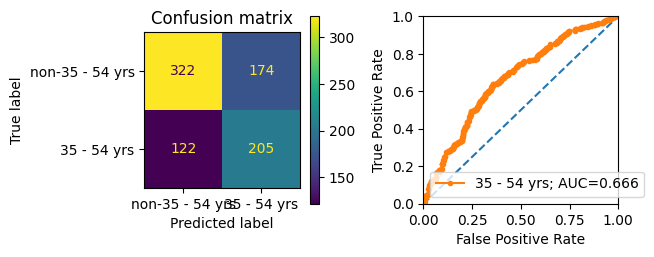

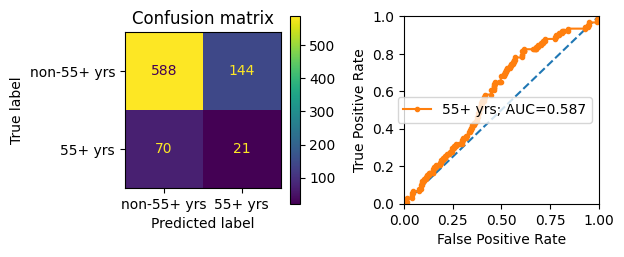

...

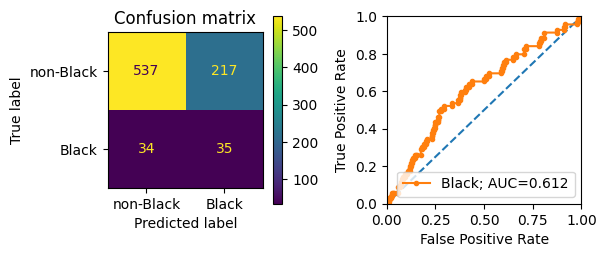

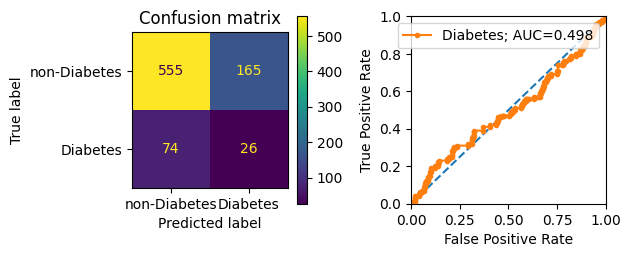

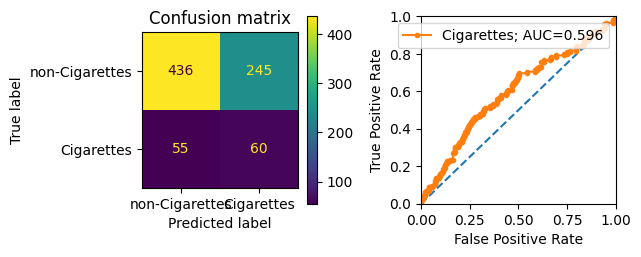

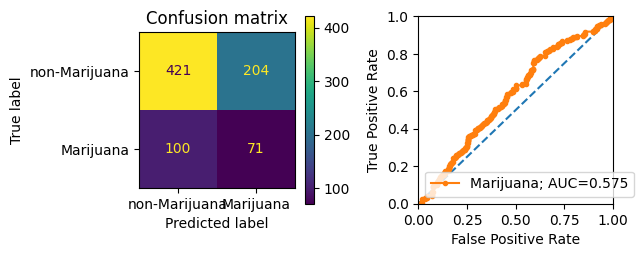

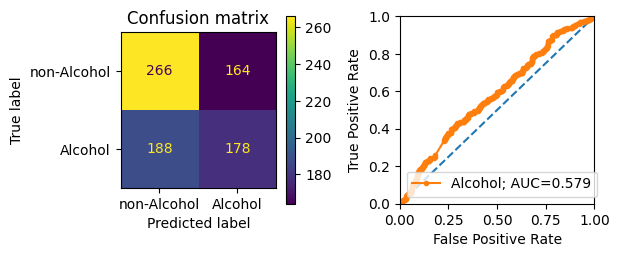

In [80]:
# results dict: map label to svm results
books_footwear_svm_results = dict()
for i, (socio, labels) in enumerate(socio_groups.items()):
    print('\n%s\n%s/%s: Books + Footwear SVM for socio %s: %s' % (
        datetime.datetime.now(), i+1, len(socio_groups), socio, labels))
    for l, label in enumerate(labels):    
        print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), l+1, len(labels), label))
        X_train, X_test, y_train, y_test = X_y_data_books_footwear[label]['train_test_split']
        clf = svm.SVC(probability=True, class_weight='balanced', random_state=RANDOM)
        clf.fit(X_train, y_train)
        auc = get_auc_and_plot(clf, X_test, y_test)
        books_footwear_svm_results[label] = auc

3. Whole Foods products

With books and footwear

In [81]:
wholefoods_cats = set(wholefoods_table[RENAMED_CATEGORY].unique()).intersection(cats_u50)
wholefoods_table.head()

,purchasers,Category,Title,FIXED ASIN/ISBN,MEN,WOMEN,GENDERED CATEGORY,RENAMED CATEGORY
ASIN/ISBN (Product Code),,,,,,,,
B074H4WRNG,80,VEGETABLE,"365 by Whole Foods Market, Organic Baby Spinac...",B074H4WRNG,False,False,VEGETABLE,VEGETABLE
B077L5RXJY,61,VEGETABLE,"365 by Whole Foods Market, Broccoli Florets, 1...",B077L5RXJY,False,False,VEGETABLE,VEGETABLE
B074H5B5H7,48,VEGETABLE,"365 by Whole Foods Market, Broccoli Florets, 1...",B074H5B5H7,False,False,VEGETABLE,VEGETABLE
B074H5HJ32,47,EGG,"365 by Whole Foods Market, Cage-Free Large Bro...",B074H5HJ32,False,False,EGG,EGG
B074J9RL65,40,EDIBLE_OIL_VEGETABLE,"365 by Whole Foods Market, Oil Olive Extra Vir...",B074J9RL65,False,False,EDIBLE_OIL_VEGETABLE,EDIBLE_OIL_VEGETABLE


In [82]:
print('%s Whole Foods categories' % len(wholefoods_cats))
books_footwear_wf_cats = list(books_cats) + list(footwear_cats) + list(wholefoods_cats)
print('%s books + footwear + Whole Foods categories' % len(books_footwear_wf_cats))

119 Whole Foods categories
327 books + footwear + Whole Foods categories


In [83]:
print('Getting feature vectors from books + footwear + WF data')
print(datetime.datetime.now())
X_books_footwear_wf = get_X_one_hot_encoding_for_categories(
    p50u_amzn_data[
        (p50u_amzn_data[PRODUCT_CODE].isin(books_table.index)) |\
        (p50u_amzn_data[CATEGORY].isin(footwear_cats)) |\
        (p50u_amzn_data[CATEGORY].isin(wholefoods_cats))
    ], books_footwear_wf_cats)
print(datetime.datetime.now())
X_y_data_books_footwear_wf = setup_labeled_X_y_data(X_books_footwear_wf, labeled_y)

Getting feature vectors from books + footwear + WF data
2024-11-16 23:45:18.528860
2024-11-16 23:45:24.039858



2024-11-16 23:45:24.112658
1/4: Books + Footwear SVM for socio Gender: ['Male', 'Female']

2024-11-16 23:45:24.112730
1/2: SVM for Male
Mean accuracy: 0.7282
ROC AUC=0.798

2024-11-16 23:45:32.528912
2/2: SVM for Female
Mean accuracy: 0.7247
ROC AUC=0.817

2024-11-16 23:45:40.896373
2/4: Books + Footwear SVM for socio Age: ['18 - 34 yrs', '35 - 54 yrs', '55+ yrs']

2024-11-16 23:45:40.896432
1/3: SVM for 18 - 34 yrs
Mean accuracy: 0.6494
ROC AUC=0.703

2024-11-16 23:45:50.553545
2/3: SVM for 35 - 54 yrs
Mean accuracy: 0.6212
ROC AUC=0.656

2024-11-16 23:46:00.658586
3/3: SVM for 55+ yrs
Mean accuracy: 0.8282
ROC AUC=0.688

2024-11-16 23:46:08.760312
3/4: Books + Footwear SVM for socio Race: ['White', 'Asian', 'Black']

2024-11-16 23:46:08.760366
1/3: SVM for White
Mean accuracy: 0.7212
ROC AUC=0.712

2024-11-16 23:46:17.386919
2/3: SVM for Asian
Mean accuracy: 0.8353
ROC AUC=0.689

2024-11-16 23:46:24.860224
3/3: SVM for Black
Mean accuracy: 0.8659
ROC AUC=0.702

2024-11-16 23:46:32.4

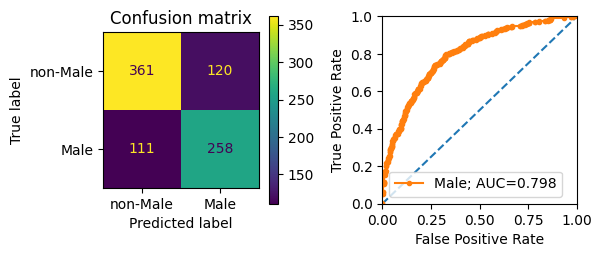

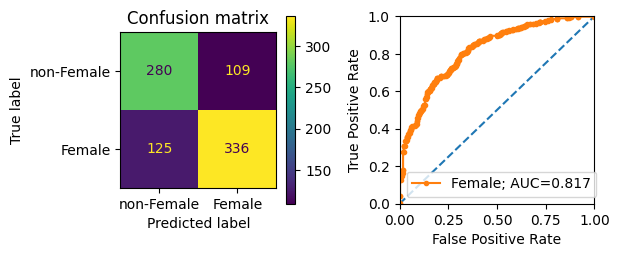

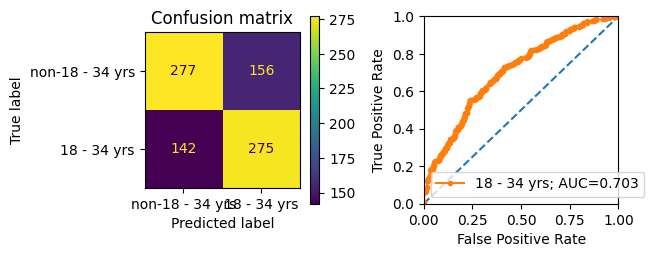

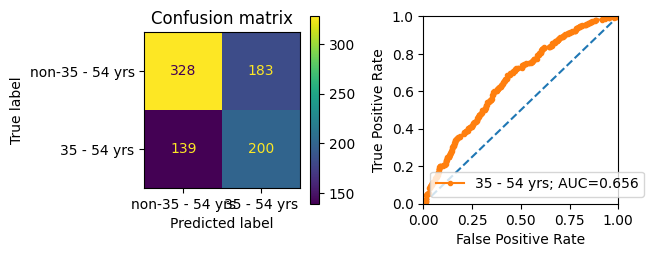

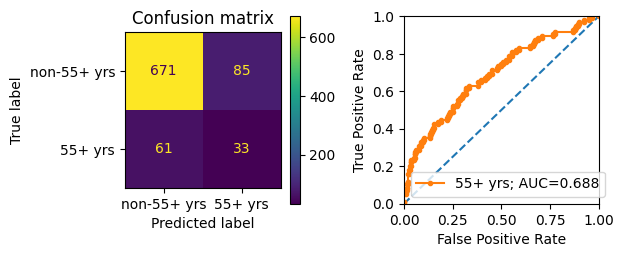

...

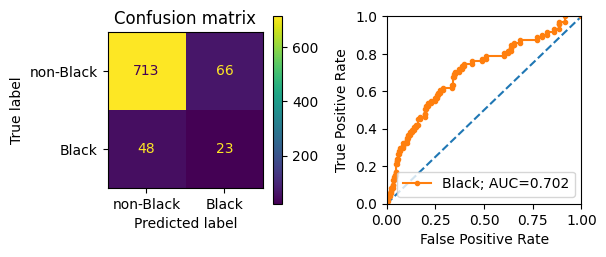

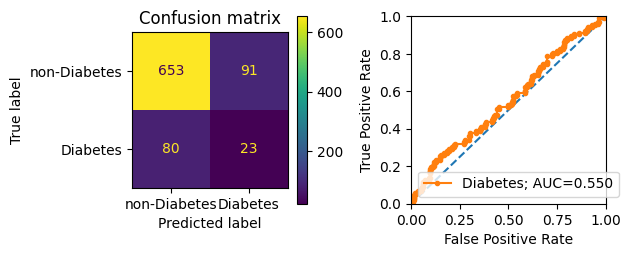

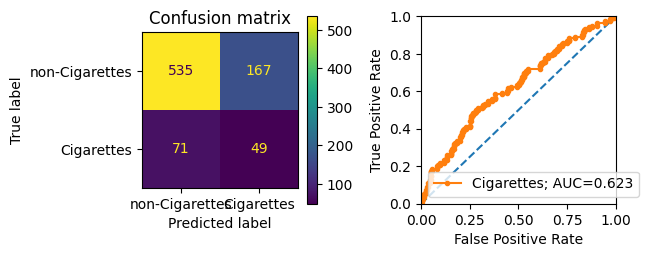

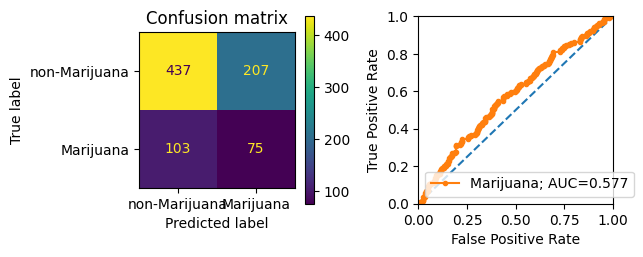

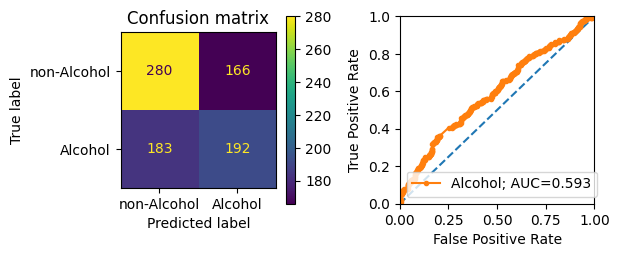

In [84]:
# results dict: map label to svm results
books_footwear_wf_svm_results = dict()
for i, (socio, labels) in enumerate(socio_groups.items()):
    print('\n%s\n%s/%s: Books + Footwear SVM for socio %s: %s' % (
        datetime.datetime.now(), i+1, len(socio_groups), socio, labels))
    for l, label in enumerate(labels):    
        print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), l+1, len(labels), label))
        X_train, X_test, y_train, y_test = X_y_data_books_footwear_wf[label]['train_test_split']
        clf = svm.SVC(probability=True, class_weight='balanced', random_state=RANDOM)
        clf.fit(X_train, y_train)
        auc = get_auc_and_plot(clf, X_test, y_test)
        books_footwear_wf_svm_results[label] = auc

In [85]:
# how many total categories for each set of models?
print('Categories for models')
print('%s categories for books models' % X_books.shape[1])
print('%s categories for books + footwear models' % X_books_footwear.shape[1])
print('%s categories for books + footwear + whole foods models' % 
      X_books_footwear_wf.shape[1])
print('%s categories for all products models' % X.shape[1])
# show a table with the AUROC scores
print('\nAUROC')
acquisition_cats_results_df = pd.DataFrame({
    'Books': books_svm_results.values(),
    'With Footwear': books_footwear_svm_results.values(),
    'With Whole Foods': books_footwear_wf_svm_results.values(),
    'All Products': [onehot_svm_results[k] for k in books_svm_results.keys()],
}, index=list(books_svm_results.keys()))
acquisition_cats_results_df.loc['Total categories'] = [
    X_books.shape[1], X_books_footwear.shape[1], X_books_footwear_wf.shape[1], X.shape[1]
]
acquisition_cats_results_df.round(3)

Categories for models
190 categories for books models
207 categories for books + footwear models
316 categories for books + footwear + whole foods models
1619 categories for all products models

AUROC


,Books,With Footwear,With Whole Foods,All Products
Male,0.656,0.766,0.798,0.893
Female,0.634,0.779,0.817,0.912
18 - 34 yrs,0.660,0.676,0.703,0.808
35 - 54 yrs,0.627,0.666,0.656,0.712
55+ yrs,0.619,0.587,0.688,0.868
White,0.663,0.652,0.712,0.791
Asian,0.624,0.720,0.689,0.764
Black,0.579,0.612,0.702,0.806
Diabetes,0.527,0.498,0.550,0.612
Cigarettes,0.575,0.596,0.623,0.728


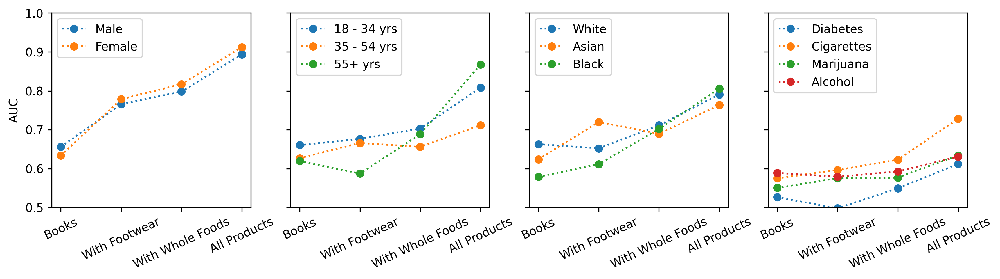

In [86]:
xticks = list(range(4))
xlabels = ['Books', 'With\nFootwear','With\nWhole Foods', 'All\nProducts']
xlabels = ['Books', 'With Footwear','With Whole Foods', 'All Products']

cols = len(socio_groups)
fig, axes = plt.subplots(1,cols, figsize=(3.5*cols,3), sharey=True, sharex=True, dpi=300)
plt.subplots_adjust(wspace=0.2)
for i, (socio, labels) in enumerate(socio_groups.items()):
    ax = axes[i]
    if i == 0:
        ax.set_ylabel('AUC')
        ax.set_ylim(0.5, 1)
    for label in labels:
        ax.plot(xticks, acquisition_cats_results_df.loc[label], label=label, 
                linestyle=':', marker="o", markersize=6, markerfacecolor=None)
    ax.set_xticks(xticks, labels=xlabels)
    _ = ax.tick_params(axis='x', labelrotation=25)
    #ax.set_xlabel('Increase in product categories')
    _ = ax.legend(loc='upper left')

Smaller plots

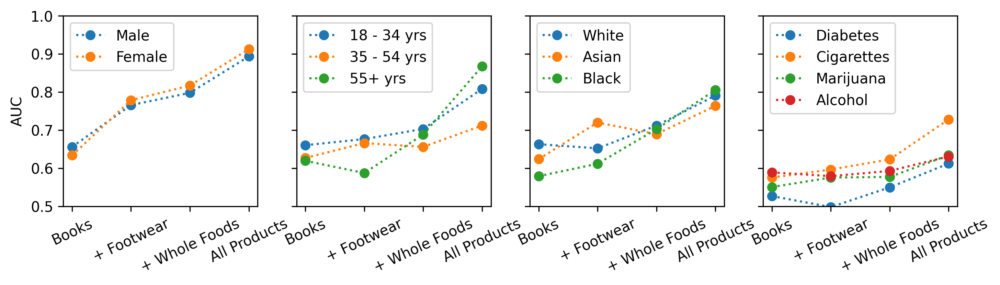

In [87]:
xticks = list(range(4))
xlabels = ['Books', '+ Footwear','+ Whole Foods', 'All Products']
cols = len(socio_groups)
fig, axes = plt.subplots(1,cols, figsize=(2.8*cols,2.4), sharey=True, sharex=True, dpi=300)
plt.subplots_adjust(wspace=0.2)
for i, (socio, labels) in enumerate(socio_groups.items()):
    ax = axes[i]
    if i == 0:
        ax.set_ylabel('AUC')
        ax.set_ylim(0.5, 1)
    for label in labels:
        ax.plot(xticks, acquisition_cats_results_df.loc[label], label=label, 
                linestyle=':', marker="o", markersize=6, markerfacecolor=None)
    ax.set_xticks(xticks, labels=xlabels)
    _ = ax.tick_params(axis='x', labelrotation=25)
    _ = ax.legend(loc='upper left')



##### Random fraction of categories


For p in [%, ... ]:
- Randomly sample p categories from the categories list.
- Limit the train and test feature vectors to these categories
- Train and test model
- With repeated sampling to create means and confidence intervals (except for 100%)


In [88]:
"""
Make a dict
{p: {label: [auc results]} for p in [, ...100%]}
"""

ps = [p/100 for p in [1, 2, 3, 4, 5, 10, 15, 20, 30, 40, 50, 60, 70, 80, 90, 100]]
print(ps)

USE_CATS = cats_u50

def get_svm_results_varying_p_categories(X_y_data, use_labels, repeated_samples=10, verbose=True):
    print('getting SVM results for varying categories with %s repeated samples for labels: %s\np: %s' % (
            repeated_samples, use_labels, ps))
    p_svm_results = {p: {label: [] for label in use_labels} for p in ps}
    for l, label in enumerate(use_labels):
        print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), l+1, len(use_labels), label))
        X_train, X_test, y_train, y_test = X_y_data[label]['train_test_split']
        for p in ps:
            for i in range(repeated_samples):
                random.seed(RANDOM+i)
                p_i_cats = random.sample(USE_CATS, k=int(p*len(USE_CATS)))
                p_i_X_train = X_train[p_i_cats]
                p_i_X_test = X_test[p_i_cats]
                if (i==0): print('%s: train with p=%0.2f --> %s categories' % (datetime.datetime.now(), p, len(p_i_cats)))
                clf = svm.SVC(probability=True, class_weight='balanced')
                clf.fit(p_i_X_train, y_train)
                auc = get_auc_and_plot(clf, p_i_X_test, y_test, plot=False)
                p_svm_results[p][label] += [auc]
                if p==1: 
                    if verbose: print('n==100')
                    break
    return p_svm_results

[0.01, 0.02, 0.03, 0.04, 0.05, 0.1, 0.15, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]


In [89]:
socio_recompute = {
    'Gender': False, #True,
    'Age': False,
    'Race': False, #True,
    'Health / lifestyle': False, #True,
}

def get_fpath(socio):
    return './preprocessed/varying_p_cats_AUC_%s.csv' % socio[:4]

# get dictionary of dataframes. Can merge into one dataframe
p_cats_svm_results_dfs = dict() # {socio: dataframe}

r = 10

for i, (socio, recompute) in enumerate(socio_recompute.items()):
    fpath = get_fpath(socio)
    print('%s/%s: %s: %s' % (i, len(socio_recompute), socio, fpath))
    if recompute:
        labels = socio_groups[socio]
        print(labels)
        p_cats_svm_results = get_svm_results_varying_p_categories(X_y_data, labels, repeated_samples=r)
        p_cats_svm_results_df = pd.DataFrame({
            'p':ps,
        }).set_index('p')
        for label in labels:
            means = []
            CIs = []
            for p in ps:
                data = p_cats_svm_results[p][label]
                means += [np.mean(data).round(3)]
                if len(data) > 1:
                    (CI_l, CI_u) = st.t.interval(0.95, len(data)-1, loc=np.mean(data), scale=st.sem(data))
                    CIs += [(CI_l.round(3), CI_u.round(3))]
                else:
                    CIs += [np.nan]
            p_cats_svm_results_df[label] = means
            p_cats_svm_results_df[get_CI_colname(label)] = CIs
        # Save the data
        print('saving table to %s...' % fpath)
        p_cats_svm_results_df.to_csv(fpath)
        print('...saved')
    p_cats_svm_results_dfs[socio] = pd.read_csv(fpath, index_col=0)


0/4: Gender: ./preprocessed/varying_p_cats_AUC_Gend.csv
1/4: Age: ./preprocessed/varying_p_cats_AUC_Age.csv
2/4: Race: ./preprocessed/varying_p_cats_AUC_Race.csv
3/4: Health / lifestyle: ./preprocessed/varying_p_cats_AUC_Heal.csv


In [90]:
# Print each table separately since together this is too wide
for (socio, results_df) in p_cats_svm_results_dfs.items():
    print(socio)
    display(results_df)

Gender


,Male,Male 95 CI,Female,Female 95 CI
p,,,,
0.01,0.610,"(0.59, 0.631)",0.620,"(0.588, 0.652)"
0.02,0.670,"(0.643, 0.698)",0.684,"(0.656, 0.713)"
0.03,0.709,"(0.688, 0.729)",0.731,"(0.709, 0.753)"
0.04,0.728,"(0.712, 0.743)",0.755,"(0.738, 0.773)"
0.05,0.741,"(0.726, 0.756)",0.768,"(0.755, 0.781)"
0.10,0.792,"(0.777, 0.807)",0.823,"(0.81, 0.836)"
0.15,0.819,"(0.809, 0.829)",0.848,"(0.841, 0.856)"
0.20,0.839,"(0.829, 0.849)",0.863,"(0.855, 0.871)"
0.30,0.860,"(0.856, 0.864)",0.880,"(0.874, 0.886)"


Age


,18 - 34 yrs,18 - 34 yrs 95 CI,35 - 54 yrs,35 - 54 yrs 95 CI,55+ yrs,55+ yrs 95 CI
p,,,,,,
0.01,0.557,"(0.538, 0.576)",0.541,"(0.523, 0.56)",0.564,"(0.545, 0.583)"
0.02,0.585,"(0.571, 0.6)",0.566,"(0.547, 0.585)",0.575,"(0.553, 0.597)"
0.03,0.605,"(0.591, 0.619)",0.583,"(0.559, 0.606)",0.600,"(0.579, 0.621)"
0.04,0.628,"(0.615, 0.641)",0.588,"(0.569, 0.607)",0.636,"(0.611, 0.661)"
0.05,0.641,"(0.633, 0.649)",0.598,"(0.581, 0.614)",0.655,"(0.623, 0.687)"
0.10,0.682,"(0.668, 0.696)",0.632,"(0.612, 0.652)",0.710,"(0.689, 0.731)"
0.15,0.706,"(0.696, 0.716)",0.651,"(0.634, 0.668)",0.741,"(0.724, 0.758)"
0.20,0.725,"(0.713, 0.736)",0.659,"(0.649, 0.669)",0.760,"(0.746, 0.773)"
0.30,0.747,"(0.739, 0.756)",0.674,"(0.665, 0.682)",0.794,"(0.78, 0.808)"


Race


,White,White 95 CI,Asian,Asian 95 CI,Black,Black 95 CI
p,,,,,,
0.01,0.564,"(0.539, 0.59)",0.539,"(0.515, 0.564)",0.562,"(0.539, 0.584)"
0.02,0.590,"(0.565, 0.614)",0.536,"(0.516, 0.556)",0.580,"(0.561, 0.599)"
0.03,0.613,"(0.597, 0.628)",0.566,"(0.541, 0.591)",0.605,"(0.588, 0.622)"
0.04,0.629,"(0.609, 0.649)",0.579,"(0.558, 0.599)",0.621,"(0.599, 0.642)"
0.05,0.640,"(0.62, 0.659)",0.595,"(0.573, 0.617)",0.628,"(0.607, 0.648)"
0.10,0.681,"(0.668, 0.694)",0.645,"(0.63, 0.66)",0.673,"(0.656, 0.691)"
0.15,0.706,"(0.697, 0.714)",0.673,"(0.657, 0.69)",0.707,"(0.694, 0.721)"
0.20,0.719,"(0.712, 0.725)",0.680,"(0.662, 0.699)",0.716,"(0.703, 0.73)"
0.30,0.736,"(0.729, 0.742)",0.710,"(0.694, 0.726)",0.741,"(0.729, 0.753)"


Health / lifestyle


,Diabetes,Diabetes 95 CI,Cigarettes,Cigarettes 95 CI,Marijuana,Marijuana 95 CI,Alcohol,Alcohol 95 CI
p,,,,,,,,
0.01,0.517,"(0.503, 0.531)",0.549,"(0.502, 0.597)",0.537,"(0.51, 0.564)",0.519,"(0.499, 0.54)"
0.02,0.510,"(0.495, 0.524)",0.600,"(0.566, 0.635)",0.547,"(0.526, 0.568)",0.528,"(0.503, 0.553)"
0.03,0.511,"(0.493, 0.529)",0.615,"(0.589, 0.641)",0.556,"(0.538, 0.575)",0.545,"(0.53, 0.561)"
0.04,0.520,"(0.498, 0.541)",0.621,"(0.598, 0.643)",0.560,"(0.541, 0.579)",0.557,"(0.541, 0.572)"
0.05,0.536,"(0.518, 0.554)",0.628,"(0.611, 0.646)",0.556,"(0.537, 0.575)",0.566,"(0.553, 0.578)"
0.10,0.543,"(0.534, 0.552)",0.651,"(0.638, 0.665)",0.577,"(0.556, 0.598)",0.583,"(0.573, 0.592)"
0.15,0.551,"(0.535, 0.567)",0.666,"(0.649, 0.683)",0.582,"(0.565, 0.6)",0.593,"(0.583, 0.603)"
0.20,0.549,"(0.531, 0.567)",0.679,"(0.664, 0.695)",0.597,"(0.575, 0.618)",0.595,"(0.581, 0.609)"
0.30,0.559,"(0.542, 0.576)",0.692,"(0.681, 0.702)",0.603,"(0.587, 0.618)",0.608,"(0.595, 0.621)"


In [91]:
# merge
from functools import reduce
pd.set_option('display.max_columns', None)
pct_cats_svm_results_df = reduce(lambda  left,right: pd.merge(left,right, left_index=True, right_index=True), p_cats_svm_results_dfs.values())
display(pct_cats_svm_results_df)

,Male,Male 95 CI,Female,Female 95 CI,18 - 34 yrs,18 - 34 yrs 95 CI,35 - 54 yrs,35 - 54 yrs 95 CI,55+ yrs,55+ yrs 95 CI,White,White 95 CI,Asian,Asian 95 CI,Black,Black 95 CI,Diabetes,Diabetes 95 CI,Cigarettes,Cigarettes 95 CI,Marijuana,Marijuana 95 CI,Alcohol,Alcohol 95 CI
p,,,,,,,,,,,,,,,,,,,,,,,,
0.01,0.610,"(0.59, 0.631)",0.620,"(0.588, 0.652)",0.557,"(0.538, 0.576)",0.541,"(0.523, 0.56)",0.564,"(0.545, 0.583)",0.564,"(0.539, 0.59)",0.539,"(0.515, 0.564)",0.562,"(0.539, 0.584)",0.517,"(0.503, 0.531)",0.549,"(0.502, 0.597)",0.537,"(0.51, 0.564)",0.519,"(0.499, 0.54)"
0.02,0.670,"(0.643, 0.698)",0.684,"(0.656, 0.713)",0.585,"(0.571, 0.6)",0.566,"(0.547, 0.585)",0.575,"(0.553, 0.597)",0.590,"(0.565, 0.614)",0.536,"(0.516, 0.556)",0.580,"(0.561, 0.599)",0.510,"(0.495, 0.524)",0.600,"(0.566, 0.635)",0.547,"(0.526, 0.568)",0.528,"(0.503, 0.553)"
0.03,0.709,"(0.688, 0.729)",0.731,"(0.709, 0.753)",0.605,"(0.591, 0.619)",0.583,"(0.559, 0.606)",0.600,"(0.579, 0.621)",0.613,"(0.597, 0.628)",0.566,"(0.541, 0.591)",0.605,"(0.588, 0.622)",0.511,"(0.493, 0.529)",0.615,"(0.589, 0.641)",0.556,"(0.538, 0.575)",0.545,"(0.53, 0.561)"
0.04,0.728,"(0.712, 0.743)",0.755,"(0.738, 0.773)",0.628,"(0.615, 0.641)",0.588,"(0.569, 0.607)",0.636,"(0.611, 0.661)",0.629,"(0.609, 0.649)",0.579,"(0.558, 0.599)",0.621,"(0.599, 0.642)",0.520,"(0.498, 0.541)",0.621,"(0.598, 0.643)",0.560,"(0.541, 0.579)",0.557,"(0.541, 0.572)"
0.05,0.741,"(0.726, 0.756)",0.768,"(0.755, 0.781)",0.641,"(0.633, 0.649)",0.598,"(0.581, 0.614)",0.655,"(0.623, 0.687)",0.640,"(0.62, 0.659)",0.595,"(0.573, 0.617)",0.628,"(0.607, 0.648)",0.536,"(0.518, 0.554)",0.628,"(0.611, 0.646)",0.556,"(0.537, 0.575)",0.566,"(0.553, 0.578)"
0.10,0.792,"(0.777, 0.807)",0.823,"(0.81, 0.836)",0.682,"(0.668, 0.696)",0.632,"(0.612, 0.652)",0.710,"(0.689, 0.731)",0.681,"(0.668, 0.694)",0.645,"(0.63, 0.66)",0.673,"(0.656, 0.691)",0.543,"(0.534, 0.552)",0.651,"(0.638, 0.665)",0.577,"(0.556, 0.598)",0.583,"(0.573, 0.592)"
0.15,0.819,"(0.809, 0.829)",0.848,"(0.841, 0.856)",0.706,"(0.696, 0.716)",0.651,"(0.634, 0.668)",0.741,"(0.724, 0.758)",0.706,"(0.697, 0.714)",0.673,"(0.657, 0.69)",0.707,"(0.694, 0.721)",0.551,"(0.535, 0.567)",0.666,"(0.649, 0.683)",0.582,"(0.565, 0.6)",0.593,"(0.583, 0.603)"
0.20,0.839,"(0.829, 0.849)",0.863,"(0.855, 0.871)",0.725,"(0.713, 0.736)",0.659,"(0.649, 0.669)",0.760,"(0.746, 0.773)",0.719,"(0.712, 0.725)",0.680,"(0.662, 0.699)",0.716,"(0.703, 0.73)",0.549,"(0.531, 0.567)",0.679,"(0.664, 0.695)",0.597,"(0.575, 0.618)",0.595,"(0.581, 0.609)"
0.30,0.860,"(0.856, 0.864)",0.880,"(0.874, 0.886)",0.747,"(0.739, 0.756)",0.674,"(0.665, 0.682)",0.794,"(0.78, 0.808)",0.736,"(0.729, 0.742)",0.710,"(0.694, 0.726)",0.741,"(0.729, 0.753)",0.559,"(0.542, 0.576)",0.692,"(0.681, 0.702)",0.603,"(0.587, 0.618)",0.608,"(0.595, 0.621)"


In [92]:
# plot with CIs
from ast import literal_eval


def plot_auc_results_by_socio(results_dfs, axes=None, CI=True, socio_groups=socio_groups, dpi=None):
    if axes is None:
        cols = len(socio_groups)
        fig, axes = plt.subplots(1,cols, figsize=(2.5*cols,2.45), sharey=True, sharex=True, dpi=dpi)
        plt.subplots_adjust(wspace=0.1)
    # first draw just the CIs
    if CI==True:
        for i, (socio, labels) in enumerate(socio_groups.items()):
            rdf = results_dfs[socio]
            ax = axes[i]
            for label in labels:
                cis = [(np.nan if ci is np.nan else literal_eval(ci)) for ci in rdf[get_CI_colname(label)].values]
                lower_cis = [(np.nan if ci is np.nan else ci[0]) for ci in cis]
                upper_cis = [(np.nan if ci is np.nan else ci[1]) for ci in cis]
                ax.fill_between(rdf.index, lower_cis, upper_cis, alpha=0.2)
    # then draw the means
    for i, (socio, labels) in enumerate(socio_groups.items()):
        ax = axes[i]
        rdf = results_dfs[socio]
        if i == 0:
            ax.set_ylabel('AUC')
            ax.set_ylim(0.5, 1)
        for label in labels:
            ax.plot(rdf[label], label=label)
    return axes

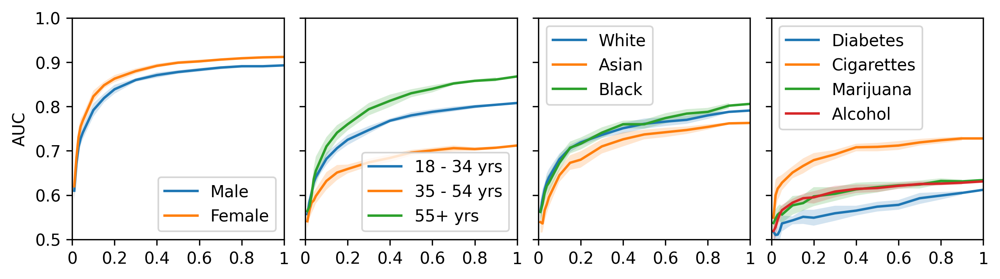

In [93]:
axes = plot_auc_results_by_socio(p_cats_svm_results_dfs, dpi=300)
for i, ax in enumerate(axes):
    ax.set_xlim(0, 1)
    ax.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])
    ax.set_xticklabels([0, 0.2, 0.4, 0.6, 0.8, 1])
    #ax.set_xlabel('Fraction of categories')
    if i<2: ax.legend(loc='lower right')
    else: 
        ax.legend(loc='upper left')

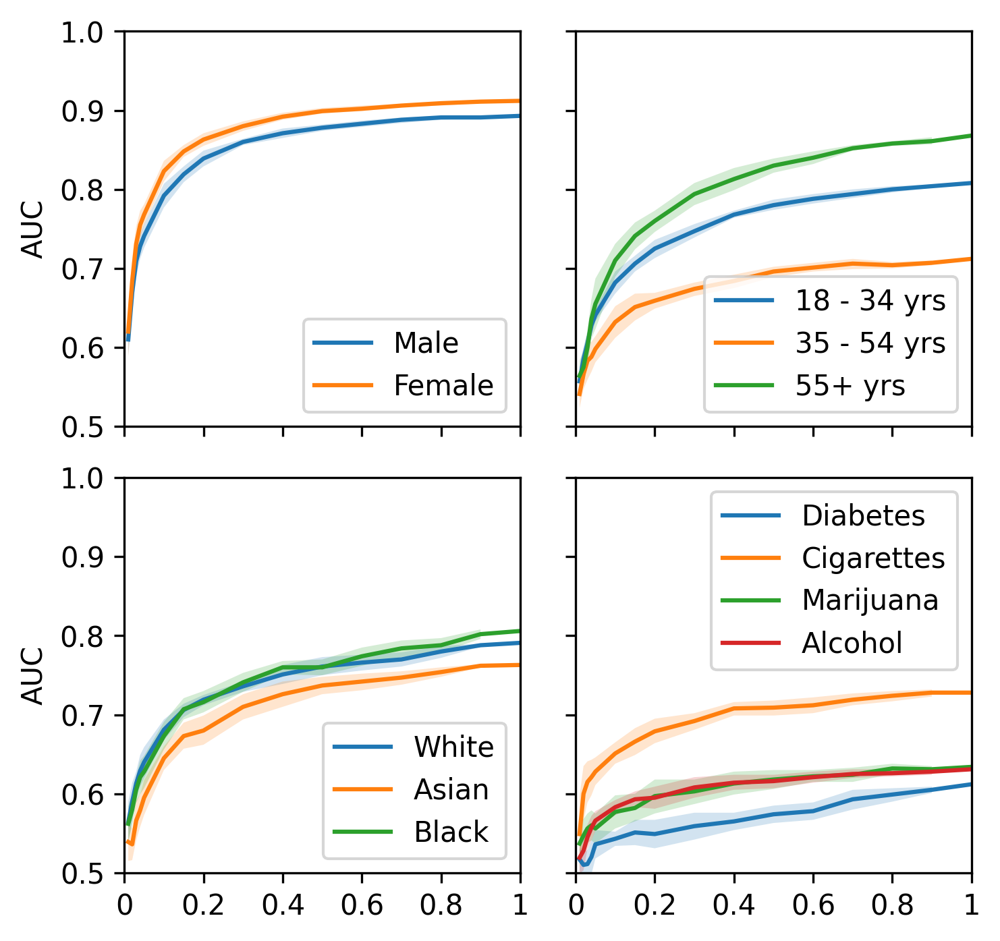

In [94]:
fig, axes = plt.subplots(2, 2, figsize=(2.7*2, 2.7*2), sharey=True, sharex=True, dpi=300)
axes = axes.flatten()
axes = plot_auc_results_by_socio(p_cats_svm_results_dfs, axes=axes)
fig.subplots_adjust(hspace=0.13, wspace=0.14)
axes[2].set_ylabel('AUC')
for i, ax in enumerate(axes):
    ax.set_xlim(0, 1)
    ax.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])
    ax.set_xticklabels([0, 0.2, 0.4, 0.6, 0.8, 1])
    if i==3: ax.legend()
    else: ax.legend(loc='lower right')

### Subsampling purchases to assess: How do more purchases impact the models' predictive power?

Consider that large companies and data brokers have even greater access to information about which products consumers purchased than what is represented in this dataset (e.g. via credit card transactions or web tracking).

In this analysis we keep the train/test split the same as above analyses.


##### Subsample purchases: Absolute purchases: Subsample only the test sample.

We use the sample training sample as above, and train on the full training sample.
We modify the data for users in the *test* sample.

All of the users in our dataset have at least P=50 distinct purchases, so we sample up to P.

For p in [1,2,3,4,5,10,15,20,30,40,50]:
- Randomly sample p purchases from each user and create their feature vectors from these purchases
- Test model
- with repeated random sampling to create means and CIs


In [95]:
"""
Make a dict
{p: {label: [auc]} for p in [1,2,3,4,5, 10, ...50]}

Use the already trained models.
"""
ps = [1,2,3,4,5,10,15,20,30,40,50]

def get_svm_results_varying_test_abs_p(X_y_data, use_labels, repeated_samples=10, verbose=True):
    print('getting SVM results with %s repeated samples for varying test p: %s for labels: %s' % (
            repeated_samples, ps, use_labels))
    p_svm_results = {p: {label: [] for label in use_labels} for p in ps}
    for l, label in enumerate(use_labels):
        print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), l+1, len(use_labels), label))
        _X_train, X_test, _y_train, y_test = X_y_data[label]['train_test_split']
        clf = onehot_svm_models[label] # already trained
        test_rids = X_test.index.tolist()
        for p in ps:
            if verbose and (p%10 in [1,3,5,10]): print('%s: p=%s' % (datetime.datetime.now(), p))
            for i in range(repeated_samples):
                # Get p X_test: feature vectors from p purchases for each test user
                test_amzn_df = p50u_amzn_data[p50u_amzn_data[RESPONSE_ID].isin(test_rids)]
                p_test_df = test_amzn_df.groupby(RESPONSE_ID).sample(n=p, replace=False, random_state=RANDOM+i)
                p_X_test = get_X_one_hot_encoding_for_categories(p_test_df, cats_u50).loc[test_rids]
                auc = get_auc_and_plot(clf, p_X_test, y_test, plot=False)
                p_svm_results[p][label] += [auc]
    return p_svm_results

In [96]:
socio_recompute = {
    'Gender': False,#True,
    'Age': False,
    'Race': False,#True,
    'Health / lifestyle': False,#True,
}

def get_fpath(socio):
    return './preprocessed/varying_test_abs_p_AUC_%s.csv' % socio[:4]

# get dictionary of dataframes. Can merge into one dataframe
p_svm_results_dfs = dict() # {socio: dataframe}

r = 10 # repeated samples

for i, (socio, recompute) in enumerate(socio_recompute.items()):
    fpath = get_fpath(socio)
    print('%s/%s: %s: %s' % (i, len(socio_recompute), socio, fpath))
    if recompute:
        labels = socio_groups[socio]
        print(labels)
        p_svm_results = get_svm_results_varying_test_abs_p(X_y_data, labels, repeated_samples=r)
        p_svm_results_df = pd.DataFrame({
            'p':ps,
        }).set_index('p')
        for label in labels:
            means = []
            CIs = []
            for p in ps:
                data = p_svm_results[p][label]
                means += [np.mean(data).round(3)]
                (CI_l, CI_u) = st.t.interval(0.95, len(data)-1, loc=np.mean(data), scale=st.sem(data))
                CIs += [(CI_l.round(3), CI_u.round(3))]
            p_svm_results_df[label] = means
            p_svm_results_df[get_CI_colname(label)] = CIs
        # Save the data
        print('saving table to %s...' % fpath)
        p_svm_results_df.to_csv(fpath)
        print('...saved')
    p_svm_results_dfs[socio] = pd.read_csv(fpath, index_col=0)

0/4: Gender: ./preprocessed/varying_test_abs_p_AUC_Gend.csv
1/4: Age: ./preprocessed/varying_test_abs_p_AUC_Age.csv
2/4: Race: ./preprocessed/varying_test_abs_p_AUC_Race.csv
3/4: Health / lifestyle: ./preprocessed/varying_test_abs_p_AUC_Heal.csv


In [97]:
for socio, results_df in p_svm_results_dfs.items():
    print(socio)
    display(results_df)

Gender


,Male,Male 95 CI,Female,Female 95 CI
p,,,,
1,0.601,"(0.58, 0.622)",0.599,"(0.586, 0.612)"
2,0.639,"(0.624, 0.654)",0.640,"(0.628, 0.652)"
3,0.663,"(0.651, 0.675)",0.672,"(0.658, 0.686)"
4,0.683,"(0.674, 0.692)",0.692,"(0.68, 0.705)"
5,0.696,"(0.686, 0.707)",0.706,"(0.696, 0.716)"
10,0.757,"(0.75, 0.763)",0.759,"(0.752, 0.765)"
15,0.785,"(0.78, 0.789)",0.792,"(0.786, 0.797)"
20,0.804,"(0.8, 0.808)",0.816,"(0.811, 0.822)"
30,0.828,"(0.825, 0.83)",0.840,"(0.836, 0.843)"


Age


,18 - 34 yrs,18 - 34 yrs 95 CI,35 - 54 yrs,35 - 54 yrs 95 CI,55+ yrs,55+ yrs 95 CI
p,,,,,,
1,0.559,"(0.543, 0.574)",0.528,"(0.514, 0.543)",0.554,"(0.536, 0.573)"
2,0.581,"(0.567, 0.596)",0.545,"(0.534, 0.557)",0.572,"(0.553, 0.592)"
3,0.601,"(0.592, 0.611)",0.557,"(0.543, 0.571)",0.589,"(0.573, 0.604)"
4,0.614,"(0.607, 0.62)",0.566,"(0.556, 0.577)",0.603,"(0.585, 0.621)"
5,0.628,"(0.618, 0.638)",0.575,"(0.561, 0.588)",0.611,"(0.593, 0.63)"
10,0.660,"(0.646, 0.674)",0.599,"(0.587, 0.61)",0.666,"(0.651, 0.681)"
15,0.683,"(0.671, 0.694)",0.616,"(0.603, 0.629)",0.702,"(0.686, 0.718)"
20,0.695,"(0.688, 0.703)",0.625,"(0.609, 0.642)",0.722,"(0.713, 0.732)"
30,0.717,"(0.709, 0.725)",0.639,"(0.625, 0.654)",0.754,"(0.746, 0.762)"


Race


,White,White 95 CI,Asian,Asian 95 CI,Black,Black 95 CI
p,,,,,,
1,0.548,"(0.527, 0.57)",0.549,"(0.523, 0.575)",0.542,"(0.513, 0.571)"
2,0.553,"(0.539, 0.567)",0.557,"(0.534, 0.58)",0.550,"(0.521, 0.58)"
3,0.564,"(0.546, 0.582)",0.566,"(0.542, 0.591)",0.574,"(0.545, 0.603)"
4,0.573,"(0.56, 0.587)",0.581,"(0.556, 0.606)",0.579,"(0.553, 0.605)"
5,0.579,"(0.564, 0.595)",0.587,"(0.567, 0.607)",0.595,"(0.571, 0.618)"
10,0.618,"(0.597, 0.638)",0.609,"(0.588, 0.631)",0.638,"(0.609, 0.667)"
15,0.648,"(0.636, 0.66)",0.632,"(0.617, 0.648)",0.663,"(0.64, 0.686)"
20,0.663,"(0.652, 0.675)",0.645,"(0.623, 0.667)",0.684,"(0.665, 0.703)"
30,0.683,"(0.674, 0.691)",0.666,"(0.642, 0.69)",0.701,"(0.681, 0.72)"


Health / lifestyle


,Diabetes,Diabetes 95 CI,Cigarettes,Cigarettes 95 CI,Marijuana,Marijuana 95 CI,Alcohol,Alcohol 95 CI
p,,,,,,,,
1,0.524,"(0.501, 0.546)",0.522,"(0.504, 0.54)",0.503,"(0.477, 0.528)",0.517,"(0.503, 0.53)"
2,0.531,"(0.514, 0.548)",0.524,"(0.508, 0.54)",0.515,"(0.49, 0.54)",0.526,"(0.513, 0.538)"
3,0.541,"(0.524, 0.558)",0.528,"(0.512, 0.543)",0.520,"(0.502, 0.538)",0.535,"(0.524, 0.546)"
4,0.543,"(0.526, 0.56)",0.527,"(0.513, 0.54)",0.529,"(0.51, 0.549)",0.538,"(0.529, 0.547)"
5,0.543,"(0.526, 0.56)",0.540,"(0.525, 0.554)",0.530,"(0.512, 0.548)",0.541,"(0.529, 0.554)"
10,0.562,"(0.541, 0.583)",0.548,"(0.529, 0.566)",0.544,"(0.526, 0.561)",0.553,"(0.545, 0.56)"
15,0.559,"(0.542, 0.577)",0.570,"(0.554, 0.585)",0.557,"(0.54, 0.574)",0.561,"(0.552, 0.57)"
20,0.560,"(0.537, 0.582)",0.582,"(0.568, 0.596)",0.567,"(0.552, 0.582)",0.573,"(0.564, 0.583)"
30,0.571,"(0.551, 0.59)",0.596,"(0.582, 0.61)",0.577,"(0.565, 0.589)",0.584,"(0.575, 0.593)"


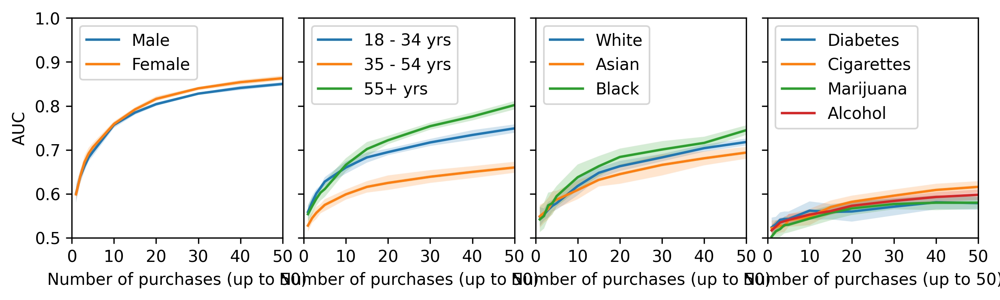

In [98]:
axes = plot_auc_results_by_socio(p_svm_results_dfs, dpi=300)
for ax in axes:
    ax.set_xlim(1, 50)
    ax.set_xticks([0,10,20,30,40,50])
    ax.set_xticklabels([0,10,20,30,40,50])
    ax.set_xlabel('Number of purchases (up to 50)')
    ax.legend(loc='upper left')

#### Subsample purchases: (%) Subsample only the test sample.

We use the sample training sample as above, and train on the full training sample.
We modify the data for users in the *test* sample

For p in [2%, 3%, 4%, 5%, 10%, 20%, …, 100%]:
- Randomly sample p purchases from each user and create their feature vectors from these purchases
- Test model


In [99]:
"""
Make a dict
{p: {label: [auc results]} for p in [, ...100%]}
use already trained models
"""
# start with 2 because otherwise sampling loses users with only 50 purchases
ps = [p/100 for p in [2, 3, 4, 5, 10, 15, 20, 30, 40, 50, 60, 70, 80, 90, 100]]
print(ps)

def get_svm_results_varying_test_pct_p(X_y_data, use_labels, repeated_samples=10, verbose=True):
    print('getting SVM results with %s repeated samples for varying test p%%: %s for labels: %s' % (
            repeated_samples, ps, use_labels))
    p_svm_results = {p: {label: [] for label in use_labels} for p in ps}
    for l, label in enumerate(use_labels):
        print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), l+1, len(use_labels), label))
        _X_train, X_test, _y_train, y_test = X_y_data[label]['train_test_split']
        clf = onehot_svm_models[label] # already trained
        test_rids = X_test.index.tolist()
        for p in ps:
            for i in range(repeated_samples):
                # Get fractional X_test: feature vectors from p% of each test user's purchases
                test_amzn_df = p50u_amzn_data[p50u_amzn_data[RESPONSE_ID].isin(test_rids)]
                p_test_df = test_amzn_df.groupby(RESPONSE_ID).sample(frac=p, replace=False, random_state=RANDOM+i)
                p_X_test = get_X_one_hot_encoding_for_categories(p_test_df, cats_u50).loc[test_rids]
                auc = get_auc_and_plot(clf, p_X_test, y_test, plot=False)
                p_svm_results[p][label] += [auc]
                if verbose and (i==0) and (p%20 in [0,2,10]): 
                    print('%s: p=%s; AUC=%0.3f' % (datetime.datetime.now(), p, auc))
                if verbose and (p==1): 
                    if verbose: print('p==1')
                    break
    return p_svm_results

[0.02, 0.03, 0.04, 0.05, 0.1, 0.15, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]


In [100]:
socio_recompute = {
    'Gender': False,#True,
    'Age': False,#True,
    'Race': False,#True,
    'Health / lifestyle': False, #True,
}

def get_fpath(socio):
    return './preprocessed/varying_test_pct_p_AUC_%s.csv' % socio[:4]

# get dictionary of dataframes. Can merge into one dataframe
p_pct_svm_results_dfs = dict() # {socio: dataframe}

r = 10 # repeated samples

for i, (socio, recompute) in enumerate(socio_recompute.items()):
    fpath = get_fpath(socio)
    print('%s/%s: %s: %s' % (i, len(socio_recompute), socio, fpath))
    if recompute:
        labels = socio_groups[socio]
        print(labels)
        p_pct_svm_results = get_svm_results_varying_test_pct_p(X_y_data, labels, repeated_samples=r)
        p_pct_svm_results_df = pd.DataFrame({
            'p':ps,
        }).set_index('p')
        for label in labels:
            means = []
            CIs = []
            for p in ps:
                data = p_pct_svm_results[p][label]
                means += [np.mean(data).round(3)]
                if len(data) > 1:
                    (CI_l, CI_u) = st.t.interval(0.95, len(data)-1, loc=np.mean(data), scale=st.sem(data))
                    CIs += [(CI_l.round(3), CI_u.round(3))]
                else:
                    CIs += [np.nan]
            p_pct_svm_results_df[label] = means
            p_pct_svm_results_df[get_CI_colname(label)] = CIs
        # Save the data
        print('saving table to %s...' % fpath)
        p_pct_svm_results_df.to_csv(fpath)
        print('...saved')
    p_pct_svm_results_dfs[socio] = pd.read_csv(fpath, index_col=0)

0/4: Gender: ./preprocessed/varying_test_pct_p_AUC_Gend.csv
1/4: Age: ./preprocessed/varying_test_pct_p_AUC_Age.csv
2/4: Race: ./preprocessed/varying_test_pct_p_AUC_Race.csv
3/4: Health / lifestyle: ./preprocessed/varying_test_pct_p_AUC_Heal.csv


In [101]:
for socio, results_df in p_pct_svm_results_dfs.items():
    print(socio)
    display(results_df)

Gender


,Male,Male 95 CI,Female,Female 95 CI
p,,,,
0.02,0.697,"(0.689, 0.706)",0.711,"(0.702, 0.719)"
0.03,0.726,"(0.719, 0.732)",0.741,"(0.734, 0.749)"
0.04,0.743,"(0.735, 0.75)",0.761,"(0.754, 0.769)"
0.05,0.758,"(0.753, 0.764)",0.776,"(0.768, 0.785)"
0.10,0.804,"(0.8, 0.809)",0.823,"(0.815, 0.832)"
0.15,0.826,"(0.822, 0.829)",0.844,"(0.838, 0.85)"
0.20,0.841,"(0.836, 0.845)",0.857,"(0.852, 0.862)"
0.30,0.858,"(0.855, 0.86)",0.875,"(0.872, 0.879)"
0.40,0.871,"(0.868, 0.874)",0.886,"(0.883, 0.89)"


Age


,18 - 34 yrs,18 - 34 yrs 95 CI,35 - 54 yrs,35 - 54 yrs 95 CI,55+ yrs,55+ yrs 95 CI
p,,,,,,
0.02,0.642,"(0.632, 0.652)",0.595,"(0.584, 0.606)",0.623,"(0.601, 0.644)"
0.03,0.660,"(0.65, 0.671)",0.610,"(0.598, 0.622)",0.651,"(0.642, 0.66)"
0.04,0.675,"(0.668, 0.682)",0.621,"(0.61, 0.632)",0.669,"(0.657, 0.68)"
0.05,0.687,"(0.679, 0.695)",0.625,"(0.615, 0.636)",0.687,"(0.675, 0.698)"
0.10,0.718,"(0.711, 0.726)",0.654,"(0.644, 0.663)",0.735,"(0.725, 0.745)"
0.15,0.736,"(0.73, 0.742)",0.667,"(0.658, 0.677)",0.767,"(0.758, 0.775)"
0.20,0.752,"(0.746, 0.758)",0.677,"(0.669, 0.686)",0.780,"(0.773, 0.786)"
0.30,0.776,"(0.768, 0.783)",0.692,"(0.687, 0.696)",0.803,"(0.796, 0.81)"
0.40,0.787,"(0.78, 0.795)",0.699,"(0.696, 0.702)",0.819,"(0.811, 0.827)"


Race


,White,White 95 CI,Asian,Asian 95 CI,Black,Black 95 CI
p,,,,,,
0.02,0.593,"(0.579, 0.608)",0.601,"(0.572, 0.631)",0.628,"(0.61, 0.646)"
0.03,0.617,"(0.607, 0.627)",0.617,"(0.597, 0.637)",0.651,"(0.631, 0.672)"
0.04,0.632,"(0.621, 0.642)",0.624,"(0.605, 0.643)",0.667,"(0.653, 0.681)"
0.05,0.641,"(0.63, 0.652)",0.633,"(0.618, 0.648)",0.685,"(0.665, 0.704)"
0.10,0.675,"(0.663, 0.688)",0.660,"(0.644, 0.677)",0.715,"(0.703, 0.726)"
0.15,0.699,"(0.69, 0.709)",0.675,"(0.662, 0.688)",0.738,"(0.72, 0.757)"
0.20,0.717,"(0.707, 0.727)",0.697,"(0.68, 0.715)",0.748,"(0.73, 0.765)"
0.30,0.742,"(0.738, 0.745)",0.720,"(0.706, 0.734)",0.763,"(0.747, 0.779)"
0.40,0.754,"(0.747, 0.76)",0.730,"(0.715, 0.746)",0.777,"(0.763, 0.791)"


Health / lifestyle


,Diabetes,Diabetes 95 CI,Cigarettes,Cigarettes 95 CI,Marijuana,Marijuana 95 CI,Alcohol,Alcohol 95 CI
p,,,,,,,,
0.02,0.527,"(0.51, 0.543)",0.561,"(0.542, 0.58)",0.527,"(0.515, 0.539)",0.547,"(0.535, 0.559)"
0.03,0.538,"(0.511, 0.565)",0.583,"(0.569, 0.597)",0.545,"(0.527, 0.562)",0.552,"(0.543, 0.561)"
0.04,0.536,"(0.506, 0.567)",0.600,"(0.584, 0.616)",0.547,"(0.528, 0.565)",0.566,"(0.557, 0.576)"
0.05,0.541,"(0.516, 0.566)",0.613,"(0.597, 0.629)",0.553,"(0.539, 0.567)",0.575,"(0.566, 0.584)"
0.10,0.554,"(0.534, 0.573)",0.651,"(0.636, 0.665)",0.573,"(0.558, 0.587)",0.593,"(0.584, 0.603)"
0.15,0.564,"(0.547, 0.581)",0.665,"(0.657, 0.674)",0.592,"(0.577, 0.608)",0.603,"(0.593, 0.614)"
0.20,0.570,"(0.557, 0.583)",0.681,"(0.671, 0.691)",0.603,"(0.59, 0.616)",0.605,"(0.596, 0.615)"
0.30,0.568,"(0.554, 0.582)",0.699,"(0.693, 0.706)",0.612,"(0.601, 0.624)",0.615,"(0.607, 0.624)"
0.40,0.570,"(0.556, 0.583)",0.705,"(0.695, 0.716)",0.624,"(0.618, 0.631)",0.622,"(0.613, 0.632)"


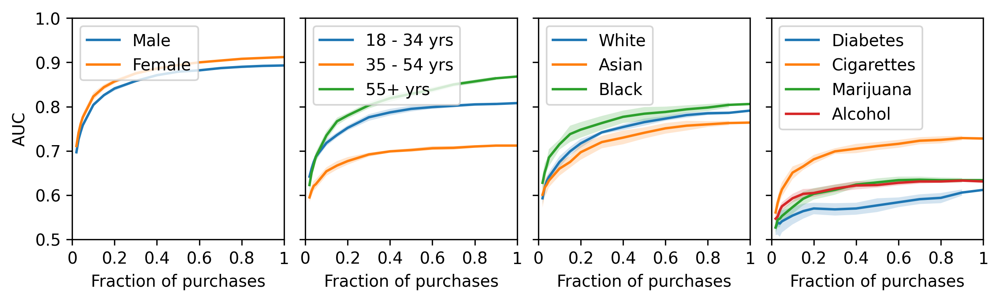

In [102]:
axes = plot_auc_results_by_socio(p_pct_svm_results_dfs, dpi=300)
for ax in axes:
    ax.set_xlim(0, 1)
    ax.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])
    ax.set_xticklabels([0, 0.2, 0.4, 0.6, 0.8, 1])
    ax.set_xlabel('Fraction of purchases')
    ax.legend(loc='upper left')

---

### How do more users impact the models' predictive power?

Our sample is relatively small compared to the number of Amazon users making purchases.
We use the following approach to empirically test how model predictive power can increase with more users in the sample.

We use the existing train/test division and randomly sample increasing numbers of users from train data.
- For n=[10%, 20%, ...100%] of users:
- Train on the random subsample of the train data
- Test on the full test sample
- with repeated sampling to create means and confidence intervals (except for 100%)


Want a table: AUC mean values and 95% CIs

```
n, Female, Female 95% CI, Male, Male 95% CI ... for each label
```
where we 
- use the means for plots
- provide the table with CIs in SI 


In [103]:
"""
Make a dict
{n: {label: [auc results]} for n in [10%, ...100%]}
"""
ns = [n/100 for n in range(10, 110, 10)]

def get_svm_results_varying_train_n(X_y_data, use_labels, repeated_samples=10, verbose=True):
    print('getting SVM results for varying training n: %s with %s repeated samples for labels: %s' % (
            ns, repeated_samples, use_labels))
    n_svm_results = {n: {label: [] for label in use_labels} for n in ns} # results dict: map label to results
    for l, label in enumerate(use_labels):
        print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), l+1, len(use_labels), label))
        X_train, X_test, y_train, y_test = X_y_data[label]['train_test_split']
        for n in ns:
            for i in range(repeated_samples):
                n_i_X_train = X_train.sample(frac=n, replace=False, random_state=RANDOM+i)
                n_i_train_rids = n_i_X_train.index.tolist()
                if (i==0): print('%s: train with %s%% --> n=%s' % (datetime.datetime.now(), n, len(n_i_train_rids)))
                n_i_y_train = y_train.loc[n_i_train_rids]    
                clf = svm.SVC(probability=True, class_weight='balanced')
                clf.fit(n_i_X_train, n_i_y_train)
                auc = get_auc_and_plot(clf, X_test, y_test, plot=False)
                n_svm_results[n][label] += [auc]
                if n==100: 
                    if verbose: print('n==100')
                    break
    return n_svm_results

In [104]:
RECOMPUTE_VARYING_N_TRAIN_RESULTS = False
computed_varying_n_auc_table_fpath = './preprocessed/varying_n_AUC.csv'

if RECOMPUTE_VARYING_N_TRAIN_RESULTS:
    use_labels = ['Male', 'Female'] + age_groups + socio_groups['Race']

    n_svm_results = get_svm_results_varying_train_n(X_y_data, use_labels, repeated_samples=10)
    n_svm_results_df = pd.DataFrame({
        'n':ns,
    }).set_index('n')
    for label in use_labels:
        means = []
        CIs = []
        for n in ns:
            data = n_svm_results[n][label]
            means += [np.mean(data)]
            CI = np.nan if len(data) < 2 else st.t.interval(0.95, len(data)-1, loc=np.mean(data), scale=st.sem(data))
            CIs += [CI]
        n_svm_results_df[label] = means
        n_svm_results_df[get_CI_colname(label)] = CIs
    # Save the data
    print('saving table to %s...' % computed_varying_n_auc_table_fpath)
    n_svm_results_df.to_csv(computed_varying_n_auc_table_fpath)
    print('...saved')

n_svm_results_df = pd.read_csv(computed_varying_n_auc_table_fpath, index_col=0)
n_svm_results_df

getting SVM results for varying training n: [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0] with 10 repeated samples for labels: ['Male', 'Female', '18 - 34 yrs', '35 - 54 yrs', '55+ yrs', 'White', 'Asian', 'Black']

2024-11-16 23:47:13.155093
1/8: SVM for Male
2024-11-16 23:47:13.161616: train with 0.1% --> n=340
2024-11-16 23:47:20.408358: train with 0.2% --> n=680
2024-11-16 23:47:41.955721: train with 0.3% --> n=1019
2024-11-16 23:48:22.580781: train with 0.4% --> n=1359
2024-11-16 23:49:28.330667: train with 0.5% --> n=1699
2024-11-16 23:51:05.524029: train with 0.6% --> n=2039
2024-11-16 23:53:19.764157: train with 0.7% --> n=2379
2024-11-16 23:56:22.399122: train with 0.8% --> n=2718
2024-11-17 00:00:30.645614: train with 0.9% --> n=3058
2024-11-17 00:05:35.850568: train with 1.0% --> n=3398

2024-11-17 00:11:53.837796
2/8: SVM for Female
2024-11-17 00:11:53.852854: train with 0.1% --> n=340
2024-11-17 00:12:01.179642: train with 0.2% --> n=680
2024-11-17 00:12:22.881966: tra

,Male,Male 95 CI,Female,Female 95 CI,18 - 34 yrs,18 - 34 yrs 95 CI,35 - 54 yrs,35 - 54 yrs 95 CI,55+ yrs,55+ yrs 95 CI,White,White 95 CI,Asian,Asian 95 CI,Black,Black 95 CI
n,,,,,,,,,,,,,,,,
0.1,0.857706,"(0.8503294031518779, 0.8650821959472214)",0.873074,"(0.8603001652492945, 0.8858469919413405)",0.707125,"(0.6995929671054265, 0.7146576185692209)",0.618549,"(0.557389067853173, 0.6797086467327222)",0.774544,"(0.7579148967904806, 0.7911732491061759)",0.711658,"(0.6982527690051172, 0.7250622498658617)",0.672380,"(0.662153919539155, 0.6826065105683718)",0.709208,"(0.6737155612615711, 0.7447009713099813)"
0.2,0.872184,"(0.8682752190568843, 0.876093587249422)",0.892128,"(0.8876566494543634, 0.8966003182156479)",0.749145,"(0.7388852207022633, 0.7594056616034396)",0.673655,"(0.665828982477348, 0.6814806481272273)",0.809745,"(0.7962272335346617, 0.8232622407420466)",0.743684,"(0.7314804772831863, 0.7558865910874336)",0.711423,"(0.6932647021172068, 0.7295808892806425)",0.754969,"(0.7392506253033824, 0.7706880826826594)"
0.3,0.879574,"(0.8762550760308024, 0.8828930095547832)",0.899837,"(0.8965156097711786, 0.9031583032722996)",0.769708,"(0.7641353429577991, 0.7752806992661585)",0.687724,"(0.6804582513864829, 0.6949892776069305)",0.826926,"(0.813454434149452, 0.8403970236913677)",0.761972,"(0.7514767315185568, 0.7724666454254575)",0.725332,"(0.7080064942712291, 0.7426567315352227)",0.759885,"(0.7466481885276895, 0.7731225540277714)"
0.4,0.884041,"(0.8806736447864147, 0.8874074362946665)",0.903190,"(0.9002276504817112, 0.9061525055940968)",0.782588,"(0.7785313065234631, 0.7866438974242334)",0.694936,"(0.688321298047287, 0.7015499128931444)",0.841574,"(0.8297611366207195, 0.8533864486545256)",0.769132,"(0.7619862472215511, 0.7762778250649238)",0.739542,"(0.7257860699781118, 0.7532986612046839)",0.772824,"(0.7615306005645169, 0.7841183896540732)"
0.5,0.886474,"(0.8837299546532184, 0.8892182435449797)",0.905520,"(0.903695985520779, 0.9073435908448843)",0.789246,"(0.7852691353325444, 0.7932223440013094)",0.700300,"(0.6949384945784082, 0.7056607122518569)",0.849583,"(0.8417042370853409, 0.8574613038355192)",0.775223,"(0.7687684067268331, 0.781678324495784)",0.747250,"(0.7365348318953886, 0.7579649530508481)",0.785071,"(0.7760215892817678, 0.7941207022078632)"
0.6,0.888463,"(0.8865529853628287, 0.8903738164389732)",0.907686,"(0.9063104914545812, 0.9090618608308147)",0.795657,"(0.7916745741077169, 0.7996386109100886)",0.703458,"(0.6990898193727427, 0.707825304538381)",0.853609,"(0.8482407450449432, 0.8589766927576008)",0.779379,"(0.7725122785909637, 0.7862447664059504)",0.754264,"(0.7429027043224052, 0.7656254677206054)",0.788004,"(0.781039928525638, 0.7949675928542461)"
0.7,0.890138,"(0.8883375210114097, 0.8919383798894911)",0.908925,"(0.9078742142495234, 0.9099763989054376)",0.800017,"(0.796137513852043, 0.8038957159151825)",0.706686,"(0.7035524722124081, 0.7098200000641738)",0.861076,"(0.8569966923768096, 0.8651551707325004)",0.783883,"(0.7783498039846701, 0.7894157304232465)",0.759196,"(0.7510467166997276, 0.7673446811497348)",0.792546,"(0.7844023673735817, 0.8006886666353498)"
0.8,0.891557,"(0.8898864292512773, 0.8932267464243985)",0.909963,"(0.9092518842900152, 0.9106739797010661)",0.803698,"(0.800790986773202, 0.80660595941119)",0.708484,"(0.7047692648437801, 0.7121996029554915)",0.863409,"(0.8598431674651785, 0.8669749120124755)",0.785636,"(0.7813226889600855, 0.7899499132113419)",0.760643,"(0.754041369577165, 0.7672437917131576)",0.799815,"(0.7942488263106313, 0.805380528767204)"
0.9,0.892004,"(0.8910341003744289, 0.8929732194453912)",0.911287,"(0.9106584065555258, 0.9119157294533929)",0.805597,"(0.80357648237375, 0.8076180723750604)",0.709524,"(0.7074040002412755, 0.7116430415357943)",0.865672,"(0.8642705367304863, 0.8670730408896871)",0.788025,"(0.7854592825012613, 0.7905912694622313)",0.762517,"(0.7583736237704823, 0.7666603547241413)",0.801672,"(0.7975949620968648, 0.8057480742986585)"


### Plot the results

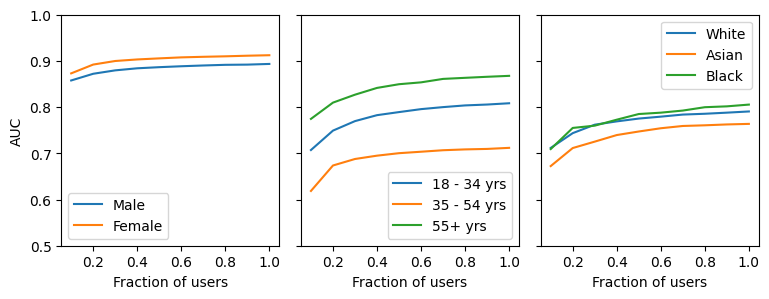

In [105]:
cols = 3
fig, axes = plt.subplots(1,cols, figsize=(3*cols,3), sharey=True, sharex=True)
plt.subplots_adjust(wspace=0.1)
for i, (socio, labels) in enumerate(socio_groups.items()):
    if socio == 'Health / lifestyle': continue
    ax = axes[i]
    if i == 0:
        ax.set_ylabel('AUC')
        ax.set_ylim(0.5, 1)
    for label in labels:
        mean_aucs = n_svm_results_df[label]
        ax.plot(n_svm_results_df[label], label=label)
    ax.set_xlabel('Fraction of users')
    ax.legend()

## How do specific categories contribute to risk?

Here we use all of the data, without dividing a train/test sample.

Get a table for each sociodemographic group showing most predictive categories.

Use logistic regression model.

- Train on all data (not train vs test).
- Get coefficients for categories (features)
- Compute odds ratios
- Extract the most informative categories (features)

Create a table for each socio-demographic group.

In [106]:
def get_OR_col(label=None):
    return '%s: OR' % label if label else 'OR'

def get_cat_col(label=None):
    return '%s: %s' % (label, CATEGORY) if label else CATEGORY

def get_category_features_OR(clf, label=None):
    return pd.DataFrame({
        get_cat_col(label): clf.feature_names_in_, 
        #'Log Odds': clf.coef_[0],
        get_OR_col(label): np.exp(clf.coef_[0]).round(2)
    })

def get_important_category_features(clf, label=None, pos_num=10, neg_num=10):
    """
    Returns table with pos_num top positive Categories and neg_num top negative Categories.
    """
    df = get_category_features_OR(clf, label)
    return pd.concat([
        df.sort_values(get_OR_col(label), ascending=False).head(pos_num)[[get_cat_col(label), get_OR_col(label)]],
        df.sort_values(get_OR_col(label), ascending=True).head(neg_num)[[get_cat_col(label), get_OR_col(label)]].sort_values(get_OR_col(label),ascending=False),
    ]).reset_index().drop('index', axis=1)

In [107]:
from functools import reduce

labels_all_cat_features_dict = dict()
labels_important_cat_features_dict = dict() # {label: table}
socio_important_cat_features_dict = dict() # {socio: table}

for i, (socio, labels) in enumerate(socio_groups.items()):
    print('%s: %s: %s' % (i, socio, labels))
    for l, label in enumerate(labels):
        print('%s: %s' % (l, label))
        y_l = labeled_y[label]
        print('%s: %s positive samples' % (label, y_l.sum()))
        # Get the rids that are shared across both X and y, in consistent order
        rids = list(set(y_l.index).intersection(set(X.index)))
        clf = LogisticRegression(class_weight='balanced', random_state=RANDOM).fit(X.loc[rids], y_l.loc[rids])
        labels_all_cat_features_dict[label] = get_category_features_OR(clf)
        labels_important_cat_features_dict[label] = get_important_category_features(clf)
    
# merge them to make the combined socio tables
for i, (socio, labels) in enumerate(socio_groups.items()):
    dfs = []
    for label in labels:
        df = labels_important_cat_features_dict[label]
        df = df.rename({get_cat_col(): get_cat_col(label), get_OR_col():get_OR_col(label)}, axis=1)
        dfs += [df]
    comb_socio_df = reduce(lambda left,right: pd.merge(left,right, left_index=True, right_index=True, how='outer'), dfs)
    socio_important_cat_features_dict[socio] = comb_socio_df

0: Gender: ['Male', 'Female']
0: Male
Male: 2311 positive samples
1: Female
Female: 2589 positive samples
1: Age: ['18 - 34 yrs', '35 - 54 yrs', '55+ yrs']
0: 18 - 34 yrs
18 - 34 yrs: 2581 positive samples
1: 35 - 54 yrs
35 - 54 yrs: 1917 positive samples


/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


2: 55+ yrs
55+ yrs: 529 positive samples
2: Race: ['White', 'Asian', 'Black']
0: White
White: 4133 positive samples
1: Asian
Asian: 483 positive samples
2: Black
Black: 448 positive samples
3: Health / lifestyle: ['Diabetes', 'Cigarettes', 'Marijuana', 'Alcohol']
0: Diabetes
Diabetes: 617 positive samples


/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


1: Cigarettes
Cigarettes: 755 positive samples
2: Marijuana
Marijuana: 1061 positive samples


/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


3: Alcohol
Alcohol: 2211 positive samples


In [108]:
for socio, df in socio_important_cat_features_dict.items():
    display(df)

,Male: Category,Male: OR,Female: Category,Female: OR
0,MEN:NUTRITIONAL_SUPPLEMENT,6.09,CELL_PHONE_HOLSTER,5.77
1,FAUCET_WATER_AERATOR,5.85,LIGHT_BOX,3.85
2,WEAPON_CASE,5.52,DISPLAY_ENCLOSURE,3.83
3,WOMEN:NAIL_POLISH,4.56,DRAWER_SLIDE,3.69
4,MEN:TOPICAL_HAIR_REGROWTH_TREATMENT,4.46,WOMEN:NUTRITIONAL_SUPPLEMENT,3.65
5,CONDOM,4.27,WASHER,3.57
6,HYDRATION_PACK,3.89,WOMEN:SHOE_INSERT,3.55
7,SOLID_FIRE_FUEL,3.80,HAIR_IRON,3.48
8,MEN:VITAMIN,3.62,SOAP_DISH,3.41
9,BOTTLE_RACK,3.49,WOMEN:BOOK,3.38


,18 - 34 yrs: Category,18 - 34 yrs: OR,35 - 54 yrs: Category,35 - 54 yrs: OR,55+ yrs: Category,55+ yrs: OR
0,MEN:KNIFE,4.59,ADVENT_CALENDAR,4.84,CORRECTIVE_EYEGLASSES,5.07
1,BRAKE_ROTOR,4.47,PROJECTILE_BOW,4.71,BLOOD_OXYGEN_MONITOR,4.83
2,BRAKE_KIT,4.30,AUTO_BATTERY,4.06,TOASTER,4.68
3,FISHING_ROD_REEL_COMBO,4.12,SNOW_PANT,3.98,WOMEN:APPAREL_GLOVES,4.26
4,MEN:BASE_LAYER_APPAREL_SET,4.00,SHOWER_CAP,3.74,CLOTHES_PIN,3.98
5,SOUS_VIDE_MACHINE,3.97,INSTALLATION_SERVICES,3.45,MOP_BUCKET_SET,3.84
6,CHISEL,3.88,POWER_SUPPLIES_OR_PROTECTION,3.30,BAKING_PAN,3.70
7,WOMEN:HOME_BED_AND_BATH,3.84,MASSAGE_STICK,3.26,INKJET_PRINTER_INK,3.52
8,PALETTE_PUTTY_KNIFE,3.81,MEN:WATCH_BAND,3.25,FISH,3.22
9,BOOK:CATERPILLARS,3.65,ADULT_COSTUME,3.16,POPCORN_POPPER,3.12


,White: Category,White: OR,Asian: Category,Asian: OR,Black: Category,Black: OR
0,WOMEN:KEYCHAIN,7.51,MUSICAL_INSTRUMENT_TOY,6.62,HAIR_EXTENSION,9.07
1,PICKLE,5.61,PUNCHING_BAG,6.09,EXERCISE_STEP_PLATFORM,7.74
2,FACE_SHAPING_MAKEUP,5.10,ABDOMINAL_EXERCISER,5.74,WOMEN:WAIST_CINCHER,6.29
3,BOOK:ANTIQUES & COLLECTIBLES,5.09,WOMEN:BREAST_PETAL,5.17,WOMEN:WIG,5.37
4,CARBURETOR,4.81,RICE_COOKERS,4.58,HAIR_STYLING_AGENT,5.28
5,TRAMPOLINE,4.44,BLOWTORCH,4.24,INSTALLATION_SERVICES,4.38
6,SWIMWEAR,4.25,BISS,4.24,WOMEN:BODY_POSITIONER,4.11
7,WOMEN:NECKLACE,4.11,STETHOSCOPE,4.05,WOMEN:SHOWER_CAP,3.56
8,BOOK:NATURE,4.02,SHOE_TREE,4.02,ELECTRONIC_SENSOR,3.56
9,FIREPLACE,4.01,ARM_SLEEVE,3.67,ROASTING_PAN,3.48


,Diabetes: Category,Diabetes: OR,Cigarettes: Category,Cigarettes: OR,Marijuana: Category,Marijuana: OR,Alcohol: Category,Alcohol: OR
0,SHOWER_CAP,8.55,ASHTRAY,18.21,ROLLING_PAPER,34.15,SNOW_PANT,4.48
1,SHARPS_DISPOSAL_CONTAINER,7.46,CIGARETTE_CASE,12.71,DRIED_PLANT,7.85,VEHICLE_WRAP,4.10
2,ANIMAL_MUZZLE,6.76,NAN,6.20,ASHTRAY,6.52,BAR_TOOL_SET,3.97
3,GARDEN_TOOL_SET,6.07,MEN:SPORT_ACTIVITY_GLOVE,5.89,TOGGLE_SWITCH,5.90,HIP_FLASK,3.81
4,DISPOSABLE_INCONTINENCE_SURFACE_PROTECTOR,5.61,VEHICLE_COVER,5.31,VEHICLE_BUMPER,4.20,WOMEN:CANDLE,3.78
5,INDUSTRIAL_CASTERS,5.22,ROLLING_PAPER,5.07,ALARM,4.16,DISHWASHER,3.53
6,MAGAZINES,4.80,MOTHERBOARD,5.01,FACIAL_TISSUE_HOLDER,3.85,EGG,3.35
7,CLOTHES_PIN,4.57,BOOK:DRAMA,4.99,EXERCISE_STRAP,3.64,COOKING_CONTAINER,3.32
8,SPOON_REST,4.51,MEN:BACKPACK,4.98,IGNITION_COIL,3.62,BOTTLE_RACK,3.27
9,UTILITY_MAGNET,4.49,SHEET_PAPER,4.75,FASHIONNECKLACEBRACELETANKLET,3.59,MEN:DRINKING_CUP,3.21


### Visualization

### Heatmap visualization of important categories


Pick out some important categories.

Below are picked with criteria:

For each socio-demographic category, choose 5-6 product categories that are within the top 5 most positive or negative predictors for labels within that socio-demographic category.
Product categories are chosen to range across products related to food and kitchen appliances to personal health and toys.


In [109]:
socio_heatmap_cats = dict()
socio_heatmap_cats['Gender'] = [
    #Gender
    #'BOOK:PHOTOGRAPHY',
    'HAIR_IRON',
    'WOMEN:NUTRITIONAL_SUPPLEMENT',
    'MEN:NUTRITIONAL_SUPPLEMENT',
    'WEAPON_CASE',
    'HYDRATION_PACK',
    #'MENSTRUAL_CUP',
    'CONDOM',
]
socio_heatmap_cats['Age'] = [
    #'SOUS_VIDE_MACHINE',
    'HAIR_REMOVAL_AGENT',
    #'CRIB',
    'CORRECTIVE_EYEGLASSES',
    'INKJET_PRINTER_INK',
    'BLOOD_OXYGEN_MONITOR',
    #'CONDOM',
    'TAMPON',
    #'PARTY_DECORATION_PACK',
    'ADVENT_CALENDAR'
]
socio_heatmap_cats['Race'] = [
    # Race
    'PICKLE',
    #'BOOK:ANTIQUES & COLLECTIBLES'
    #'SELF_TANNER',
    'RICE_COOKERS',
    
    'HAIR_EXTENSION',
    'WOMEN:WIG',
    'BLOWTORCH',#'SHOE_TREE',
    'STETHOSCOPE',
    #'MUSICAL_INSTRUMENT_TOY',
]
socio_heatmap_cats['Health / lifestyle'] =[
    # Health / lifestyle
    'SHARPS_DISPOSAL_CONTAINER',
    'ASHTRAY',
    'CIGARETTE_CASE',
    'ROLLING_PAPER',
    'DRIED_PLANT',
    'BAR_TOOL_SET',
    #'HIP_FLASK',
]

In [110]:
# flatten a list of lists
xss = socio_heatmap_cats.values()
heatmap_cats = [x for xs in xss for x in xs]
# heatmap_cats

In [111]:
"""
Make separate heatmap dfs
"""
heatmap_dfs = dict()
for socio, ls in socio_groups.items():
    hmap_cats = socio_heatmap_cats[socio]
    heatmap_df = (pd.DataFrame(
        {l: labels_all_cat_features_dict[l].set_index(get_cat_col())['OR'].loc[hmap_cats] for l in ls}
    ).round(2))
    display(heatmap_df)
    heatmap_dfs[socio] = heatmap_df

,Male,Female
Category,,
HAIR_IRON,0.29,3.48
WOMEN:NUTRITIONAL_SUPPLEMENT,0.35,3.65
MEN:NUTRITIONAL_SUPPLEMENT,6.09,0.13
WEAPON_CASE,5.52,0.22
HYDRATION_PACK,3.89,0.47
CONDOM,4.27,0.16


,18 - 34 yrs,35 - 54 yrs,55+ yrs
Category,,,
HAIR_REMOVAL_AGENT,1.99,0.90,0.29
CORRECTIVE_EYEGLASSES,0.48,0.89,5.07
INKJET_PRINTER_INK,0.69,0.78,3.52
BLOOD_OXYGEN_MONITOR,0.33,0.99,4.83
TAMPON,0.97,2.05,0.23
ADVENT_CALENDAR,0.21,4.84,0.66


,White,Asian,Black
Category,,,
PICKLE,5.61,0.97,0.35
RICE_COOKERS,0.39,4.58,1.43
HAIR_EXTENSION,0.15,0.40,9.07
WOMEN:WIG,0.38,0.62,5.37
BLOWTORCH,0.61,4.24,0.60
STETHOSCOPE,0.39,4.05,0.51


,Diabetes,Cigarettes,Marijuana,Alcohol
Category,,,,
SHARPS_DISPOSAL_CONTAINER,7.46,1.84,2.32,0.50
ASHTRAY,0.44,18.21,6.52,0.78
CIGARETTE_CASE,1.69,12.71,1.22,2.73
ROLLING_PAPER,1.07,5.07,34.15,0.71
DRIED_PLANT,2.47,0.49,7.85,1.35
BAR_TOOL_SET,1.15,1.21,0.99,3.97


In [112]:
"""
Make a combined table where the column names are the demo/label
Rows are the product categories
Cells are the OR values for the demo/label
"""
ls = [l for labels in socio_groups.values() for l in labels]
heatmap_df = (pd.DataFrame(
    {l: labels_all_cat_features_dict[l].set_index(get_cat_col())['OR'].loc[heatmap_cats] for l in ls}
).round(2))
heatmap_df

,Male,Female,18 - 34 yrs,35 - 54 yrs,55+ yrs,White,Asian,Black,Diabetes,Cigarettes,Marijuana,Alcohol
Category,,,,,,,,,,,,
HAIR_IRON,0.29,3.48,1.20,1.06,0.86,0.92,2.00,1.00,1.21,0.63,0.97,1.27
WOMEN:NUTRITIONAL_SUPPLEMENT,0.35,3.65,0.85,1.13,0.95,1.18,1.37,1.83,0.60,0.68,1.64,1.04
MEN:NUTRITIONAL_SUPPLEMENT,6.09,0.13,0.65,1.03,1.87,0.56,1.38,1.08,0.53,0.61,0.50,1.29
WEAPON_CASE,5.52,0.22,1.69,0.50,1.58,0.81,0.95,0.69,1.71,1.01,0.73,1.18
HYDRATION_PACK,3.89,0.47,1.79,0.83,0.47,0.98,0.82,0.96,0.59,1.39,0.88,1.01
CONDOM,4.27,0.16,2.25,0.81,0.28,0.59,0.79,1.29,0.43,0.53,0.86,2.26
HAIR_REMOVAL_AGENT,0.74,1.75,1.99,0.90,0.29,0.93,0.94,1.08,0.52,0.72,0.74,0.86
CORRECTIVE_EYEGLASSES,0.54,2.36,0.48,0.89,5.07,1.08,1.35,1.08,1.02,1.40,1.51,1.58
INKJET_PRINTER_INK,0.80,1.67,0.69,0.78,3.52,1.60,0.62,1.62,1.48,1.39,0.75,1.16


In [113]:
# Display this in color / plots
# Borrowed from https://matplotlib.org/stable/gallery/images_contours_and_fields/image_annotated_heatmap.html#sphx-glr-gallery-images-contours-and-fields-image-annotated-heatmap-py
import matplotlib

CMAP = 'Reds' # not enough differentiation between positive and negative
CMAP = 'copper'
CMAP = 'cividis'

def make_heatmap_im(plt_df, ax=None, dpi=None, cmap=CMAP, text=True):
    if ax is None:
        fig, ax = plt.subplots(1,1,figsize=(8,8))#, dpi=dpi)
    im = ax.imshow(plt_df, aspect='auto', cmap=cmap, norm='log')
    # Show all ticks and label them with the respective list entries.
    ax.set_xticks([i for i in range(len(plt_df.columns))], labels=plt_df.columns)
    _ = ax.set_yticks([i for i in range(len(plt_df))], labels=plt_df.index)
    # Let the horizontal axes labeling appear on top.
    ax.tick_params(top=True, bottom=False, labeltop=True, labelbottom=False)
    # Turn spines off and create white grid.
    ax.spines[:].set_visible(False)
    ax.set_xticks(np.arange(len(plt_df.columns)+1)-.5, minor=True)
    ax.set_yticks(np.arange(len(plt_df)+1)-.5, minor=True)
    ax.grid(which="minor", color="w", linestyle='-', linewidth=3)
    ax.tick_params(which="minor", bottom=False, left=False)
    # #cbar = ax.figure.colorbar(im, ax=ax) # problably don't need a color bar
    plt.setp(ax.get_xticklabels(), rotation=-27, ha="right",rotation_mode="anchor")
    textcolors=("black", "white")
    threshold = im.norm(plt_df.max().max())/2
    kw = dict(horizontalalignment="center", verticalalignment="center")
    valfmt = matplotlib.ticker.StrMethodFormatter("{x:.1f}")
    # Loop over the data, create a `Text` for each "pixel", colored depending on the data
    if not text: return ax
    texts = []
    for i in range(len(plt_df)):
        for j in range(len(plt_df.columns)):
            kw.update(color=textcolors[int(im.norm(plt_df.iloc[i, j]) < threshold)])
            text = im.axes.text(j, i, valfmt(plt_df.iloc[i, j], None), **kw)
            texts.append(text)
    return ax

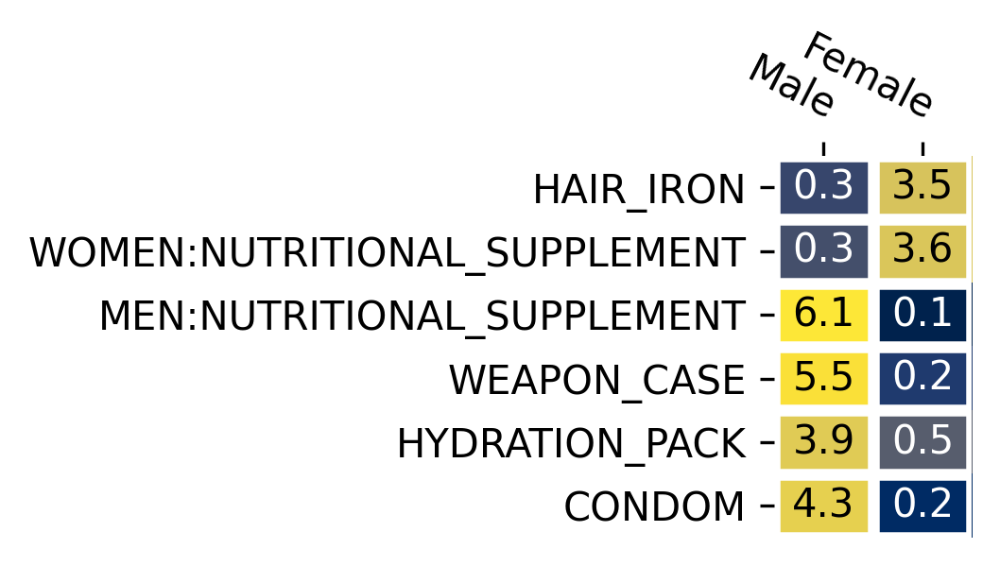

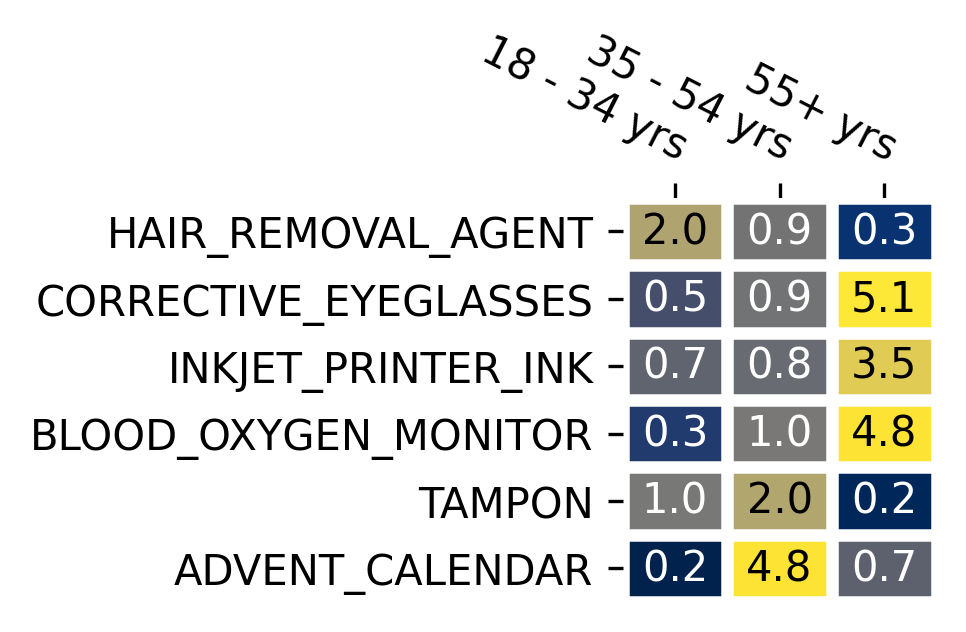

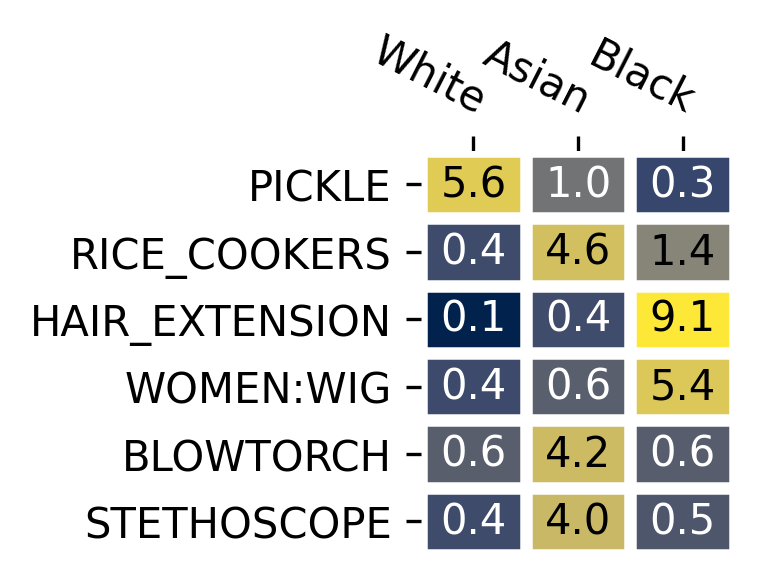

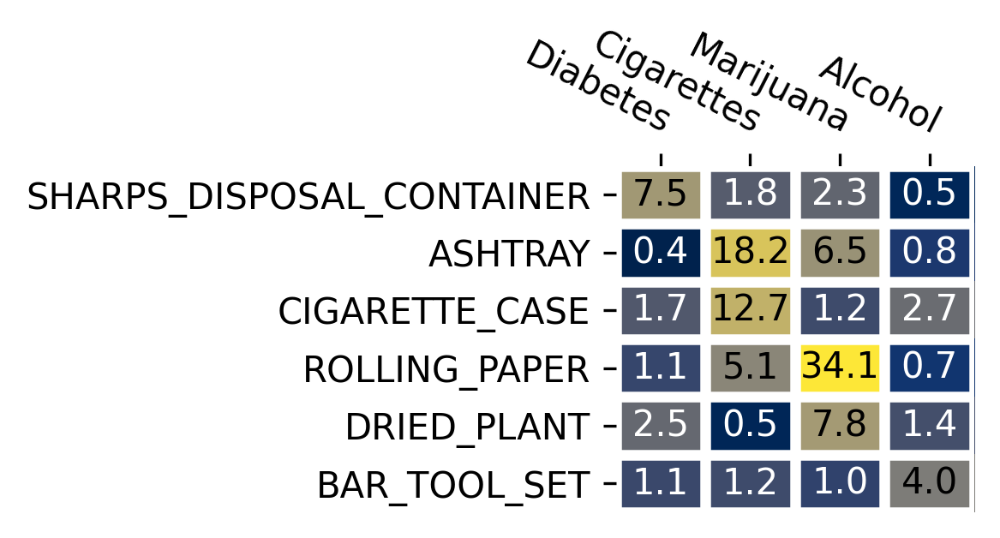

In [154]:
for socio, hmap_df in heatmap_dfs.items():
    cols = len(hmap_df.columns)
    fig, ax = plt.subplots(1,1,figsize=(0.45*cols, 1.75), dpi=300)
    ax = make_heatmap_im(heatmap_dfs[socio], ax=ax, dpi=None, cmap='cividis')

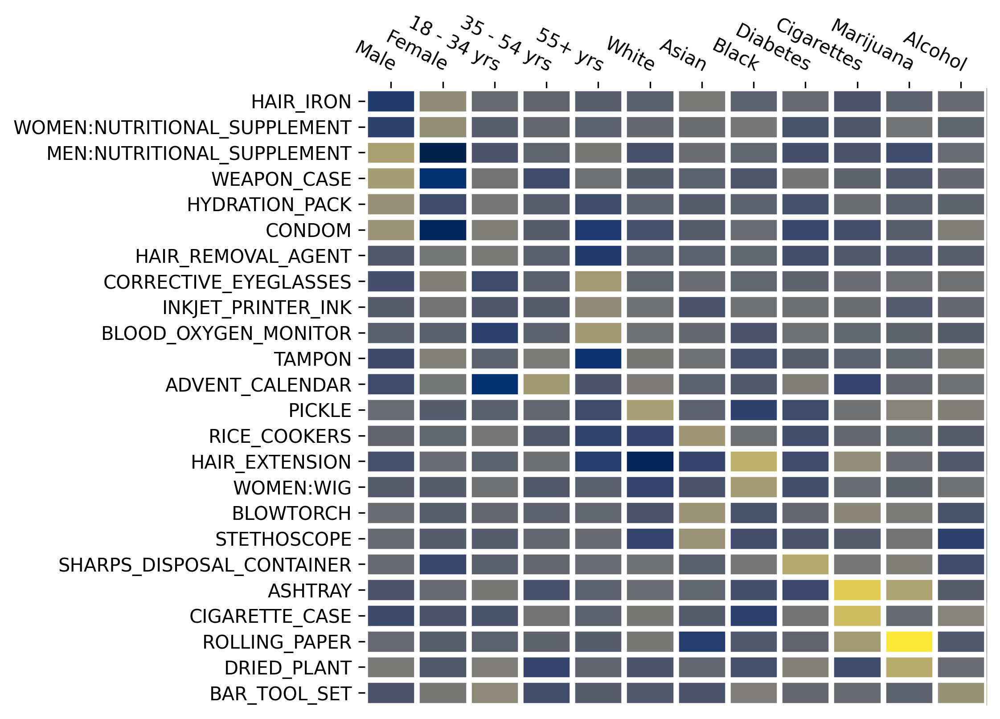

In [115]:
fig, ax = plt.subplots(1,1,figsize=(6,6), dpi=300)
ax = make_heatmap_im(heatmap_df, ax=ax, text=False)

### Helper for interpretation

In [116]:
def view_category_top_purchases(cat, num=10):
    df = amzn_data[amzn_data[CATEGORY]==cat].groupby(
        [TITLE]
    )[DATE].count().sort_values(ascending=False).to_frame()
    display(df.head(num))
    return df

In [117]:
cat = 'PICKLE'#'RELAY'#'INSTALLATION_SERVICES'#'OTC_MEDICATION' #'EXERCISE_STEP_PLATFORM'#  # 
# cat = 'SHARPS_DISPOSAL_CONTAINER'
# cat = 'OTC_MEDICATION' ## This is a lot of pill splitters! knives!?
cat = 'WOMEN:NAIL_POLISH' # 'Gift sets for women'
cat = 'SPOON_REST'
cat = 'TOILET'
cat = 'MEN:KNIFE' # I'm guessing men buy other men knives as gifts
cat = 'WOMEN:KEYCHAIN' # WHY: White
cat = 'FACE_SHAPING_MAKEUP'
cat = 'BOOK:PHOTOGRAPHY'
cat = 'CELL_PHONE_HOLSTER'
cat = 'WOMEN:BOOK'
cat = 'WASHER'
cat = 'LIGHT_BOX'
_ = view_category_top_purchases(cat)

,Order Date
Title,
A4 Ultra-thin Portable LED Light Box Tracer USB Power Cable Dimmable Brightness LED Artcraft Tracing Light Pad for Artists Drawing Sketching Animation Stencilling X-rayViewing,12
"Crayola Light Up Tracing Pad Pink, Gifts & Toys for Girls and Boys, Age 6, 7, 8, 9 [Amazon Exclusive]",9
"Crayola Light Up Tracing Pad Pink, Holiday Gifts & Toys for Kids, Age 6, 7, 8, 9 [Amazon Exclusive]",7
"Ultra-Thin Portable LED Light Box Tracer w 3 Level Brightness 7500K USB Power Cable Dimmable Brightness Artcraft Tracing Light Pad for Drawing, Sketching, Animation, 5D Diamond Painting (A4)",6
"Crayola Ultimate Light Board for Drawing & Coloring - White, Light Up Kids Toy, Gift for Kids Ages 6, 7, 8, 9",6
"ARTDOT A4 LED Light Board for Diamond Painting Kits, USB Powered Light Pad, Adjustable Brightness with Detachable Stand and Clips",6
"LitEnergy Portable A4 LED Copy Board Light Tracing Box, Ultra-Thin Adjustable USB Power Artcraft LED Trace Light Pad for Tattoo Drawing, Streaming, Sketching, Animation, Stenciling",5
"A4 Ultra-Thin Portable LED Light Box Tracer w 3 Level Brightness USB Power Cable Dimmable Brightness Artcraft Tracing Light Pad for Drawing, Sketching, Animation, 5D Diamond Painting (A4)",4
ME456 A4 LED Light Box 9x12 Inch Light Pad Only 5mm Ultra-Thin USB Power Light Table for Tracing,4


In [118]:
# For later on can use:
labels_all_cat_features_dict['Male'].sort_values('OR').set_index(CATEGORY)

,OR
Category,
WOMEN:SHOE_INSERT,0.16
EXERCISE_BLOCK,0.19
SOAP_DISH,0.24
FLAME_WICK,0.25
CELL_PHONE_HOLSTER,0.26
...,...
MEN:TOPICAL_HAIR_REGROWTH_TREATMENT,4.46
WOMEN:NAIL_POLISH,4.56
WEAPON_CASE,5.52


---

## Risk Mitigation: Dropping and swapping purchases

Consider users avoiding purchases. Sorry, impossible.

Consider users purchasing for their neighbors... and swapping purchases


Mean accuracy: 0.8682
ROC AUC=0.741


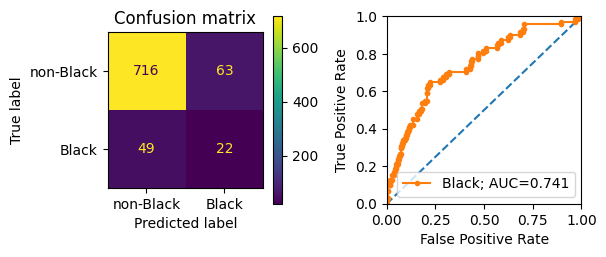

In [119]:
label = 'Black'

_X_train, X_test, _y_train, y_test = X_y_data[label]['train_test_split']
clf = onehot_svm_models[label] # already trained
test_rids = X_test.index.tolist()

# Get p X_test: feature vectors from p purchases for each test user
test_amzn_df = p50u_amzn_data[p50u_amzn_data[RESPONSE_ID].isin(test_rids)]
p_test_df = test_amzn_df.groupby(RESPONSE_ID).sample(n=50, replace=False, random_state=RANDOM)
p_X_test = get_X_one_hot_encoding_for_categories(p_test_df, cats_u50).loc[test_rids]
auc = get_auc_and_plot(clf, p_X_test, y_test, plot=True)

In [120]:
from sklearn.metrics import recall_score
from sklearn.metrics import confusion_matrix

def get_false_neg_true_pos(clf, y_test, X_test):
    """Returns (false negatives, true positives)"""
    y_pred = clf.predict(X_test)
    return tuple(confusion_matrix(y_test, y_pred)[1])

get_false_neg_true_pos(clf, y_test, p_X_test)

(49, 22)

In [121]:
def get_train_data_prevalence(label, verbose=True):
    """Returns the portion of the label=True in the training sample."""
    _X_train, X_test, _y_train, y_test = X_y_data[label]['train_test_split']
    return y_train.sum()/len(y_train)

In [122]:
def get_X_one_hot_encoding_for_categories_empty(cats, rids):
    """Returns empty feature vectors for rids and cats"""
    return pd.DataFrame(
        {**{c: [0]*len(rids) for c in cats}, **{RESPONSE_ID: rids}}
    ).set_index(RESPONSE_ID)

In [123]:
ps5 = [0,5,10,15,20,25,30,35,40,45,50]
#ps12345 = [0,1,2,3,4,5,10,15,20,25,30,35,40,45,50]


def get_random_swap_results(label, swap_ps, **kwargs):
    """
    Returns random_swap_results_df for label.
    """
    print('%s: Getting random swap results with p in %s' % (label, swap_ps))
    return get_swap_drop_results(label, swap_ps, swap_type='random_swap', **kwargs)


def get_targeted_swap_results(label, swap_ps, **kwargs):
    """
    Returns targeted_swap_results_df for label.
    """
    print('%s: Getting targeted swap results with p in %s' % (label, swap_ps))
    return get_swap_drop_results(label, swap_ps, swap_type='targeted_swap', **kwargs)


def get_targeted_drop_results(label, ps, **kwargs):
    """
    Returns targeted_drop_results_df for label.
    """
    print('%s: Getting targeted DROP results with p in %s' % (label, ps))
    return get_swap_drop_results(label, ps, swap_type='targeted_drop')


# get the number of purchases per user
# maps rid to purchases count
rids_purchases = p50u_amzn_data.groupby(RESPONSE_ID)[DATE].count()

    
def get_swap_drop_results(label, ps, swap_type='random_swap', start_p=50, verbose=True):
    """
    Args:
    start_p is the number of purchases each test user starts with
    """
    assert(ps[-1] <= start_p)
    if verbose: 
        print('Getting swap/drop results for label:%s; type:%s; start_p=%s' % (
            label, swap_type, start_p))
        print('ps: %s' % ps)
    if ps[-1] <= 1: # Transform fractions to integers
        ps = [int(p*start_p) for p in ps]
        print('Transformed ps to integers: %s' % ps)
    FN = []
    TP = []
    prediction_probs = []
    _X_train, X_test, y_train, y_test = X_y_data[label]['train_test_split']
    clf = onehot_svm_models[label] # already trained
    # get the negative test users
    neg_test_rids = y_test[y_test == 0].index
    # get the positive test users
    pos_test_rids = y_test[y_test > 0].index
    # limit the positive test users to those with at least start_p purchases
    pos_test_rids = list(set(pos_test_rids).intersection(
        set(rids_purchases[rids_purchases >= start_p].index)))
    pos_y_test = y_test.loc[pos_test_rids]
    print('n=%s positive test users; n=%s negative test users' % (
        len(pos_test_rids), len(neg_test_rids)))
    # get the pool of purchases made by users s.t. label=0
    neg_purchases = amzn_data[amzn_data[RESPONSE_ID].isin(neg_test_rids)]
    print('%s purchases made by negative test users' % len(neg_purchases))
    # Get p(start_p) X_test: feature vectors from start_p purchases for each test user
    test_amzn_df = p50u_amzn_data[p50u_amzn_data[RESPONSE_ID].isin(pos_test_rids)]
    
    _start_test_df = test_amzn_df.groupby(RESPONSE_ID).sample(n=start_p, replace=False, random_state=RANDOM)
    for p in ps: 
        print('%s: p=%s' % (datetime.datetime.now(), p))
        start_test_df = _start_test_df.copy()
        if p > 0:
            if swap_type == 'random_swap':
                start_test_df = do_random_swaps(start_test_df, neg_purchases, p)
            elif swap_type == 'targeted_swap':
                start_test_df = do_targeted_swaps(start_test_df, neg_purchases.copy(), p, label)
            elif swap_type == 'targeted_drop':
                start_test_df = do_targeted_drops(start_test_df, p, label)
            else:
                raise Exception('Swap type <%s> not implemented.' % swap_type)
        # get spend difference
        if (swap_type == 'targeted_drop') and (p==start_p):
            prediction_probs += [[]]
            FN += [np.nan]
            TP += [np.nan]
            continue
        p_X_test = get_X_one_hot_encoding_for_categories(start_test_df, cats_u50).loc[pos_test_rids]
        (fn, tp) = get_false_neg_true_pos(clf, pos_y_test, p_X_test)
        # get the prediction probability scores
        prediction_probs += [list(clf.predict_proba(p_X_test)[:, 1])]
        FN += [fn]
        TP += [tp]
    results_df = pd.DataFrame({
        'p': ps,
        'FN': FN,
        'TP': TP,
        'pred. probs': prediction_probs,
    }).set_index('p')
    results_df['Recall'] = results_df['TP'] / (results_df['TP'] + results_df['FN'])
    return results_df


def do_targeted_drops(pos_purchases_df, p, label):
    cat_importance = labels_all_cat_features_dict[label].set_index(CATEGORY)['OR']
    pos_test_rids = pos_purchases_df[RESPONSE_ID].unique()
    # attach the category importance values (OR) to the products
    pos_purchases_df['OR'] = pos_purchases_df[CATEGORY].map(cat_importance)
    # sort the positive purchases to have most important first
    pos_purchases_df = pos_purchases_df.sort_values('OR', ascending=False)
    # set up numeric checks
    n_pos_purchases = len(pos_purchases_df)
    for rid in pos_test_rids:
        pos_purchases_df = pos_purchases_df.drop(pos_purchases_df[pos_purchases_df[RESPONSE_ID]==rid].index[:p])
    # assert numbers did change: this was a drop
    assert((n_pos_purchases - p*len(pos_test_rids)) == len(pos_purchases_df))
    return pos_purchases_df


def do_targeted_swaps(pos_purchases_df, neg_purchases, p, label):
    cat_importance = labels_all_cat_features_dict[label].set_index(CATEGORY)['OR']
    pos_test_rids = pos_purchases_df[RESPONSE_ID].unique()
    # attach the category importance values (OR) to the products
    pos_purchases_df['OR'] = pos_purchases_df[CATEGORY].map(cat_importance)
    neg_purchases['OR'] = neg_purchases[CATEGORY].map(cat_importance)
    # sort the positive purchases to have most important first
    pos_purchases_df = pos_purchases_df.sort_values('OR', ascending=False)
    # sort the negative purchases to have least important first
    neg_purchases = neg_purchases.sort_values('OR', ascending=True)
    # set up numeric checks
    n_pos_purchases = len(pos_purchases_df)
    # get the p most important neg_purchases
    n_total_swaps = p*len(pos_test_rids)
    neg_p = neg_purchases.head(n_total_swaps).copy()
    # handle swap by reassigning the rids
    # order the rids so that the most important purchases are distributed across the rids
    neg_p[RESPONSE_ID] = list(pos_test_rids)*p
    # do the swaps in the dataframe
    # drop the p most important purchases for each pos test rid
    for rid in pos_test_rids:
        pos_purchases_df = pos_purchases_df.drop(pos_purchases_df[pos_purchases_df[RESPONSE_ID]==rid].index[:p])
    # add the swapped negative purchases
    pos_purchases_df = pd.concat([pos_purchases_df, neg_p])
    # assert numbers didn't change: this was a swap
    assert(n_pos_purchases == len(pos_purchases_df))
    return pos_purchases_df


def do_random_swaps(pos_purchases_df, neg_purchases, p):
    """
    Makes p swaps for each user in the pos_purchases_df.
    Where purchases to swap with are randomly selected from the pool of neg_purchases.
    Returns the modified pos_purchases_df
    """
    # set up numeric checks
    n_neg_purchases = len(neg_purchases)
    n_pos_purchases = len(pos_purchases_df)
    pos_test_rids = pos_purchases_df[RESPONSE_ID].unique()
    for i, rid in enumerate(pos_test_rids):
        # select the p random purchases from negative purchases
        p_sampled = neg_purchases.sample(n=p, replace=False, random_state=RANDOM)
        # drop these sampled purchases from the negative purchases so they cannot be sampled again
        neg_purchases = neg_purchases.drop(p_sampled.index)
        # replace p purchases for the rid with these sampled purchases
        # drop p purchases for the rid
        pos_purchases_df = pos_purchases_df.drop(pos_purchases_df[pos_purchases_df[RESPONSE_ID]==rid].index[:p])
        # update the sampled replacement purchases responseID to the rid
        p_sampled[RESPONSE_ID] = rid
        # add the p_sampled purchases
        pos_purchases_df = pd.concat([pos_purchases_df, p_sampled])
    # assert numbers didn't change: this was a swap
    assert((n_neg_purchases - (p*len(pos_test_rids))) == len(neg_purchases))
    assert(n_pos_purchases == len(pos_purchases_df))
    return pos_purchases_df

In [124]:
# ps = [p/100 for p in range(0,110,20)]
ps = [p/100 for p in range(0,105,5)]
print(ps)
start_ps = [50, 100, 150, 200, 250, 300, 350, 400, 450, 500]
print(start_ps)

[0.0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0]
[50, 100, 150, 200, 250, 300, 350, 400, 450, 500]


In [125]:
use_labels = ['Male', 'Female']

In [126]:
"""
Make a dictionary mapping
{label: {prevalence: p, start_p: {named_df: df for each type of swap/drop}}}
"""
swap_drop_results = {l: dict() for l in use_labels}
for l in use_labels:
    swap_drop_results[l] = {start_p: dict() for start_p in start_ps}
# add prevalence for intuition purposes
for l in use_labels:
    swap_drop_results[l]['prevalence'] = get_train_data_prevalence(l) # the portion of the label=True in the training sample
# swap_drop_results

In [127]:
# Get results for all start_ps
for l in use_labels:
    for start_p in start_ps:
        for swap_drop_type in ['random_swap','targeted_swap','targeted_drop']:
            rdf = get_swap_drop_results(l, ps, swap_type=swap_drop_type, start_p=start_p)
            swap_drop_results[l][start_p][swap_drop_type] = rdf

Getting swap/drop results for label:Male; type:random_swap; start_p=50
ps: [0.0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0]
Transformed ps to integers: [0, 2, 5, 7, 10, 12, 15, 17, 20, 22, 25, 27, 30, 32, 35, 37, 40, 42, 45, 47, 50]
n=370 positive test users; n=480 negative test users
224413 purchases made by negative test users
2024-11-17 03:16:42.855694: p=0
2024-11-17 03:16:45.914267: p=2
2024-11-17 03:17:00.390879: p=5
2024-11-17 03:17:14.803535: p=7
2024-11-17 03:17:27.179470: p=10
2024-11-17 03:17:39.615769: p=12
2024-11-17 03:17:52.101226: p=15
2024-11-17 03:18:04.663121: p=17
2024-11-17 03:18:17.177448: p=20
2024-11-17 03:18:29.564257: p=22
2024-11-17 03:18:42.494841: p=25
2024-11-17 03:18:57.413062: p=27
2024-11-17 03:19:09.855935: p=30
2024-11-17 03:19:24.473562: p=32
2024-11-17 03:19:38.089765: p=35
2024-11-17 03:19:51.127516: p=37
2024-11-17 03:20:05.069636: p=40
2024-11-17 03:20:18.660772: p=42
2024-11-17 0

2024-11-17 03:34:50.764785: p=30
2024-11-17 03:34:54.970348: p=37
2024-11-17 03:34:59.257009: p=45
2024-11-17 03:35:03.406757: p=52
2024-11-17 03:35:07.521334: p=60
2024-11-17 03:35:11.590487: p=67
2024-11-17 03:35:15.666071: p=75
2024-11-17 03:35:19.759990: p=82
2024-11-17 03:35:23.774631: p=90
2024-11-17 03:35:28.372257: p=97
2024-11-17 03:35:32.336351: p=105
2024-11-17 03:35:36.264039: p=112
2024-11-17 03:35:40.177645: p=120
2024-11-17 03:35:44.080786: p=127
2024-11-17 03:35:47.991644: p=135
2024-11-17 03:35:51.870315: p=142
2024-11-17 03:35:55.699364: p=150
Getting swap/drop results for label:Male; type:targeted_drop; start_p=150
ps: [0.0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0]
Transformed ps to integers: [0, 7, 15, 22, 30, 37, 45, 52, 60, 67, 75, 82, 90, 97, 105, 112, 120, 127, 135, 142, 150]
n=256 positive test users; n=480 negative test users
224413 purchases made by negative test users
2024-11-17 03:35:59.85

2024-11-17 03:48:41.257439: p=200
2024-11-17 03:48:43.531147: p=212
2024-11-17 03:48:45.717514: p=225
2024-11-17 03:48:47.769480: p=237
2024-11-17 03:48:49.794883: p=250
Getting swap/drop results for label:Male; type:random_swap; start_p=300
ps: [0.0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0]
Transformed ps to integers: [0, 15, 30, 45, 60, 75, 90, 105, 120, 135, 150, 165, 180, 195, 210, 225, 240, 255, 270, 285, 300]
n=154 positive test users; n=480 negative test users
224413 purchases made by negative test users
2024-11-17 03:48:50.285701: p=0
2024-11-17 03:48:53.395574: p=15
2024-11-17 03:49:01.662990: p=30
2024-11-17 03:49:11.048952: p=45
2024-11-17 03:49:18.964746: p=60
2024-11-17 03:49:26.824269: p=75
2024-11-17 03:49:35.735243: p=90
2024-11-17 03:49:43.723474: p=105
2024-11-17 03:49:51.475462: p=120
2024-11-17 03:49:59.926406: p=135
2024-11-17 03:50:07.894954: p=150
2024-11-17 03:50:16.908701: p=165
2024-11-17 03:

2024-11-17 04:01:09.489704: p=20
2024-11-17 04:01:13.177973: p=40
2024-11-17 04:01:16.841427: p=60
2024-11-17 04:01:20.437299: p=80
2024-11-17 04:01:23.963253: p=100
2024-11-17 04:01:27.595402: p=120
2024-11-17 04:01:31.092534: p=140
2024-11-17 04:01:34.608439: p=160
2024-11-17 04:01:38.117255: p=180
2024-11-17 04:01:41.575917: p=200
2024-11-17 04:01:45.062186: p=220
2024-11-17 04:01:48.512948: p=240
2024-11-17 04:01:51.940077: p=260
2024-11-17 04:01:55.401726: p=280
2024-11-17 04:01:58.891443: p=300
2024-11-17 04:02:02.249470: p=320
2024-11-17 04:02:05.667808: p=340
2024-11-17 04:02:09.023502: p=360
2024-11-17 04:02:12.379169: p=380
2024-11-17 04:02:15.736647: p=400
Getting swap/drop results for label:Male; type:targeted_drop; start_p=400
ps: [0.0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0]
Transformed ps to integers: [0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 220, 240, 260, 280, 300, 320, 340, 360, 380, 400]
n=

2024-11-17 04:11:13.135740: p=250
2024-11-17 04:11:15.389401: p=275
2024-11-17 04:11:17.667000: p=300
2024-11-17 04:11:19.714292: p=325
2024-11-17 04:11:21.700947: p=350
2024-11-17 04:11:23.628101: p=375
2024-11-17 04:11:25.405933: p=400
2024-11-17 04:11:27.080750: p=425
2024-11-17 04:11:28.717556: p=450
2024-11-17 04:11:30.164806: p=475
2024-11-17 04:11:31.565817: p=500
Getting swap/drop results for label:Female; type:random_swap; start_p=50
ps: [0.0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0]
Transformed ps to integers: [0, 2, 5, 7, 10, 12, 15, 17, 20, 22, 25, 27, 30, 32, 35, 37, 40, 42, 45, 47, 50]
n=460 positive test users; n=390 negative test users
140017 purchases made by negative test users
2024-11-17 04:11:31.991886: p=0
2024-11-17 04:11:35.641159: p=2
2024-11-17 04:11:49.633171: p=5
2024-11-17 04:12:01.702600: p=7
2024-11-17 04:12:14.398468: p=10
2024-11-17 04:12:25.838180: p=12
2024-11-17 04:12:40.331518: p=15

2024-11-17 04:31:05.604070: p=7
2024-11-17 04:31:12.039499: p=15
2024-11-17 04:31:19.233475: p=22
2024-11-17 04:31:25.492436: p=30
2024-11-17 04:31:31.774464: p=37
2024-11-17 04:31:37.951725: p=45
2024-11-17 04:31:44.156611: p=52
2024-11-17 04:31:50.198313: p=60
2024-11-17 04:31:56.373805: p=67
2024-11-17 04:32:02.402784: p=75
2024-11-17 04:32:08.266635: p=82
2024-11-17 04:32:14.400030: p=90
2024-11-17 04:32:20.653459: p=97
2024-11-17 04:32:26.565246: p=105
2024-11-17 04:32:32.315210: p=112
2024-11-17 04:32:38.205670: p=120
2024-11-17 04:32:44.151279: p=127
2024-11-17 04:32:49.712339: p=135
2024-11-17 04:32:55.320685: p=142
2024-11-17 04:33:00.957360: p=150
Getting swap/drop results for label:Female; type:targeted_drop; start_p=150
ps: [0.0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0]
Transformed ps to integers: [0, 7, 15, 22, 30, 37, 45, 52, 60, 67, 75, 82, 90, 97, 105, 112, 120, 127, 135, 142, 150]
n=367 positive test 

2024-11-17 04:50:39.680722: p=150
2024-11-17 04:50:44.032391: p=162
2024-11-17 04:50:48.580003: p=175
2024-11-17 04:50:52.941238: p=187
2024-11-17 04:50:57.087938: p=200
2024-11-17 04:51:00.717947: p=212
2024-11-17 04:51:04.255853: p=225
2024-11-17 04:51:07.514603: p=237
2024-11-17 04:51:10.823775: p=250
Getting swap/drop results for label:Female; type:random_swap; start_p=300
ps: [0.0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0]
Transformed ps to integers: [0, 15, 30, 45, 60, 75, 90, 105, 120, 135, 150, 165, 180, 195, 210, 225, 240, 255, 270, 285, 300]
n=256 positive test users; n=390 negative test users
140017 purchases made by negative test users
2024-11-17 04:51:11.918335: p=0
2024-11-17 04:51:16.709295: p=15
2024-11-17 04:51:30.393637: p=30
2024-11-17 04:51:42.591353: p=45
2024-11-17 04:51:54.760093: p=60
2024-11-17 04:52:06.713548: p=75
2024-11-17 04:52:20.214819: p=90
2024-11-17 04:52:31.559663: p=105
2024-11-17 0

2024-11-17 05:09:56.192770: p=20
2024-11-17 05:10:02.544631: p=40
2024-11-17 05:10:08.865249: p=60
2024-11-17 05:10:14.700359: p=80
2024-11-17 05:10:21.068484: p=100
2024-11-17 05:10:26.856329: p=120
2024-11-17 05:10:33.016033: p=140
2024-11-17 05:10:39.172371: p=160
2024-11-17 05:10:44.870600: p=180
2024-11-17 05:10:50.496517: p=200
2024-11-17 05:10:56.191539: p=220
2024-11-17 05:11:02.085589: p=240
2024-11-17 05:11:07.555990: p=260
2024-11-17 05:11:13.005863: p=280
2024-11-17 05:11:18.681522: p=300
2024-11-17 05:11:24.030628: p=320
2024-11-17 05:11:29.403166: p=340
2024-11-17 05:11:34.915630: p=360
2024-11-17 05:11:40.537575: p=380
2024-11-17 05:11:45.893089: p=400
Getting swap/drop results for label:Female; type:targeted_drop; start_p=400
ps: [0.0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0]
Transformed ps to integers: [0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 220, 240, 260, 280, 300, 320, 340, 360, 380, 400]


2024-11-17 05:24:53.120642: p=250
2024-11-17 05:24:57.149909: p=275
2024-11-17 05:25:00.624138: p=300
2024-11-17 05:25:04.086232: p=325
2024-11-17 05:25:07.257626: p=350
2024-11-17 05:25:10.363792: p=375
2024-11-17 05:25:13.061830: p=400
2024-11-17 05:25:15.635905: p=425
2024-11-17 05:25:18.090351: p=450
2024-11-17 05:25:20.417013: p=475
2024-11-17 05:25:22.467547: p=500


In [128]:
colors = ['black', 'blue', 'red']

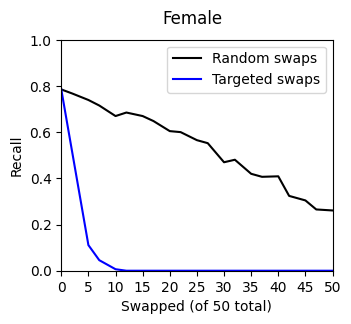

In [129]:
label = 'Female'
start_p = 50
x_max = None
fig, ax = plt.subplots(1, 1, figsize=(3.5, 3))#, dpi=200)
fig.suptitle(label)
rdf = swap_drop_results[label][start_p]
ax.plot(rdf['random_swap'].loc[:x_max]['Recall'], 
        label='Random swaps', color=colors[0])
ax.plot(rdf['targeted_swap'].loc[:x_max]['Recall'], 
        label='Targeted swaps', color=colors[1])
ax.set_xlim(0, start_p)
ax.set_xlabel('Swapped (of %s total)' % start_p)
ax.set_xticks(rdf['random_swap'].index[::2])
ax.legend()
ax.set_ylim(0,1)
_ = ax.set_ylabel('Recall')

In [130]:
start_ps

[50, 100, 150, 200, 250, 300, 350, 400, 450, 500]

Female


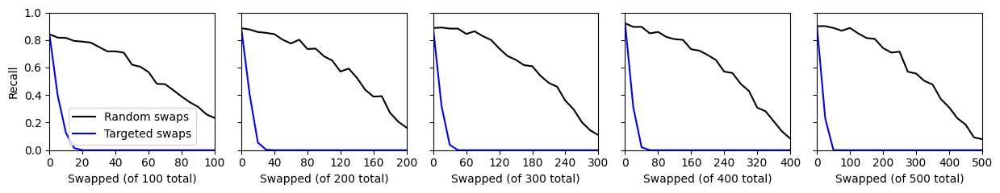

In [131]:
x_max = None
label = 'Female'
plot_start_ps = [100,200,300,400,500]
cols = len(plot_start_ps)
fig, axes = plt.subplots(1, cols, figsize=(2.5*cols, 2.5), sharey=True)
# fig.suptitle(label)
print(label)
for i, start_p in enumerate(plot_start_ps):
    ax = axes[i]
    rdf = swap_drop_results[label][start_p]
    ax.plot(rdf['random_swap'].loc[:x_max]['Recall'], 
            label='Random swaps', color=colors[0])
    ax.plot(rdf['targeted_swap'].loc[:x_max]['Recall'], 
            label='Targeted swaps', color=colors[1])
    ax.set_xlim(0, start_p)
    ax.set_xlabel('Swapped (of %s total)' % start_p)
    ax.set_xticks(rdf['random_swap'].index[::4])
    if i==0:
        ax.legend()
        ax.set_ylim(0,1)
        ax.set_ylabel('Recall')
plt.tight_layout()

Female


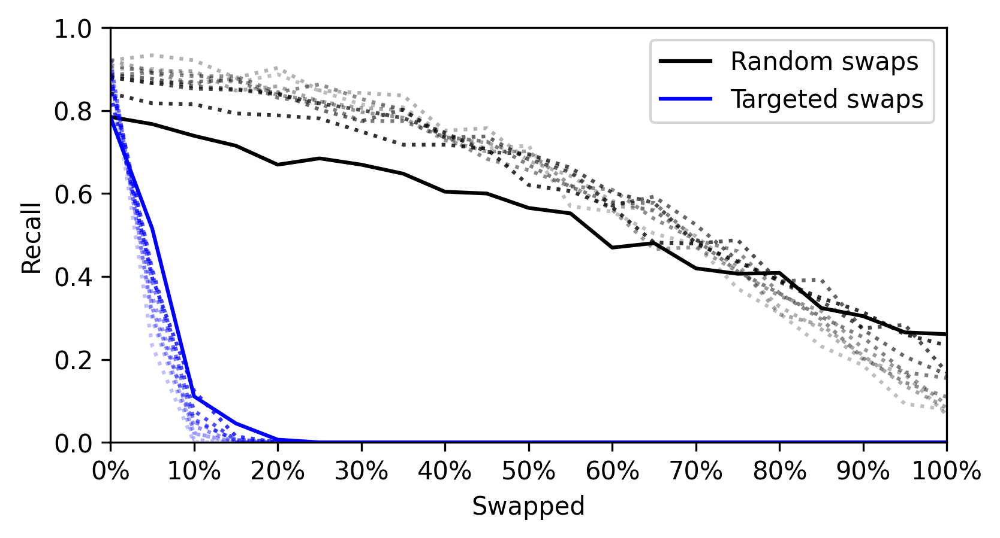

In [132]:
import matplotlib.ticker as mtick
label = 'Female'
idx = [(p*100) for p in ps]
alphas = [1,0.8,0.7,0.6,0.5,0.45,0.4,0.35,0.3,0.25,0.2]
fig, ax = plt.subplots(1, 1, figsize=(6,3), dpi=300)
#ax.set_title(label)
print(label)
for i, start_p in enumerate(start_ps):
    rdf = swap_drop_results[label][start_p]
    linestyle = (':' if i>0 else '-')
    ax.plot(idx, rdf['random_swap']['Recall'], 
            label='Random swaps', color=colors[0], alpha=alphas[i], linestyle=linestyle)
    ax.plot(idx, rdf['targeted_swap']['Recall'], 
            label='Targeted swaps', color=colors[1], alpha=alphas[i], linestyle=linestyle)
    if i==0: ax.legend()
    ax.set_xlim(0, 100)
    ax.set_xticks(idx[::2])
    ax.xaxis.set_major_formatter(mtick.PercentFormatter())
    ax.set_ylim(0,1)
    ax.set_ylabel('Recall')
    ax.set_xlabel('Swapped')

In [133]:
print('Numeric results')
for i, start_p in enumerate(start_ps):
    rdf = swap_drop_results[label][start_p]
    for swap_type in ['random_swap','targeted_swap']:
        print('Starting # purchases: %s' % start_p)
        print(swap_type)
        display(rdf[swap_type]['Recall'].to_frame().round(3))

Numeric results
Starting # purchases: 50
random_swap


,Recall
p,
0,0.785
2,0.767
5,0.739
7,0.715
10,0.670
12,0.685
15,0.670
17,0.648
20,0.604


Starting # purchases: 50
targeted_swap


,Recall
p,
0,0.785
2,0.515
5,0.111
7,0.046
10,0.007
12,0.000
15,0.000
17,0.000
20,0.000


Starting # purchases: 100
random_swap


,Recall
p,
0,0.842
5,0.818
10,0.815
15,0.793
20,0.788
25,0.781
30,0.749
35,0.718
40,0.718


Starting # purchases: 100
targeted_swap


,Recall
p,
0,0.842
5,0.397
10,0.124
15,0.015
20,0.000
25,0.000
30,0.000
35,0.000
40,0.000


Starting # purchases: 150
random_swap


,Recall
p,
0,0.880
7,0.866
15,0.853
22,0.850
30,0.839
37,0.817
45,0.801
52,0.782
60,0.747


Starting # purchases: 150
targeted_swap


,Recall
p,
0,0.880
7,0.417
15,0.076
22,0.005
30,0.003
37,0.000
45,0.000
52,0.000
60,0.000


Starting # purchases: 200
random_swap


,Recall
p,
0,0.886
10,0.877
20,0.858
30,0.852
40,0.843
50,0.802
60,0.775
70,0.802
80,0.735


Starting # purchases: 200
targeted_swap


,Recall
p,
0,0.886
10,0.407
20,0.056
30,0.003
40,0.000
50,0.000
60,0.000
70,0.000
80,0.000


Starting # purchases: 250
random_swap


,Recall
p,
0,0.880
12,0.866
25,0.870
37,0.873
50,0.831
62,0.817
75,0.775
87,0.775
100,0.736


Starting # purchases: 250
targeted_swap


,Recall
p,
0,0.880
12,0.387
25,0.049
37,0.007
50,0.000
62,0.000
75,0.000
87,0.000
100,0.000


Starting # purchases: 300
random_swap


,Recall
p,
0,0.887
15,0.891
30,0.883
45,0.883
60,0.844
75,0.863
90,0.828
105,0.801
120,0.738


Starting # purchases: 300
targeted_swap


,Recall
p,
0,0.887
15,0.324
30,0.039
45,0.000
60,0.000
75,0.000
90,0.000
105,0.000
120,0.000


Starting # purchases: 350
random_swap


,Recall
p,
0,0.910
17,0.891
35,0.864
52,0.878
70,0.837
87,0.824
105,0.796
122,0.783
140,0.729


Starting # purchases: 350
targeted_swap


,Recall
p,
0,0.910
17,0.353
35,0.023
52,0.000
70,0.000
87,0.000
105,0.000
122,0.000
140,0.000


Starting # purchases: 400
random_swap


,Recall
p,
0,0.921
20,0.895
40,0.895
60,0.848
80,0.859
100,0.822
120,0.806
140,0.801
160,0.733


Starting # purchases: 400
targeted_swap


,Recall
p,
0,0.921
20,0.309
40,0.021
60,0.000
80,0.000
100,0.000
120,0.000
140,0.000
160,0.000


Starting # purchases: 450
random_swap


,Recall
p,
0,0.921
22,0.933
45,0.921
67,0.879
90,0.903
112,0.848
135,0.842
157,0.836
180,0.752


Starting # purchases: 450
targeted_swap


,Recall
p,
0,0.921
22,0.297
45,0.006
67,0.000
90,0.000
112,0.000
135,0.000
157,0.000
180,0.000


Starting # purchases: 500
random_swap


,Recall
p,
0,0.901
25,0.901
50,0.887
75,0.868
100,0.887
125,0.848
150,0.815
175,0.808
200,0.742


Starting # purchases: 500
targeted_swap


,Recall
p,
0,0.901
25,0.232
50,0.000
75,0.000
100,0.000
125,0.000
150,0.000
175,0.000
200,0.000


Results for male in case anyone asks

Male


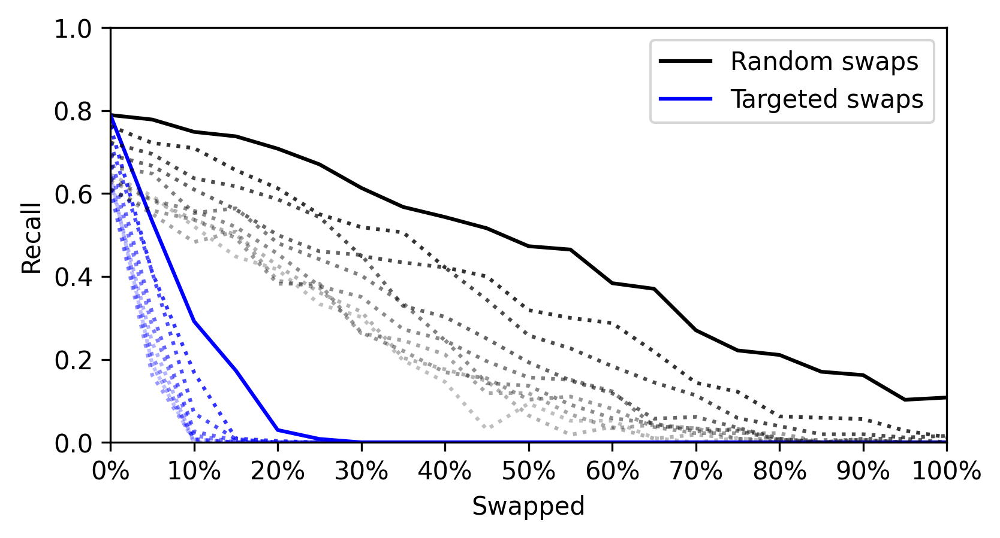

In [134]:
import matplotlib.ticker as mtick
label = 'Male'
idx = [(p*100) for p in ps]
alphas = [1,0.8,0.7,0.6,0.5,0.45,0.4,0.35,0.3,0.25,0.2]
fig, ax = plt.subplots(1, 1, figsize=(6,3), dpi=300)
#ax.set_title(label)
print(label)
for i, start_p in enumerate(start_ps):
    rdf = swap_drop_results[label][start_p]
    linestyle = (':' if i>0 else '-')
    ax.plot(idx, rdf['random_swap']['Recall'], 
            label='Random swaps', color=colors[0], alpha=alphas[i], linestyle=linestyle)
    ax.plot(idx, rdf['targeted_swap']['Recall'], 
            label='Targeted swaps', color=colors[1], alpha=alphas[i], linestyle=linestyle)
    if i==0: ax.legend()
    ax.set_xlim(0, 100)
    ax.set_xticks(idx[::2])
    ax.xaxis.set_major_formatter(mtick.PercentFormatter())
    ax.set_ylim(0,1)
    ax.set_ylabel('Recall')
    ax.set_xlabel('Swapped')

Here's showing how this gets weird for targeted drops.



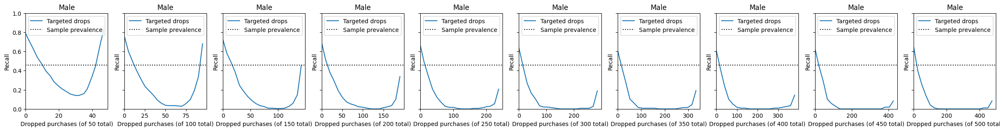

In [135]:
x_max = None
label = 'Male'
cols = len(start_ps)
fig, axes = plt.subplots(1, cols, figsize=(3*cols, 3), sharey=True)
for i, start_p in enumerate(start_ps):
    ax = axes[i]
    rdf = swap_drop_results[label][start_p]['targeted_drop']
    ax.set_title(label)
    ax.plot(rdf.loc[:x_max]['Recall'], label='Targeted drops')
    ax.axhline(swap_drop_results[label]['prevalence'], label='Sample prevalence', linestyle=':', color='black')
    ax.legend()
    ax.set_xlim(0, x_max)
    ax.set_ylim(0,1)
    ax.set_ylabel('Recall')
    ax.set_xlabel('Dropped purchases (of %s total)' % start_p)

## Additional analysis explorations

### Personal risk: By amount of purchases

Are users who purchase more often, or a larger number of *different* products more at risk?


Make a df showing participants' purchasing behavior numbers
- ResponseId
- purchases (total purchases)
- products (distinct products)
- categories (distinct categories)

In [136]:
purchase_behavior_df = p50u_per_user_stats
purchase_behavior_df.head()

,purchases,products,categories,Male,Female,18 - 34 yrs,35 - 54 yrs,55+ yrs,White,Asian,Black,Diabetes,Cigarettes,Marijuana,Alcohol
Survey ResponseID,,,,,,,,,,,,,,,
R_01vNIayewjIIKMF,140,102,51,1,0,0,1,0,0,0,1,0.0,0.0,0.0,0.0
R_037XK72IZBJyF69,1213,1000,403,0,1,0,0,1,1,0,0,0.0,0.0,0.0,1.0
R_038ZU6kfQ5f89fH,69,62,38,1,0,1,0,0,1,0,0,0.0,0.0,0.0,0.0
R_03aEbghUILs9NxD,173,135,86,1,0,0,1,0,1,0,0,0.0,0.0,0.0,0.0
R_06RZP9pS7kONINr,430,385,197,0,1,0,0,1,1,0,0,1.0,0.0,0.0,0.0


For each label, take our trained models and collect the prediction probabilities for the test users where the label does apply (label=1).



In [137]:
# {label: <<df with a row for each rid s.t. label=1>>}
l1_probabilities_v_behavior = dict()
use_labels = X_y_data.keys()
for i, label in enumerate(use_labels):
    print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), i+1, len(use_labels), label))
    X_train, X_test, y_train, y_test = X_y_data[label]['train_test_split']
    clf = svm.SVC(probability=True, class_weight='balanced')
    clf.fit(X_train, y_train)
    # Get the test users s.t. label=1
    l1_y_test_rids = y_test[y_test == 1].index.tolist()
    l1_probabilities_v_behavior[label] = pd.DataFrame({
        RESPONSE_ID: l1_y_test_rids,
        'Pred. Prob': clf.predict_proba(X_test.loc[l1_y_test_rids])[:, 1],
    }).set_index(RESPONSE_ID).merge(
        purchase_behavior_df, left_index=True, right_index=True, how='inner'
    )


2024-11-17 05:25:24.221372
1/16: SVM for Male

2024-11-17 05:25:58.700719
2/16: SVM for Female

2024-11-17 05:26:33.958567
3/16: SVM for 18 - 34 yrs

2024-11-17 05:27:18.574252
4/16: SVM for 35 - 54 yrs

2024-11-17 05:28:05.862219
5/16: SVM for 55+ yrs

2024-11-17 05:28:38.788174
6/16: SVM for White

2024-11-17 05:29:19.827696
7/16: SVM for Black

2024-11-17 05:29:52.478484
8/16: SVM for Asian

2024-11-17 05:30:37.881378
9/16: SVM for Hispanic

2024-11-17 05:31:19.395791
10/16: SVM for Less than $50,000

2024-11-17 05:32:11.177822
11/16: SVM for \$50,000 - \$99,999

2024-11-17 05:33:01.889036
12/16: SVM for $100,000 or more

2024-11-17 05:33:46.023213
13/16: SVM for Diabetes

2024-11-17 05:34:28.280084
14/16: SVM for Cigarettes

2024-11-17 05:35:10.382068
15/16: SVM for Marijuana

2024-11-17 05:35:56.219672
16/16: SVM for Alcohol


#### Plot the results 

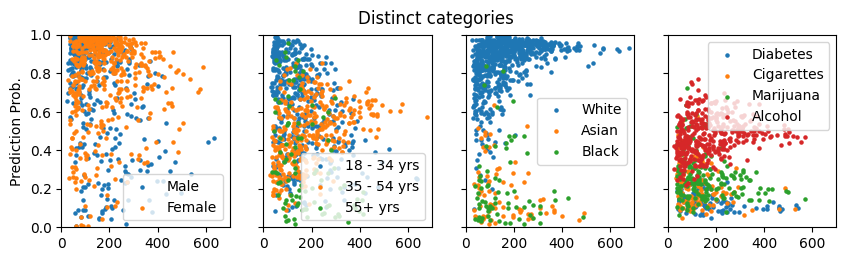

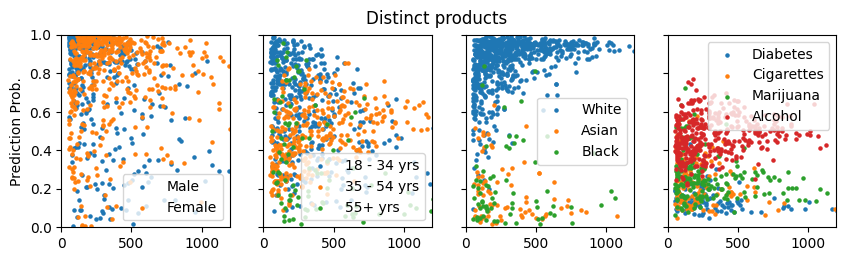

In [139]:
# Total purchases

cols = len(socio_groups)
fig, axes = plt.subplots(1,cols, figsize=(2.5*cols,2.5), sharey=True, sharex=True)
for i, (socio, labels) in enumerate(socio_groups.items()):
    ax = axes[i]
    if i == 0:
        ax.set_ylabel('Prediction Prob.')
        ax.set_xlim(0, 700)
        ax.set_ylim(0, 1)
    for label in labels:
        df = l1_probabilities_v_behavior[label]
        ax.scatter(df['categories'], df['Pred. Prob'], label=label, s=5)
    ax.legend()
fig.suptitle('Distinct categories')
plt.show()

fig, axes = plt.subplots(1,cols, figsize=(2.5*cols,2.5), sharey=True, sharex=True)
for i, (socio, labels) in enumerate(socio_groups.items()):
    ax = axes[i]
    if i == 0:
        ax.set_ylabel('Prediction Prob.')
        ax.set_xlim(0, 1200)
        ax.set_ylim(0, 1)
    for label in labels:
        df = l1_probabilities_v_behavior[label]
        ax.scatter(df['products'], df['Pred. Prob'], label=label, s=5)
    ax.legend()
fig.suptitle('Distinct products')
plt.show()

---

### More analysis for single purchasers vs non-single purchasers

Take random sample of same n who are not single purchasers.

#### Run the models for single purchaser users

Be careful with analysis results -- n is likely too small for meaningful analysis of many groups. e.g. see confusion matrix for race groups.


2024-11-17 09:15:20.140802
1/16: SVM for Male
Mean accuracy: 0.9333
ROC AUC=0.969

2024-11-17 09:15:22.383607
2/16: SVM for Female
Mean accuracy: 0.8833
ROC AUC=0.950

2024-11-17 09:15:24.601830
3/16: SVM for 18 - 34 yrs
Mean accuracy: 0.6944
ROC AUC=0.767

2024-11-17 09:15:27.043876
4/16: SVM for 35 - 54 yrs
Mean accuracy: 0.6556
ROC AUC=0.601

2024-11-17 09:15:29.526697
5/16: SVM for 55+ yrs
Mean accuracy: 0.8722
ROC AUC=0.903

2024-11-17 09:15:31.819769
6/16: SVM for White
Mean accuracy: 0.8444
ROC AUC=0.668

2024-11-17 09:15:34.194799
7/16: SVM for Black
Mean accuracy: 0.9222
ROC AUC=0.849

2024-11-17 09:15:36.327159
8/16: SVM for Asian
Mean accuracy: 0.9167
ROC AUC=0.707

2024-11-17 09:15:38.496110
9/16: SVM for Hispanic
Mean accuracy: 0.9167
ROC AUC=0.537

2024-11-17 09:15:40.718667
10/16: SVM for Less than $50,000
Mean accuracy: 0.6833
ROC AUC=0.680

2024-11-17 09:15:43.204154
11/16: SVM for \$50,000 - \$99,999
Mean accuracy: 0.6722
ROC AUC=0.581

2024-11-17 09:15:45.638803
12/

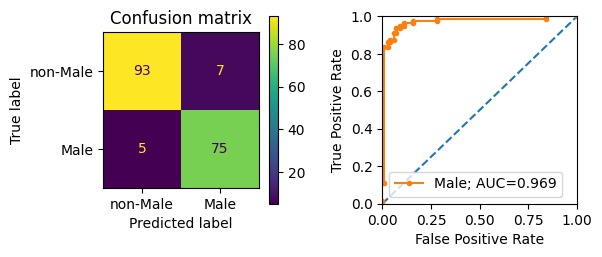

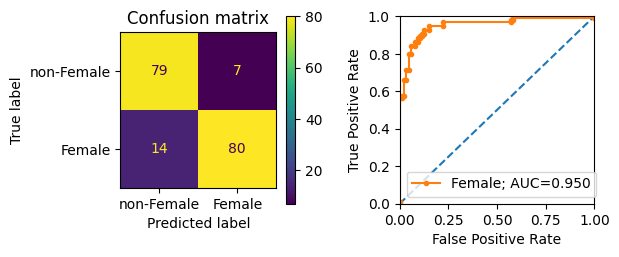

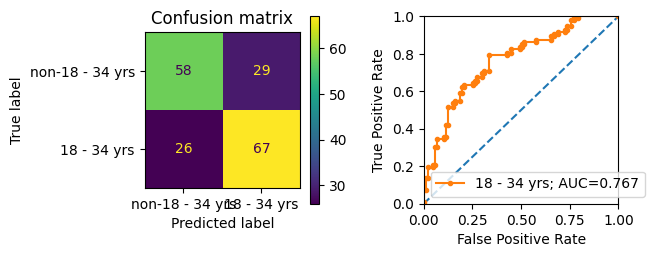

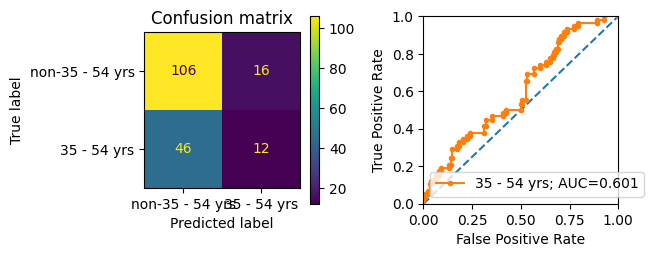

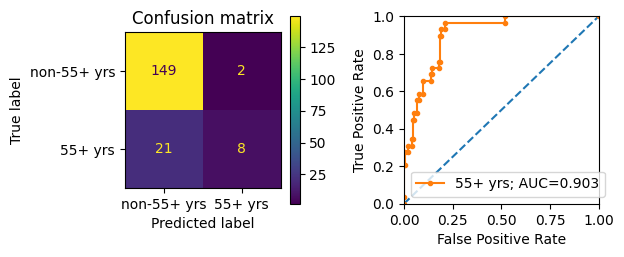

...

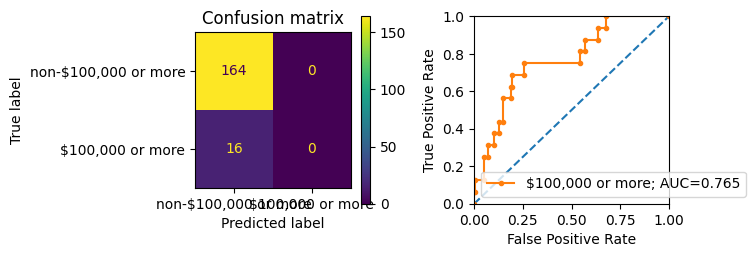

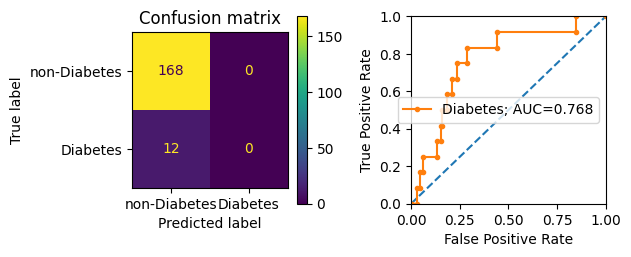

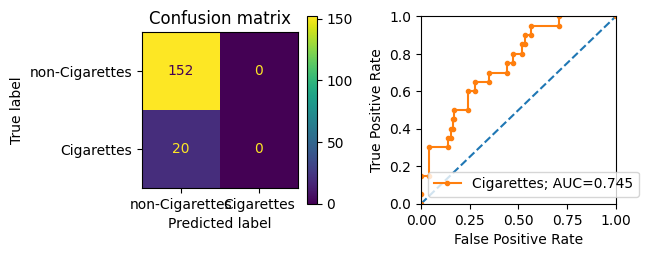

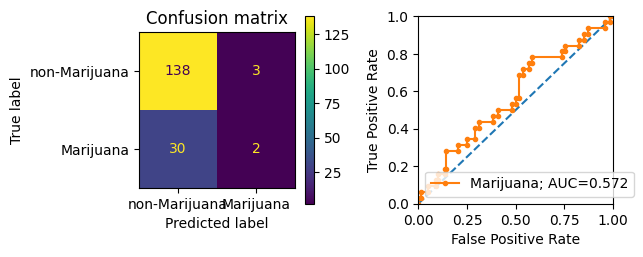

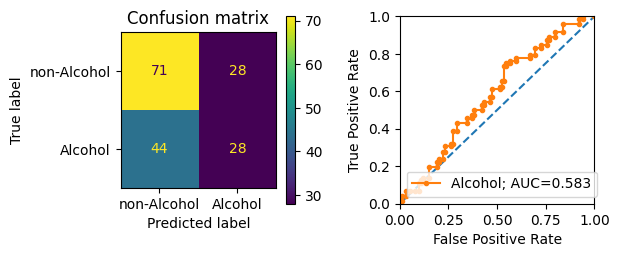

In [140]:
X_y_data_single_purchaser = setup_labeled_X_y_data(X_single_purchaser, labeled_y)
# results dict: map label to svm results
onehot_svm_results_single_p = dict()
use_labels = X_y_data.keys()
for i, label in enumerate(use_labels):
    print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), i+1, len(use_labels), label))
    X_train, X_test, y_train, y_test = X_y_data_single_purchaser[label]['train_test_split']
    clf = svm.SVC(probability=True, class_weight='balanced')
    clf.fit(X_train, y_train)
    auc = get_auc_and_plot(clf, X_test, y_test)
    onehot_svm_results_single_p[label] = auc


2024-11-17 09:15:58.098801
1/16: SVM for Male
Mean accuracy: 0.8073
ROC AUC=0.869

2024-11-17 09:16:01.435455
2/16: SVM for Female
Mean accuracy: 0.7752
ROC AUC=0.848

2024-11-17 09:16:04.680737
3/16: SVM for 18 - 34 yrs
Mean accuracy: 0.6972
ROC AUC=0.754

2024-11-17 09:16:08.157564
4/16: SVM for 35 - 54 yrs
Mean accuracy: 0.6422
ROC AUC=0.684

2024-11-17 09:16:11.646444
5/16: SVM for 55+ yrs
Mean accuracy: 0.9083
ROC AUC=0.769

2024-11-17 09:16:14.717928
6/16: SVM for White
Mean accuracy: 0.7844
ROC AUC=0.722

2024-11-17 09:16:18.049203
7/16: SVM for Black
Mean accuracy: 0.8991
ROC AUC=0.667

2024-11-17 09:16:21.089846
8/16: SVM for Asian
Mean accuracy: 0.8899
ROC AUC=0.740

2024-11-17 09:16:24.051276
9/16: SVM for Hispanic
Mean accuracy: 0.8624
ROC AUC=0.542

2024-11-17 09:16:27.445262
10/16: SVM for Less than $50,000
Mean accuracy: 0.6697
ROC AUC=0.693

2024-11-17 09:16:31.059896
11/16: SVM for \$50,000 - \$99,999
Mean accuracy: 0.5826
ROC AUC=0.498

2024-11-17 09:16:34.698874
12/

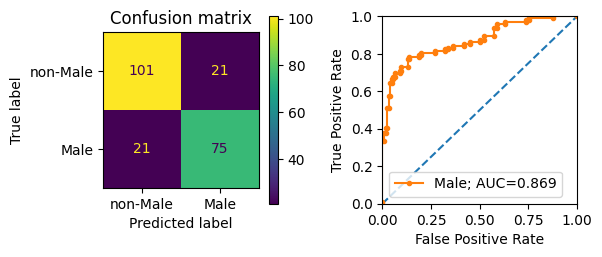

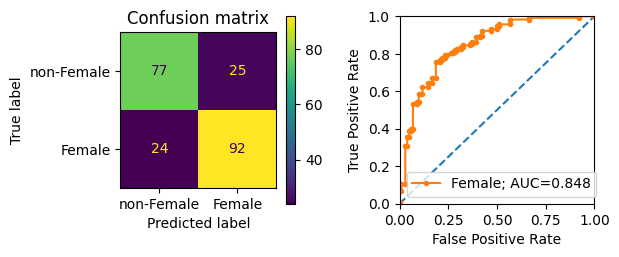

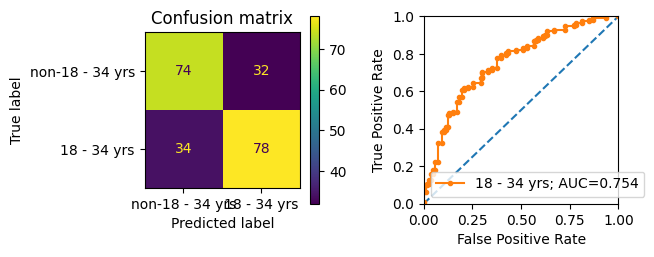

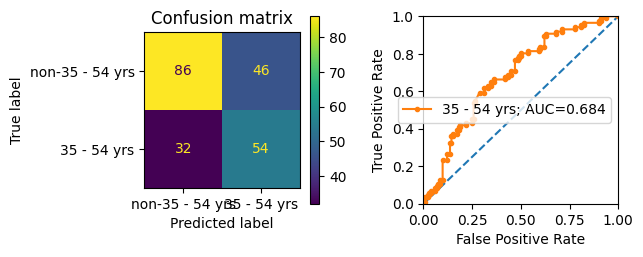

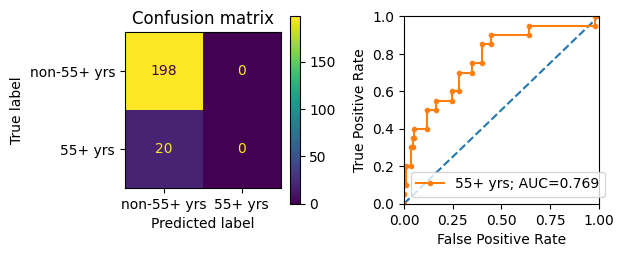

...

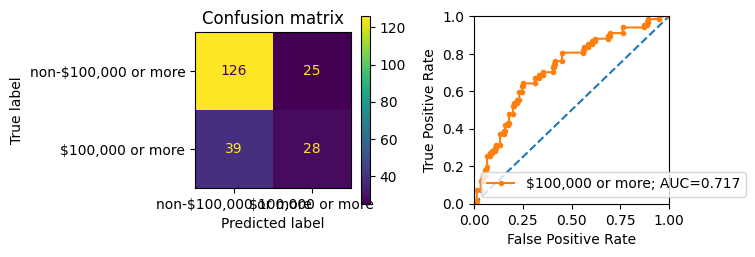

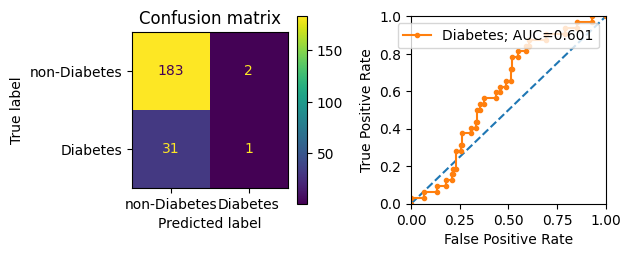

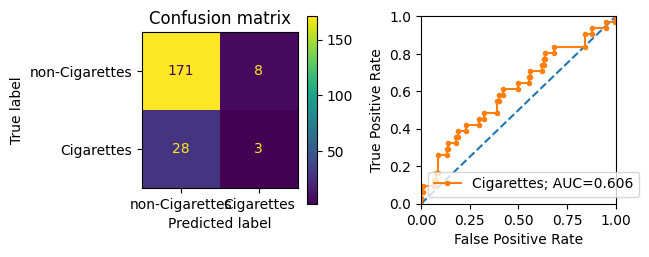

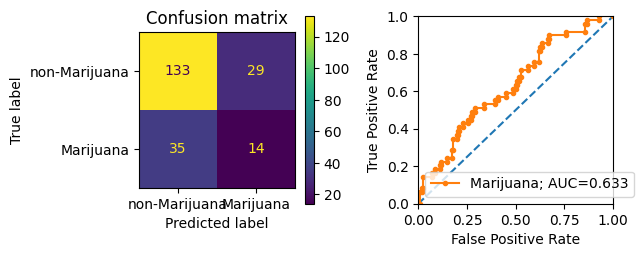

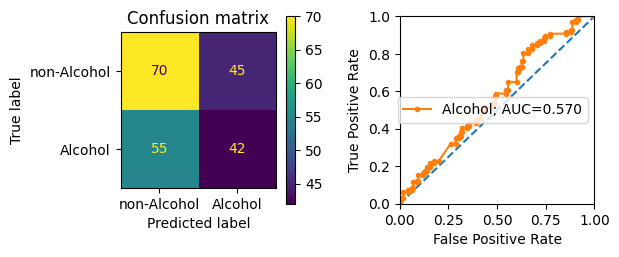

In [141]:
n = len(single_purchaser_rids)

X_y_data_nonsingle_purchaser = setup_labeled_X_y_data(
    X_nonsingle_purchaser.sample(n=n, replace=False, random_state=RANDOM), 
    labeled_y)
# results dict: map label to svm results
onehot_svm_results_nonsingle_p = dict()
use_labels = X_y_data.keys()
for i, label in enumerate(use_labels):
    print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), i+1, len(use_labels), label))
    X_train, X_test, y_train, y_test = X_y_data_nonsingle_purchaser[label]['train_test_split']
    clf = svm.SVC(probability=True, class_weight='balanced')
    clf.fit(X_train, y_train)
    auc = get_auc_and_plot(clf, X_test, y_test)
    onehot_svm_results_nonsingle_p[label] = auc

In [142]:
# show a table with the AUROC scores
pd.DataFrame({
    'AUC | single purchasers (n=898)': onehot_svm_results_single_p.values(),
    'AUC | non-single purchasers (random n=898)': onehot_svm_results_nonsingle_p.values(),
}, index=list(onehot_svm_results_single_p.keys())).round(3)

,AUC | single purchasers (n=898),AUC | non-single purchasers (random n=898)
Male,0.969,0.869
Female,0.950,0.848
18 - 34 yrs,0.767,0.754
35 - 54 yrs,0.601,0.684
55+ yrs,0.903,0.769
White,0.668,0.722
Black,0.849,0.667
Asian,0.707,0.740
Hispanic,0.537,0.542
"Less than $50,000",0.680,0.693


### Single login users

Single purchaser approach creates very limited subsample. Also try limiting to SINGLE_LOGIN: do not share login.

In [143]:
SINGLE_LOGIN = 'Single login'

def is_single_login(row):
    return (row['Q-amazon-use-howmany']=='1 (just me!)')

survey_df[SINGLE_LOGIN] = survey_df.apply(is_single_login, axis=1)
single_login_rids = survey_df[survey_df[SINGLE_LOGIN]==True].index.tolist()
# get rids for users who are both in list that purchased >= 50 p, and single logins

In [144]:
X_single_login = X.loc[list(set.intersection(set(single_login_rids), set(p50_users)))]
n_single_login_users = len(X_single_login)
print('%s/%s of the users who purchased at least 50 products are single login users' % (
n_single_login_users, len(X)))
# X_single_login.head(3)

2843/4248 of the users who purchased at least 50 products are single login users


#### Run the models for single login users


2024-11-17 09:16:53.161748
1/16: SVM for Male
Mean accuracy: 0.8875
ROC AUC=0.946

2024-11-17 09:17:09.492692
2/16: SVM for Female
Mean accuracy: 0.9016
ROC AUC=0.954

2024-11-17 09:17:25.831227
3/16: SVM for 18 - 34 yrs
Mean accuracy: 0.7399
ROC AUC=0.823

2024-11-17 09:17:48.354982
4/16: SVM for 35 - 54 yrs
Mean accuracy: 0.6854
ROC AUC=0.722

2024-11-17 09:18:13.106070
5/16: SVM for 55+ yrs
Mean accuracy: 0.8928
ROC AUC=0.895

2024-11-17 09:18:30.715320
6/16: SVM for White
Mean accuracy: 0.7944
ROC AUC=0.742

2024-11-17 09:18:51.437727
7/16: SVM for Black
Mean accuracy: 0.9016
ROC AUC=0.820

2024-11-17 09:19:08.209411
8/16: SVM for Asian
Mean accuracy: 0.9104
ROC AUC=0.740

2024-11-17 09:19:25.640485
9/16: SVM for Hispanic
Mean accuracy: 0.8664
ROC AUC=0.569

2024-11-17 09:19:47.185772
10/16: SVM for Less than $50,000
Mean accuracy: 0.6151
ROC AUC=0.666

2024-11-17 09:20:12.859705
11/16: SVM for \$50,000 - \$99,999
Mean accuracy: 0.5554
ROC AUC=0.498

2024-11-17 09:20:37.825093
12/

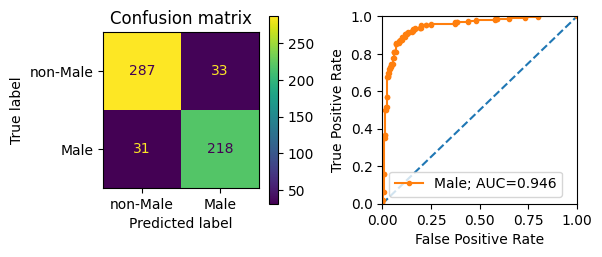

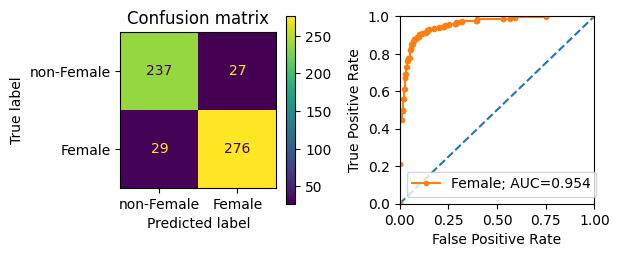

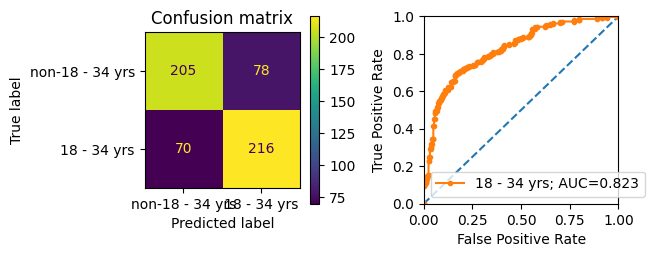

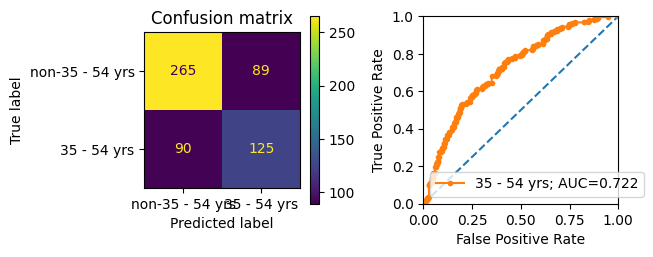

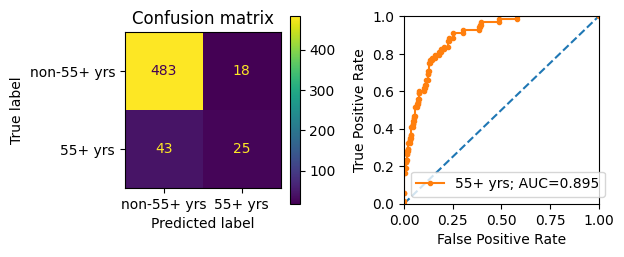

...

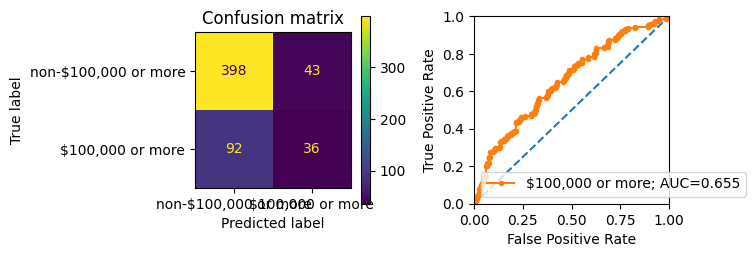

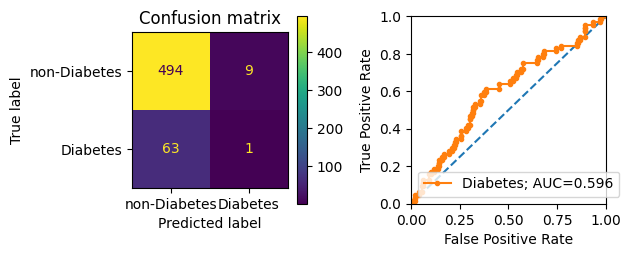

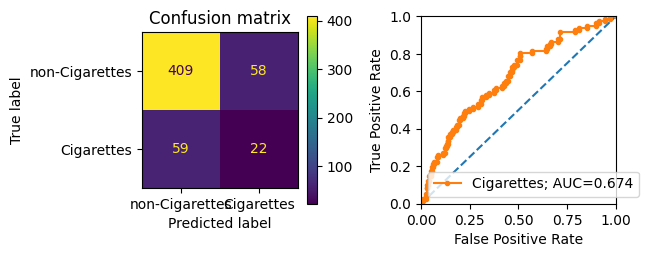

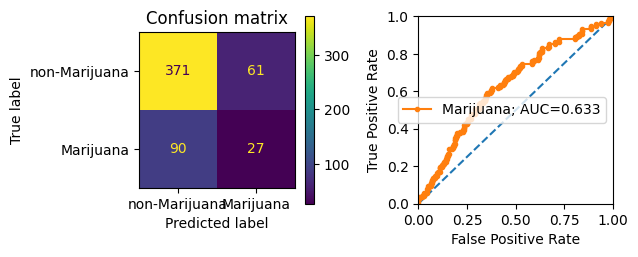

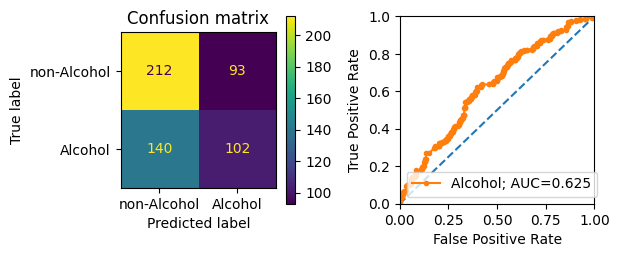

In [145]:
X_y_data_single_login = setup_labeled_X_y_data(X_single_login, labeled_y)
# results dict: map label to svm results
onehot_svm_results_single_l = dict()
use_labels = X_y_data.keys()
for i, label in enumerate(use_labels):
    print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), i+1, len(use_labels), label))
    X_train, X_test, y_train, y_test = X_y_data_single_login[label]['train_test_split']
    clf = svm.SVC(probability=True, class_weight='balanced')
    clf.fit(X_train, y_train)
    auc = get_auc_and_plot(clf, X_test, y_test)
    onehot_svm_results_single_l[label] = auc

In [146]:
pd.DataFrame({
    'AUC | single login users': onehot_svm_results_single_l.values(),
}, index=list(onehot_svm_results_single_l.keys())).round(3)

,AUC | single login users
Male,0.946
Female,0.954
18 - 34 yrs,0.823
35 - 54 yrs,0.722
55+ yrs,0.895
White,0.742
Black,0.820
Asian,0.740
Hispanic,0.569
"Less than $50,000",0.666


Result: For some of these labels, model does better, for some it does worse.

Better for:
- 55 and older
- Female

In [147]:
print('n=%s for single login users' % n_single_login_users)

n=2843 for single login users


#### Comparison

Since the sample size is smaller, we should expect overall lower model performance. As a comparison we take a random sample of n=2843 users and do the same modeling task.

Randomly sampled n=2843 users from X

2024-11-17 09:22:29.527530
1/16: SVM for Male
Mean accuracy: 0.8260
ROC AUC=0.907

2024-11-17 09:22:48.625270
2/16: SVM for Female
Mean accuracy: 0.8243
ROC AUC=0.909

2024-11-17 09:23:08.588040
3/16: SVM for 18 - 34 yrs
Mean accuracy: 0.7118
ROC AUC=0.791

2024-11-17 09:23:31.329294
4/16: SVM for 35 - 54 yrs
Mean accuracy: 0.6977
ROC AUC=0.745

2024-11-17 09:23:55.820584
5/16: SVM for 55+ yrs
Mean accuracy: 0.8752
ROC AUC=0.823

2024-11-17 09:24:13.485284
6/16: SVM for White
Mean accuracy: 0.8049
ROC AUC=0.764

2024-11-17 09:24:36.054965
7/16: SVM for Black
Mean accuracy: 0.9033
ROC AUC=0.795

2024-11-17 09:24:53.186745
8/16: SVM for Asian
Mean accuracy: 0.8858
ROC AUC=0.762

2024-11-17 09:25:11.176873
9/16: SVM for Hispanic
Mean accuracy: 0.8541
ROC AUC=0.607

2024-11-17 09:25:33.014300
10/16: SVM for Less than $50,000
Mean accuracy: 0.6591
ROC AUC=0.715

2024-11-17 09:25:57.153717
11/16: SVM for \$50,000 - \$99,999
Mean accuracy: 0.5518
ROC AUC=

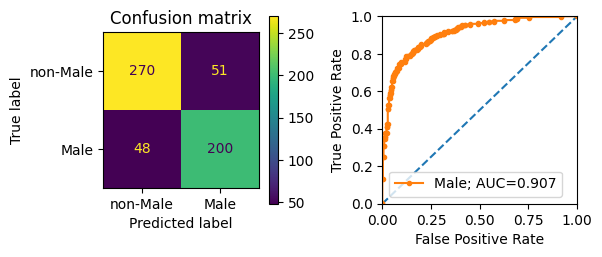

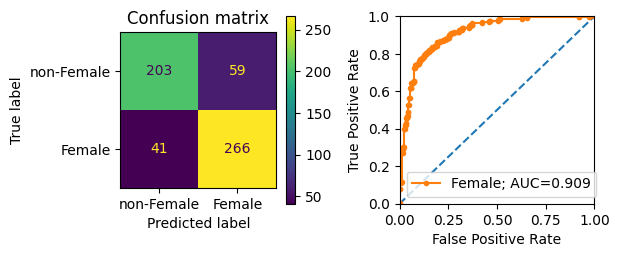

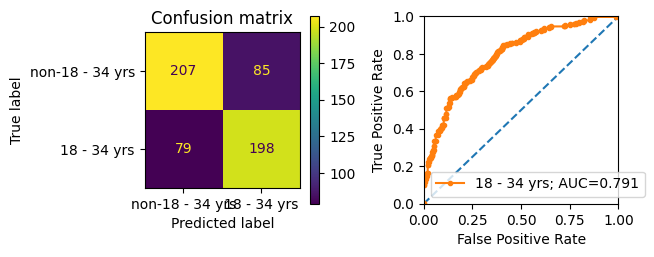

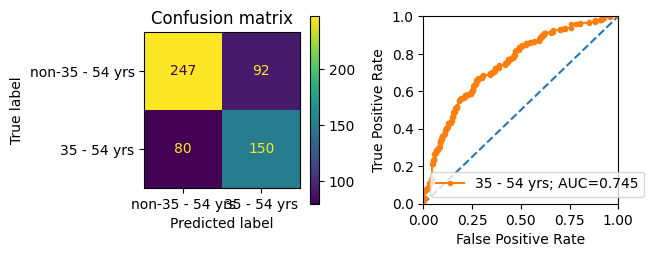

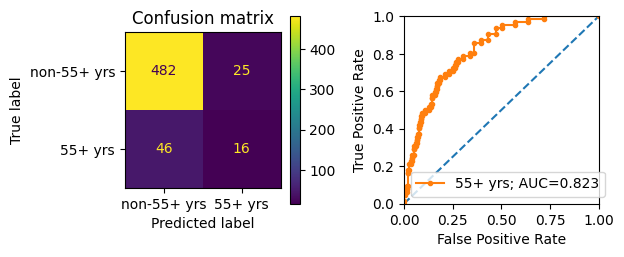

...

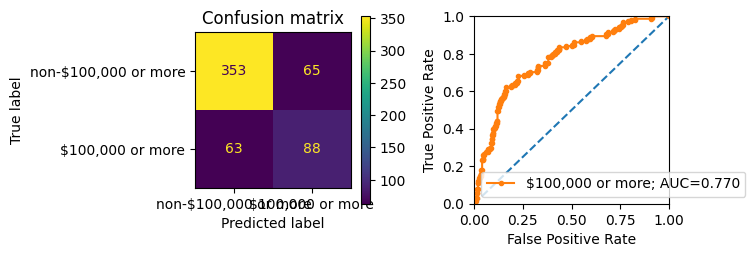

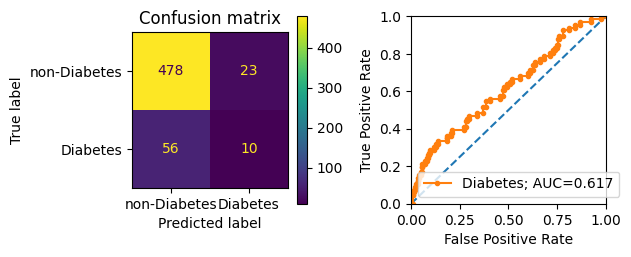

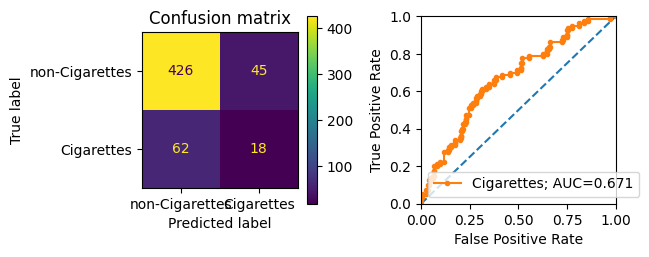

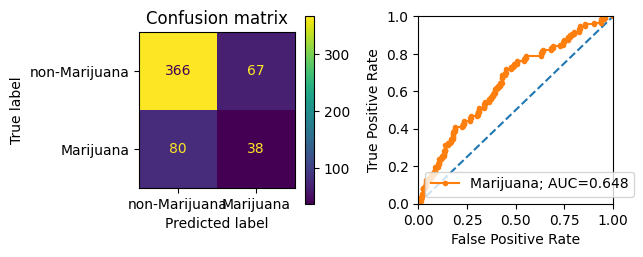

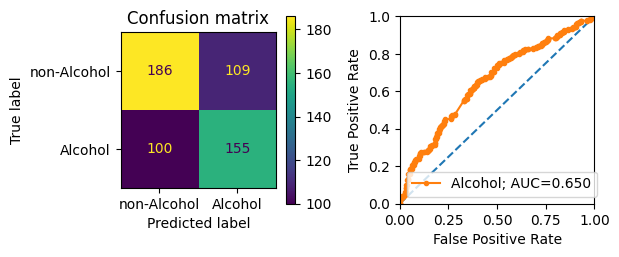

In [148]:
X_single_login_comparison = X.sample(n=n_single_login_users, replace=False, random_state=RANDOM)
print('Randomly sampled n=%s users from X' % len(X_single_login_comparison))
X_y_data_single_login_comparison = setup_labeled_X_y_data(X_single_login_comparison, labeled_y)
# results dict: map label to svm results
onehot_svm_results_single_l_comparison = dict()
use_labels = X_y_data.keys()
for i, label in enumerate(use_labels):
    print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), i+1, len(use_labels), label))
    X_train, X_test, y_train, y_test = X_y_data_single_login_comparison[label]['train_test_split']
    clf = svm.SVC(probability=True, class_weight='balanced')
    clf.fit(X_train, y_train)
    auc = get_auc_and_plot(clf, X_test, y_test)
    onehot_svm_results_single_l_comparison[label] = auc

In [149]:
pd.DataFrame({
    'AUC | single login users (n=2843)': onehot_svm_results_single_l.values(),
    'AUC | random comparison sample (n=2843)': onehot_svm_results_single_l_comparison.values(),
}, index=list(onehot_svm_results_single_l.keys())).round(3)

,AUC | single login users (n=2843),AUC | random comparison sample (n=2843)
Male,0.946,0.907
Female,0.954,0.909
18 - 34 yrs,0.823,0.791
35 - 54 yrs,0.722,0.745
55+ yrs,0.895,0.823
White,0.742,0.764
Black,0.820,0.795
Asian,0.740,0.762
Hispanic,0.569,0.607
"Less than $50,000",0.666,0.715


---